In [32]:
import warnings
warnings.filterwarnings(action='ignore') 

In [33]:
import pandas as pd

df = pd.read_excel("/Users/jeongdahye/Downloads/Test_Corrosion.xlsx")

print(df)

    Unnamed: 0     Start                  End  Temp  Pressure   CO2  \
0            1  Jan-2005             Dec-2005    55        33   3.5   
1            2  Jan-2006             Dec-2006    60        33   3.5   
2            3  Jan-2007             Dec-2007    30        33   3.5   
3            4  Jan-2008             Dec-2008    33        50   3.5   
4            5  Jan-2009             Dec-2009    45        50   4.0   
5            6  Jan-2010             Dec-2010    10        35   4.0   
6            7  Jan-2011  2011-12-01 00:00:00    10        35   4.0   
7            8  Jan-2012             Dec-2012    10        35   4.0   
8            9  Jan-2013             Dec-2013    10        35   4.0   
9           10  Jan-2014             Dec-2014    10        35   4.0   
10          11  Jan-2015             Dec-2015    10        35   4.0   
11          12  Jan-2016             Dec-2016    10        35   4.0   
12          13  Jan-2017             Dec-2017     5        40   4.0   
13    

In [34]:
df.head(10)

,Unnamed: 0,Start,End,Temp,Pressure,CO2,CO2 fugacity,Sheer Stress,PH,Glycol Conc.,Inhibitor efficiency,CorrosionRate,CumCorrosion
0,1,Jan-2005,Dec-2005,55,33,3.5,1.1,100,5.4,0,93.5,0.410,0.41
1,2,Jan-2006,Dec-2006,60,33,3.5,1.1,120,5.4,0,93.5,0.400,0.81
2,3,Jan-2007,Dec-2007,30,33,3.5,1.0,90,5.4,0,93.5,0.330,1.10
3,4,Jan-2008,Dec-2008,33,50,3.5,1.5,90,5.4,0,93.5,0.460,1.60
4,5,Jan-2009,Dec-2009,45,50,4.0,1.7,110,5.4,0,93.5,0.600,2.20
5,6,Jan-2010,Dec-2010,10,35,4.0,1.2,80,5.4,0,93.5,0.053,2.30
6,7,Jan-2011,2011-12-01 00:00:00,10,35,4.0,1.2,80,5.4,0,20.0,0.650,2.90
7,8,Jan-2012,Dec-2012,10,35,4.0,1.2,80,65,0,50.0,0.180,3.10
8,9,Jan-2013,Dec-2013,10,35,4.0,1.2,80,3.5,0,50.0,0.800,3.90
9,10,Jan-2014,Dec-2014,10,35,4.0,1.2,80,5,0,50.0,0.520,4.40


In [35]:
df.describe()

,Unnamed: 0,Temp,Pressure,CO2,CO2 fugacity,Sheer Stress,Glycol Conc.,Inhibitor efficiency,CorrosionRate,CumCorrosion
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.0,48.000000,48.000000,48.000000
mean,23.875000,31.583333,36.708333,12.316667,1.362083,57.125000,0.0,77.218750,0.869148,21.169167
std,14.234547,19.013806,18.723018,15.995882,0.509392,38.057976,0.0,27.710684,1.553071,13.770753
min,1.000000,5.000000,10.000000,3.000000,0.380000,5.000000,0.0,10.000000,0.005100,0.410000
25%,11.750000,10.000000,20.000000,3.500000,1.100000,20.000000,0.0,50.000000,0.076000,4.550000
50%,23.500000,30.000000,35.000000,4.000000,1.350000,65.000000,0.0,93.500000,0.385000,19.500000
75%,36.250000,45.000000,42.500000,10.000000,1.900000,82.500000,0.0,98.000000,0.655000,30.000000
max,48.000000,60.000000,80.000000,45.000000,2.300000,120.000000,0.0,98.000000,8.700000,45.000000


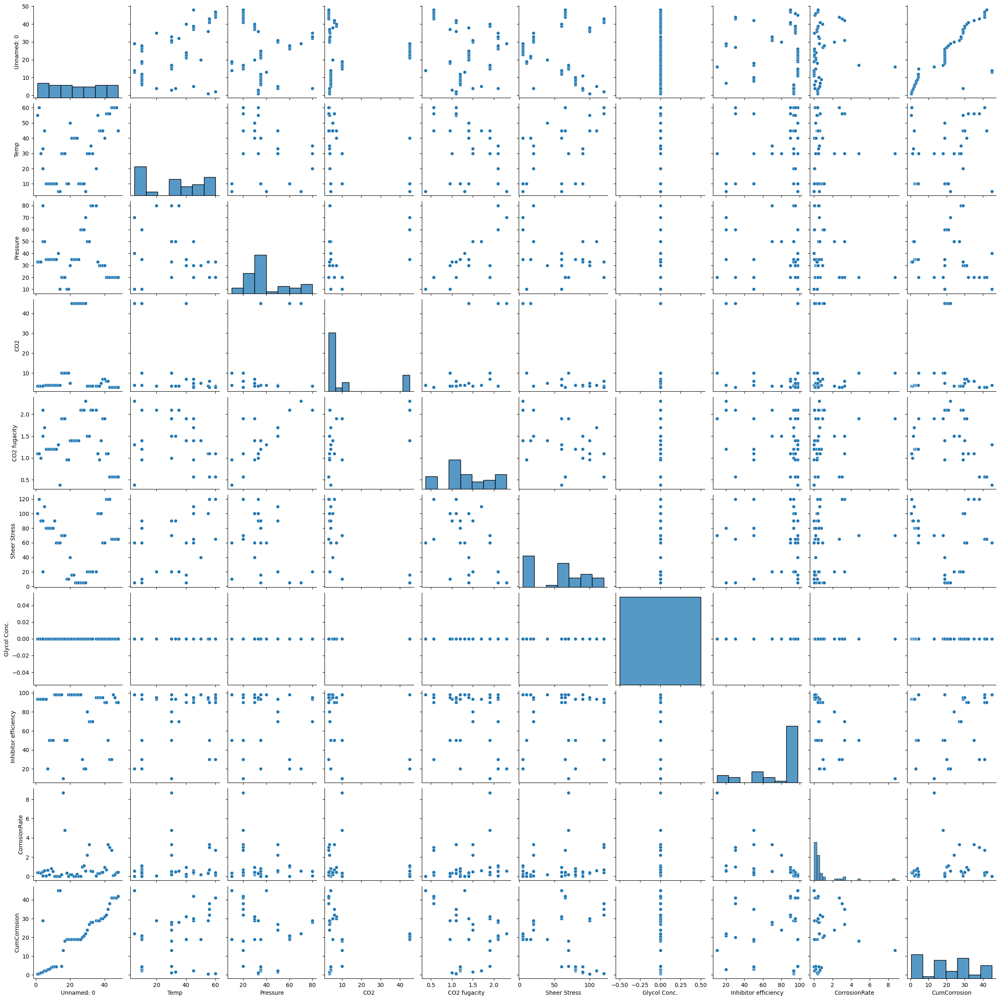

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df)

plt.show()

# Synthetic Data

In [1]:
import numpy as np
import pandas as pd

def generate_data(data_type, n_samples):
    n_samples = n_samples
    
    alpha = 3 
    beta1 = 0.5
    beta2 = 0.6
    beta3 = 0.7
    gamma1 = 2
    gamma2 = 3
    
    # Generate confounders
    X1 = np.random.normal(0, 1, size=n_samples)
    X2 = np.random.normal(0, 1, size=n_samples)
    X3 = np.random.normal(0, 1, size=n_samples)
    
    if data_type == "data1":
        # Intervention affected by confounders
        T = beta1 * X1 + np.random.normal(loc=0, scale=1, size=n_samples)
        
        # Mediator affected by intervention and confounders
        M = gamma1 * T + beta2 * X2 + np.random.normal(loc=0, scale=0.5, size=n_samples)
        
        # Outcome affected by intervention, mediator, confounders, and noise
        Y = alpha +  gamma2* T + gamma1 * M + beta1* X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        
        return pd.DataFrame({'Intervention': T, 'Mediator': M, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    elif data_type == "data2":
        # Intervention affected by confounders
        T = beta1 * X1 + np.random.normal(loc=0, scale=1, size=n_samples)
        
        # Outcome affected by intervention, confounders, and noise
        Y = alpha  + gamma2* T + beta1* X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        
        return pd.DataFrame({'Intervention': T, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    elif data_type == "data3":
        # Binary intervention possibly influenced by confounders
        prob_T = 1 / (1 + np.exp(-(X1 + X2)))  # Logistic function
        T = (np.random.rand(n_samples) < prob_T).astype(int)
    
        # Mediator affected by intervention and confounders
        M = gamma1 * T + beta1 * X1 - beta2 * X2 + np.random.normal(loc=0, scale=1, size=n_samples)
        
        # Outcomee affected by intervention, mediator, confounders, and noise
        Y = alpha + gamma2* T + gamma1 * M + beta1 * X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        
        return pd.DataFrame({'Intervention': T, 'Mediator': M, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})
    
    elif data_type == "data4":
        # Binary intervention possibly influenced by confounders
        prob_T = 1 / (1 + np.exp(-(X1 + X2)))  # Logistic function
        T = (np.random.rand(n_samples) < prob_T).astype(int)
    
        # Continuous Outcome influenced by intervention, confounders
        Y = alpha + gamma2 * T + beta1 * X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        
        return pd.DataFrame({'Intervention': T, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    else:
        raise ValueError("Unknown data type")

# Use the function in a loop
datasets = {}
for data_name in ["data1", "data2", "data3", "data4"]:
    datasets[data_name] = generate_data(data_name, 1000)

print(datasets["data2"].describe())


       Intervention           X1           X2           X3      Outcome
count   1000.000000  1000.000000  1000.000000  1000.000000  1000.000000
mean       0.000421     0.016638    -0.014485    -0.006052     3.029075
std        1.127750     1.007854     0.947310     1.038821     3.872876
min       -3.617256    -2.665234    -3.443672    -3.297173    -7.808080
25%       -0.749523    -0.670486    -0.625485    -0.645869     0.428016
50%       -0.021329    -0.025433    -0.014876     0.006541     2.829495
75%        0.714906     0.714973     0.594399     0.664118     5.666861
max        3.854519     3.730477     2.941210     3.083062    15.367140


In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import dowhy
from dowhy import CausalModel
import matplotlib.pyplot as plt

# Define the generate_data function
def generate_data(data_type, n_samples):
    alpha = 3 
    beta1 = 0.5
    beta2 = 0.6
    beta3 = 0.7
    gamma1 = 2
    gamma2 = 3
    
    # Generate confounders
    X1 = np.random.normal(0, 1, size=n_samples)
    X2 = np.random.normal(0, 1, size=n_samples)
    X3 = np.random.normal(0, 1, size=n_samples)
    
    if data_type == "data1": 
        T = beta1 * X1 +  + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        M = gamma1 * T + beta2 * X2 + np.random.normal(loc=0, scale=0.5, size=n_samples)
        Y = alpha +  gamma2* T + gamma1 * M + beta1* X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'Mediator': M, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    elif data_type == "data2":
        T = beta1 * X1 + + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        Y = alpha  + gamma2* T + beta1* X1 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    elif data_type == "data3":
        prob_T = 1 / (1 + np.exp(-(X1 + X2)))  # Logistic function
        T = (np.random.rand(n_samples) < prob_T).astype(int)
        M = gamma1 * T + beta1 * X1 - beta2 * X2 + np.random.normal(loc=0, scale=1, size=n_samples)
        Y = alpha + gamma2* T + gamma1 * M + beta1 * X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'Mediator': M, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})
    
    elif data_type == "data4":
        prob_T = 1 / (1 + np.exp(-(X1 + X2 + X3)))  # Logistic function
        T = (np.random.rand(n_samples) < prob_T).astype(int)
        Y = alpha + gamma2 * T + beta1 * X1 + beta2 * X2 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    else:
        raise ValueError("Unknown data type")

### DAG

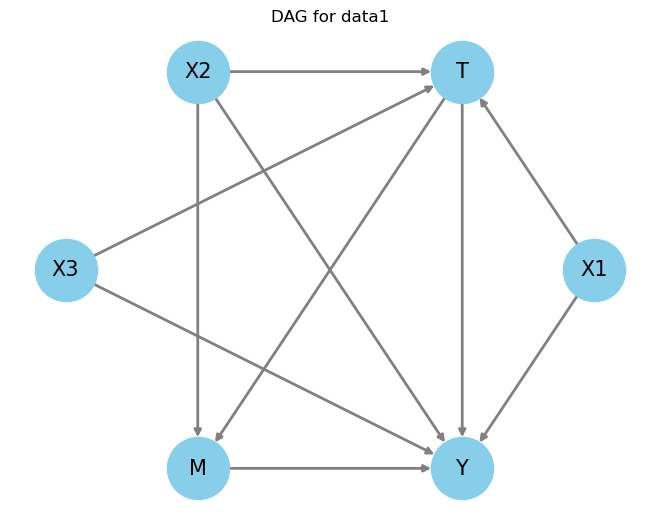

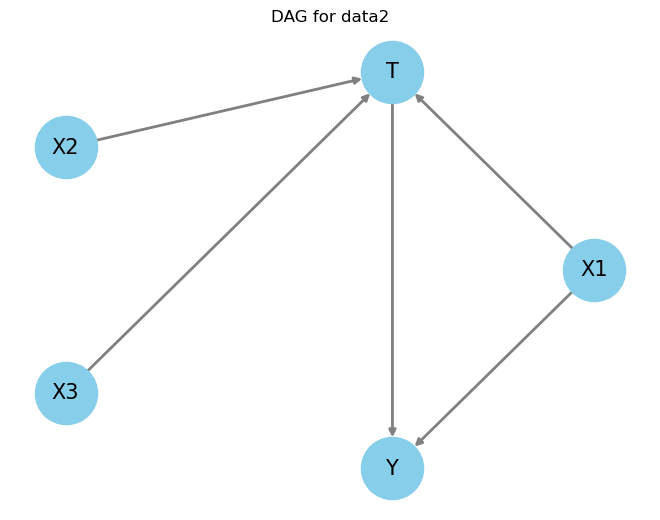

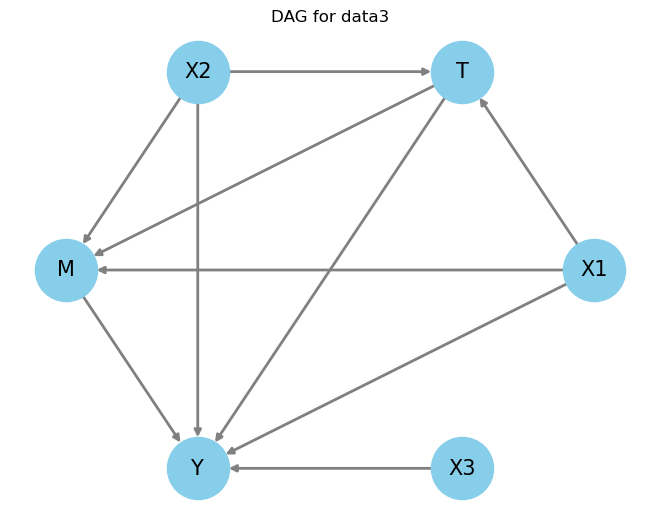

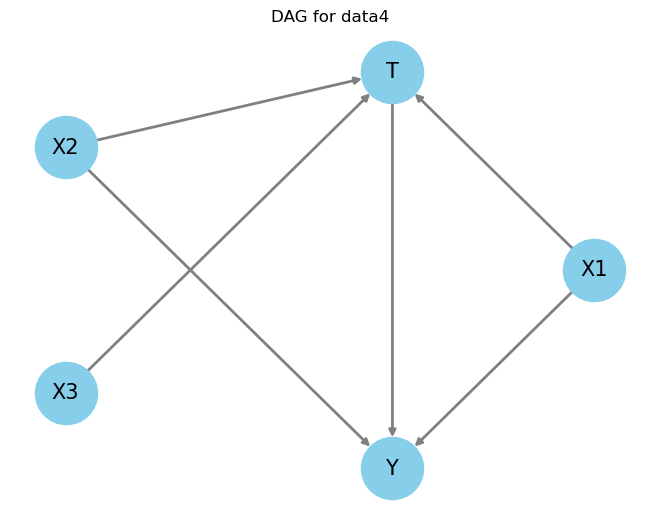

In [39]:
import matplotlib.pyplot as plt
import networkx as nx

def plot_dag(data_type):
    G = nx.DiGraph()
    
    if data_type == "data1":
        edges = [('X1', 'T'), ('X2', 'T'), ('X3', 'T'),
                 ('X2', 'M'), ('T', 'M'),
                 ('X1', 'Y'), ('X2', 'Y'), ('X3', 'Y'), ('T', 'Y'), ('M', 'Y')]
    
    elif data_type == "data2":
        edges = [('X1', 'T'), ('X2', 'T'), ('X3', 'T'),
                 ('X1', 'Y'), ('T', 'Y')]
        
    elif data_type == "data3":
        edges = [('X1', 'T'), ('X2', 'T'),
                 ('T', 'M'), ('X1', 'M'), ('X2', 'M'),
                 ('X1', 'Y'), ('X2', 'Y'), ('X3', 'Y'), ('T', 'Y'), ('M', 'Y')]
    
    elif data_type == "data4":
        edges = [('X1', 'T'), ('X2', 'T'), ('X3', 'T'),
                 ('X1', 'Y'), ('X2', 'Y'), ('T', 'Y')]
    
    G.add_edges_from(edges)
    
    pos = nx.circular_layout(G)  # Use circular_layout algorithm
    #pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, node_size=2000, node_color="skyblue", font_size=15, width=2, edge_color="gray")
    plt.title(f"DAG for {data_type}")
    plt.show()

# To visualize the DAGs for each dataset:
for dt in ["data1", "data2", "data3", "data4"]:
    plot_dag(dt)


# Regression

## 1. OLS

In [3]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Create an empty DataFrame to store results
results_df_ols = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]
num_iterations = 100

for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations): 
            total_samples = sample_size + 1000  # Total data points, including training and testing
            data = generate_data(data_type, total_samples)
            
            # Shuffle the data randomly
            shuffled_data = data.sample(frac=1, random_state=None)  # random_state=None ensures a different shuffle each time

            # Split data into training and testing sets
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:sample_size+1000]
            
            # Training with train_data
            train_data['intercept'] = 1
            X_train = train_data.drop('Outcome', axis=1)
            Y_train = train_data['Outcome']
            
            model = sm.OLS(Y_train, X_train)
            result = model.fit()          

            # Use the model to predict on test dataset
            X_test = test_data.drop('Outcome', axis=1)
            X_test['intercept'] = 1
            test_data['predicted_L'] = result.predict(X_test)
            
            # MAPE and RMSE calculation
            abs = np.abs((test_data['Outcome'] - test_data['predicted_L'])/test_data['Outcome'])
            mape = np.mean(abs)*100
            
            errors = test_data['Outcome'] - test_data['predicted_L']
            rmse = np.sqrt(np.mean(errors**2))

            # Build the result dictionary
            result_dict = {
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                'Coefficient_X1': result.params.get('X1', np.nan),
                'Coefficient_X2': result.params.get('X2', np.nan),
                'Coefficient_X3': result.params.get('X3', np.nan),
                'Coefficient_Mediator': result.params.get('Mediator', np.nan),
                'Coefficient_Intervention': result.params.get('Intervention', np.nan),
                'Intercept': result.params.get('intercept', np.nan),
                'MAPE': mape, 
                'RMSE': rmse
            }

            # Append the result to the DataFrame
            results_df_ols = results_df_ols.append(result_dict, ignore_index=True)

print(results_df_ols)


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1057877396.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['intercept'] = 1
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1057877396.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['predicted_L'] = result.predict(X_test)
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1057877396.py:66: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future

     Data_Type Sample_Size Iteration  Coefficient_X1  Coefficient_X2  \
0        data1          50         1        0.277348        0.260634   
1        data1          50         2        0.683625        0.726420   
2        data1          50         3        0.611419        0.741334   
3        data1          50         4        0.490677        0.822083   
4        data1          50         5        0.686412        0.499063   
...        ...         ...       ...             ...             ...   
1195     data4        1000        96        0.472450        0.648672   
1196     data4        1000        97        0.442376        0.614750   
1197     data4        1000        98        0.522926        0.580476   
1198     data4        1000        99        0.524045        0.584991   
1199     data4        1000       100        0.396245        0.679803   

      Coefficient_X3  Coefficient_Mediator  Coefficient_Intervention  \
0           0.724748              2.446021                  2.1

/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1057877396.py:66: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_ols = results_df_ols.append(result_dict, ignore_index=True)
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1057877396.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['intercept'] = 1
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1057877396.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

In [21]:
results_df_ols

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,0.427174,0.979259,0.756397,1.561741,3.805263,3.019132,84.209875,1.046661
1,data1,50,2,0.141628,0.729582,0.520608,2.036470,3.062207,2.912898,67.394674,1.069902
2,data1,50,3,0.669789,0.618551,0.740942,1.800068,3.434142,2.980141,66.571939,1.025111
3,data1,50,4,0.496720,0.506931,0.557077,1.861432,3.390131,3.098747,121.743727,1.010147
4,data1,50,5,0.510866,0.211739,0.728905,2.159686,2.756902,3.060306,36.965513,1.041864
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,0.501703,0.577207,-0.051754,NaN,3.056567,2.937811,47.099882,0.993402
1196,data4,1000,97,0.505052,0.609083,0.053543,NaN,2.946656,3.020710,36.898367,0.949404
1197,data4,1000,98,0.520599,0.605099,-0.037104,NaN,3.111897,2.895304,84.734459,1.007598
1198,data4,1000,99,0.462347,0.525078,0.036843,NaN,3.158545,2.909397,62.629134,1.004017


In [4]:
# Group by 'Data_Type' and 'Sample_Size' and calculate mean for other columns
averaged_df_ols = results_df_ols.groupby(['Data_Type', 'Sample_Size']).mean().reset_index()

averaged_df_ols

/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1903424515.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  averaged_df_ols = results_df_ols.groupby(['Data_Type', 'Sample_Size']).mean().reset_index()


,Data_Type,Sample_Size,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,0.489933,0.561795,0.656800,2.024080,2.963961,3.016283,63.843360,1.064601
1,data1,100,0.504540,0.587710,0.714706,2.033103,2.925672,3.002154,67.946766,1.023208
2,data1,1000,0.494545,0.592793,0.701524,2.010227,2.980015,2.996306,165.901555,1.004609
3,data2,50,0.500417,0.006957,-0.003897,NaN,2.993932,3.016716,148.994753,1.060352
4,data2,100,0.486642,0.008448,-0.010443,NaN,3.005870,2.983732,133.509852,1.022362
5,data2,1000,0.501069,-0.001703,0.002026,NaN,2.997508,2.997260,112.917713,0.999507
6,data3,50,0.512247,0.614085,0.686563,1.988135,3.010300,2.978143,106.358800,1.066509
7,data3,100,0.507283,0.580545,0.697452,1.995859,2.983766,3.008940,79.603710,1.035685
8,data3,1000,0.500359,0.599714,0.699589,1.996373,3.025788,2.986919,67.517319,1.003676
9,data4,50,0.497535,0.588614,0.018000,NaN,3.003730,3.002325,79.612727,1.052251


In [6]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Create an empty DataFrame to store results
results_df_iv = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]
num_iterations = 100

for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations): 
            total_samples = sample_size + 1000  # Total data points, including training and testing
            data = generate_data(data_type, total_samples)
            
            # Shuffle the data randomly
            shuffled_data = data.sample(frac=1, random_state=None)

            # Split data into training and testing sets
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:sample_size+1000]
            
            # Check if 'Mediator' column is present
            if 'Mediator' in train_data.columns:
                X_first_stage = train_data[['X1', 'X2', 'X3', 'Mediator']]
                X_second_stage_cols = ['predicted_Intervention', 'X1', 'X2', 'X3', 'Mediator']
            else:
                X_first_stage = train_data[['X1', 'X2', 'X3']]
                X_second_stage_cols = ['predicted_Intervention', 'X1', 'X2', 'X3']

            # First stage regression: Regress treatment on instrument and controls
            Y_first_stage = train_data['Intervention']
            
            first_stage_model = sm.OLS(Y_first_stage, sm.add_constant(X_first_stage))
            first_stage_result = first_stage_model.fit()
            predicted_treatment = first_stage_result.predict(sm.add_constant(X_first_stage))
            
            # Second stage regression: Regress outcome on predicted treatment and controls
            train_data['predicted_Intervention'] = predicted_treatment
            X_second_stage = train_data[X_second_stage_cols]
            Y_second_stage = train_data['Outcome']
            
            second_stage_model = sm.OLS(Y_second_stage, sm.add_constant(X_second_stage))
            second_stage_result = second_stage_model.fit()

            # Check if 'Mediator' column is present in test_data
            if 'Mediator' in test_data.columns:
                X_test = test_data[['Intervention', 'X1', 'X2', 'X3', 'Mediator']]
            else:
                X_test = test_data[['Intervention', 'X1', 'X2', 'X3']]
            
            test_data['predicted_L'] = second_stage_result.predict(sm.add_constant(X_test))

            
            # MAPE and RMSE calculation
            abs_error = np.abs((test_data['Outcome'] - test_data['predicted_L'])/test_data['Outcome'])
            mape = np.mean(abs_error)*100
            
            errors = test_data['Outcome'] - test_data['predicted_L']
            rmse = np.sqrt(np.mean(errors**2))

            # Build the result dictionary
            result_dict = {
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                'Coefficient_X1': second_stage_result.params.get('X1', np.nan),
                'Coefficient_X2': second_stage_result.params.get('X2', np.nan),
                'Coefficient_X3': second_stage_result.params.get('X3', np.nan),
                'Coefficient_Mediator': second_stage_result.params.get('Mediator', np.nan),
                'Coefficient_Intervention': second_stage_result.params.get('predicted_Intervention', np.nan),
                'Intercept': second_stage_result.params.get('const', np.nan),
                'MAPE': mape, 
                'RMSE': rmse
            }

            # Append the result to the DataFrame
            results_df_iv = results_df_iv.append(result_dict, ignore_index=True)

print(results_df_iv)


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1309670312.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['predicted_Intervention'] = predicted_treatment
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1309670312.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['predicted_L'] = second_stage_result.predict(sm.add_constant(X_test))
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1309670312.py:85: FutureWarning: The frame.append met

     Data_Type Sample_Size Iteration  Coefficient_X1  Coefficient_X2  \
0        data1          50         1        0.672182        0.403109   
1        data1          50         2        0.459058        0.227766   
2        data1          50         3        0.651412        0.276775   
3        data1          50         4        0.480673        0.134425   
4        data1          50         5        0.228202        0.137111   
...        ...         ...       ...             ...             ...   
1195     data4        1000        96        0.645812        0.797178   
1196     data4        1000        97        0.692878        0.759601   
1197     data4        1000        98        0.675361        0.759527   
1198     data4        1000        99        0.621893        0.799172   
1199     data4        1000       100        0.646973        0.711293   

      Coefficient_X3  Coefficient_Mediator  Coefficient_Intervention  \
0           0.743597              2.764887                  1.1

/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1309670312.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['predicted_Intervention'] = predicted_treatment
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1309670312.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['predicted_L'] = second_stage_result.predict(sm.add_constant(X_test))
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1309670312.py:85: FutureWarning: The frame.append met

In [8]:
results_df_iv

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,0.672182,0.403109,0.743597,2.764887,1.161705,3.153180,38.290372,1.111277
1,data1,50,2,0.459058,0.227766,0.652633,2.849432,1.423626,3.084517,39.937164,1.112475
2,data1,50,3,0.651412,0.276775,0.959298,2.780346,1.339739,2.965348,33.881716,1.129781
3,data1,50,4,0.480673,0.134425,0.704928,2.804435,1.365561,2.908480,44.404112,1.087998
4,data1,50,5,0.228202,0.137111,0.540361,2.846319,1.192460,2.905137,54.964277,1.177682
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,0.645812,0.797178,0.142795,NaN,1.985385,3.480639,40.829693,1.082901
1196,data4,1000,97,0.692878,0.759601,0.153377,NaN,1.979231,3.490479,36.857089,1.032143
1197,data4,1000,98,0.675361,0.759527,0.131903,NaN,2.083821,3.481432,52.077455,1.094395
1198,data4,1000,99,0.621893,0.799172,0.157996,NaN,2.020077,3.461883,51.719911,1.086518


In [7]:
# Convert None values to NaN for correct aggregation
results_df_iv = results_df_iv.where(pd.notna(results_df_iv), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_iv = results_df_iv.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_iv

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,0.542839,0.175425,0.737518,2.805153,1.304953,2.967989,94.256128,1.138267
1,data1,100,50.5,0.554680,0.196982,0.778705,2.783499,1.319091,3.003740,60.987930,1.106901
2,data1,1000,50.5,0.551818,0.194930,0.768170,2.791084,1.314508,3.001402,94.353343,1.085407
3,data2,50,50.5,1.167165,0.791241,0.891373,NaN,1.676202,2.914223,193.938161,1.744880
4,data2,100,50.5,1.159500,0.752666,0.929237,NaN,1.665032,2.981769,412.640316,1.699402
5,data2,1000,50.5,1.149985,0.779773,0.922102,NaN,1.689359,2.998530,219.502245,1.649402
6,data3,50,50.5,0.539935,0.911884,0.698300,2.278911,1.665008,3.363300,80.508003,1.139765
7,data3,100,50.5,0.493433,0.896981,0.704418,2.273397,1.681826,3.385831,122.144259,1.115625
8,data3,1000,50.5,0.498288,0.911582,0.699523,2.289804,1.657531,3.371661,163.777066,1.092251
9,data4,50,50.5,0.658128,0.763749,0.145375,NaN,1.992025,3.480733,72.790272,1.133313


#### Viz

Data: data1
Sample Size: 50
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000            100.000000   
mean         0.519944        0.609517        0.734057              2.018840   
std          0.170763        0.284071        0.186548              0.306876   
min          0.125681       -0.134604        0.246444              1.185391   
25%          0.403293        0.441688        0.591173              1.822310   
50%          0.534717        0.604819        0.735122              2.031077   
75%          0.641575        0.748268        0.865254              2.220014   
max          0.947771        1.370019        1.208193              2.762744   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.932929    3.010896  
std                    0.590011    0.153808  
min                    1.581452    2.689069  
25%                    2.56229

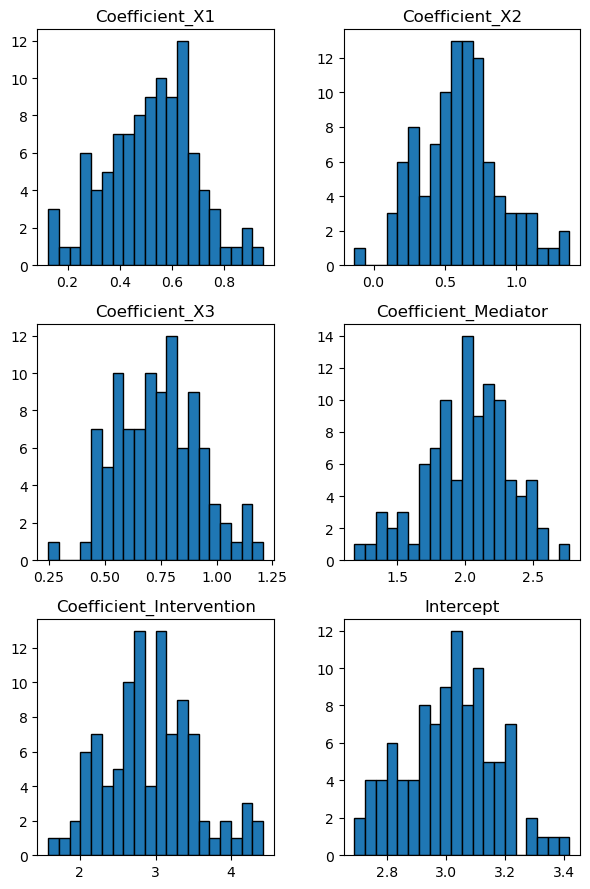

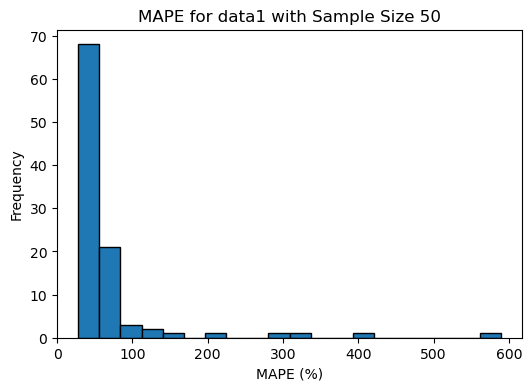

Sample Size: 100
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000            100.000000   
mean         0.515692        0.592383        0.707205              2.005725   
std          0.119003        0.182994        0.118151              0.209419   
min          0.218266        0.214294        0.281422              1.567296   
25%          0.437447        0.462797        0.623812              1.883349   
50%          0.504194        0.598160        0.704521              1.997745   
75%          0.588203        0.702408        0.775845              2.130698   
max          0.838564        1.107595        0.942648              2.521007   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.984670    3.009979  
std                    0.442778    0.101293  
min                    1.896031    2.800386  
25%                    2.747079    2.9306

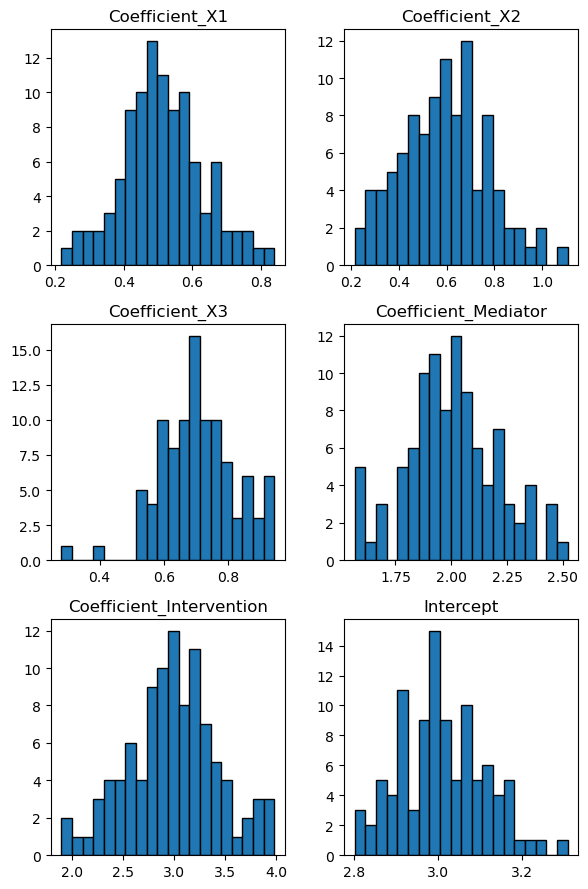

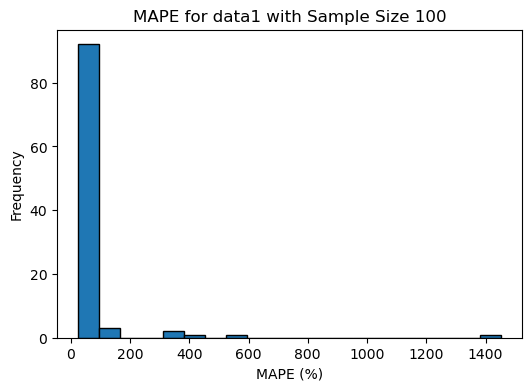

Sample Size: 1000
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000            100.000000   
mean         0.503599        0.599365        0.703244              2.001668   
std          0.037309        0.054588        0.038121              0.066972   
min          0.419408        0.487604        0.616214              1.858145   
25%          0.476449        0.556712        0.674822              1.957068   
50%          0.503380        0.602332        0.703107              2.003437   
75%          0.525697        0.640687        0.724381              2.047411   
max          0.594997        0.713725        0.808315              2.173032   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.995098    2.999584  
std                    0.138068    0.036973  
min                    2.603483    2.923668  
25%                    2.905833    2.975

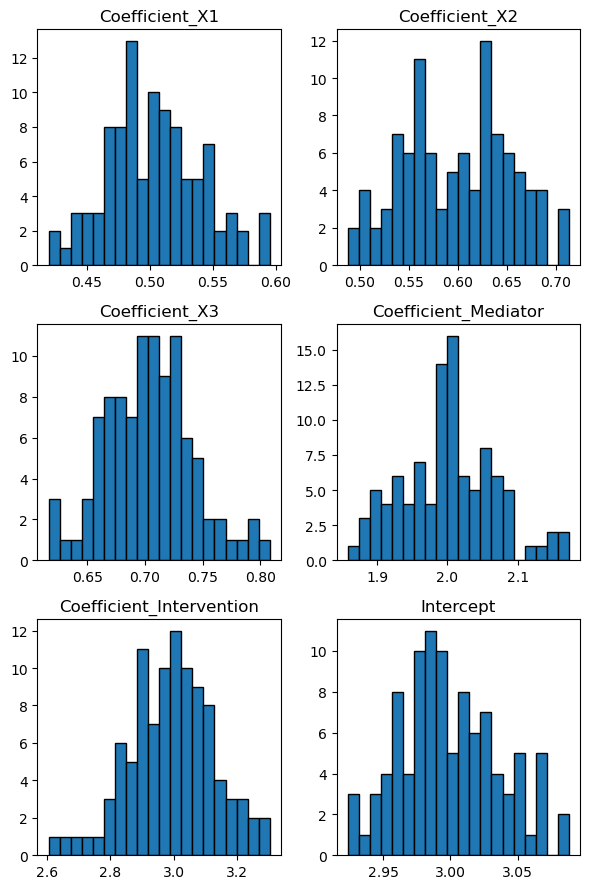

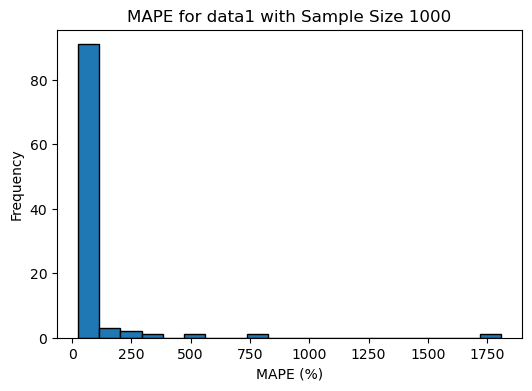

Data: data2
Sample Size: 50
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000                   0.0   
mean         0.475803       -0.018640       -0.005597                   NaN   
std          0.182959        0.175800        0.184895                   NaN   
min          0.046713       -0.476558       -0.575758                   NaN   
25%          0.348354       -0.115274       -0.118232                   NaN   
50%          0.486131       -0.026755       -0.012372                   NaN   
75%          0.588525        0.103673        0.125375                   NaN   
max          0.990278        0.563902        0.487856                   NaN   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   3.024644    3.012008  
std                    0.160982    0.148547  
min                    2.626622    2.631687  
25%                    2.93124

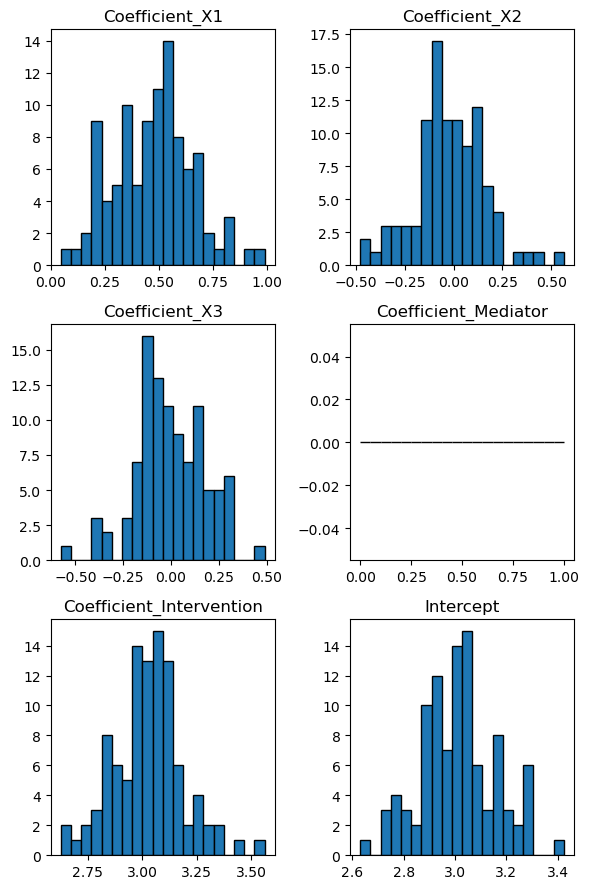

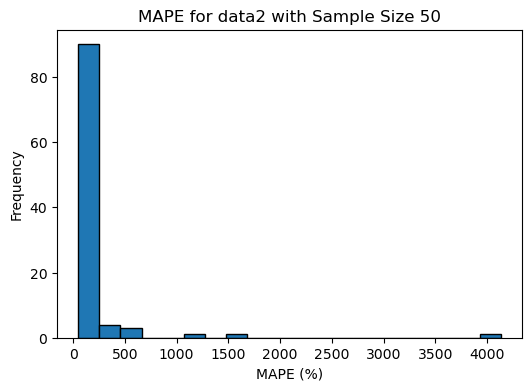

Sample Size: 100
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000                   0.0   
mean         0.487324        0.006626        0.001575                   NaN   
std          0.109076        0.121498        0.122536                   NaN   
min          0.224627       -0.288692       -0.307814                   NaN   
25%          0.403542       -0.071640       -0.066561                   NaN   
50%          0.491361        0.001187       -0.004790                   NaN   
75%          0.577899        0.085918        0.063645                   NaN   
max          0.719355        0.357742        0.399220                   NaN   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.996020    3.007659  
std                    0.091489    0.103124  
min                    2.791827    2.751823  
25%                    2.927959    2.9313

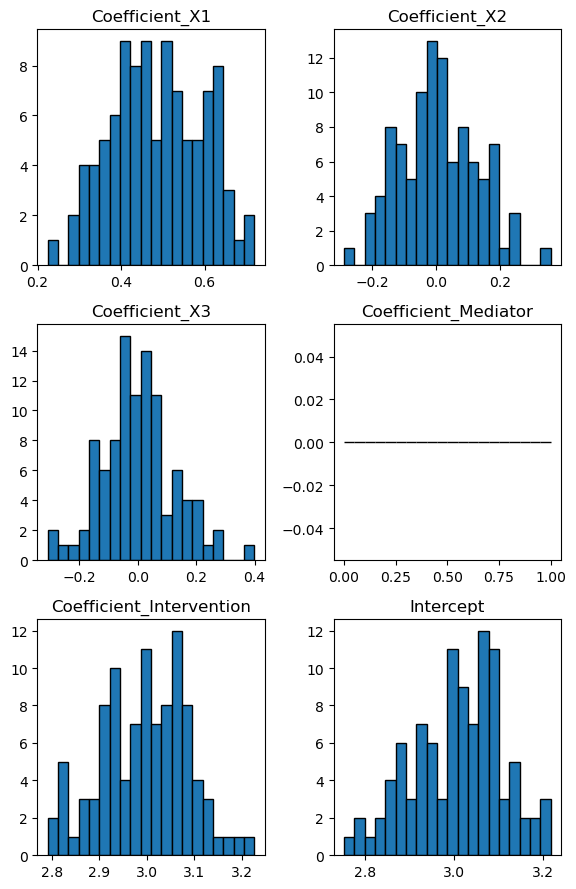

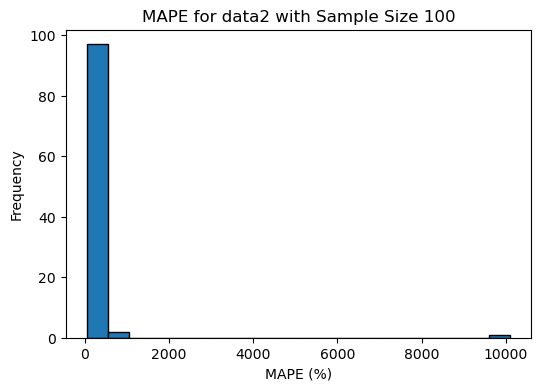

Sample Size: 1000
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000                   0.0   
mean         0.499671       -0.002030       -0.002430                   NaN   
std          0.040814        0.033856        0.039954                   NaN   
min          0.429582       -0.121855       -0.112227                   NaN   
25%          0.470353       -0.020831       -0.032787                   NaN   
50%          0.494183        0.001001        0.000161                   NaN   
75%          0.527425        0.019372        0.025025                   NaN   
max          0.608057        0.088117        0.095592                   NaN   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.998634    2.997434  
std                    0.033753    0.030819  
min                    2.901293    2.923130  
25%                    2.976229    2.981

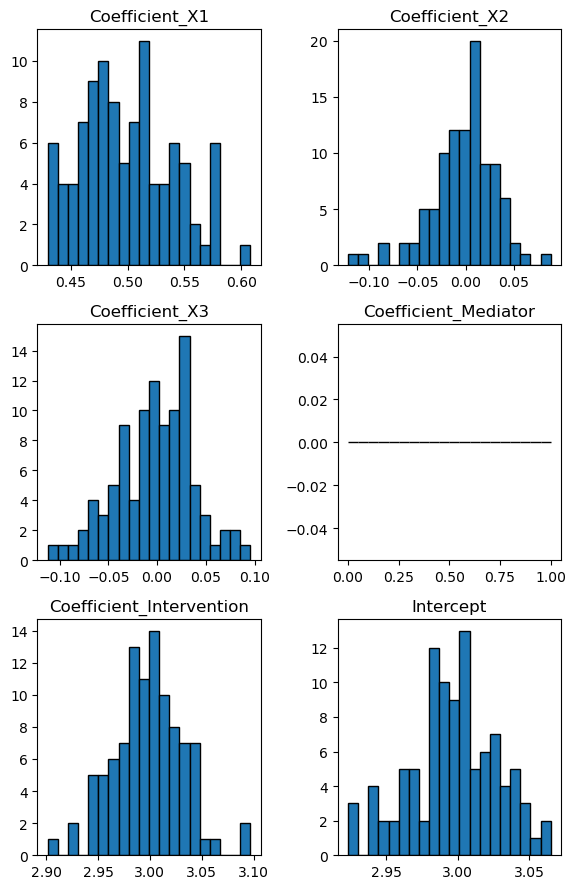

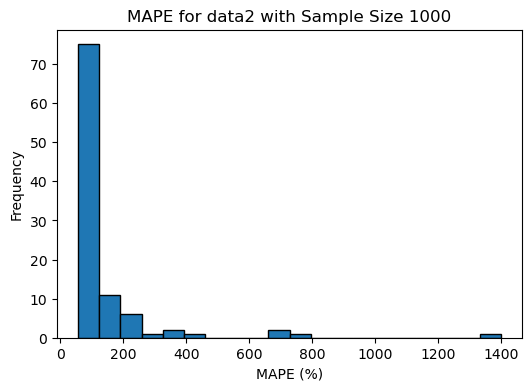

Data: data3
Sample Size: 50
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000            100.000000   
mean         0.493181        0.599388        0.715343              1.999234   
std          0.188173        0.170322        0.168341              0.142987   
min         -0.078293        0.271328        0.232637              1.629457   
25%          0.368840        0.478634        0.621250              1.887270   
50%          0.485586        0.581189        0.729392              1.996150   
75%          0.616847        0.721944        0.824111              2.093768   
max          0.944582        1.069039        1.133260              2.399311   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   3.022887    2.978234  
std                    0.428173    0.220163  
min                    1.902066    2.517533  
25%                    2.75776

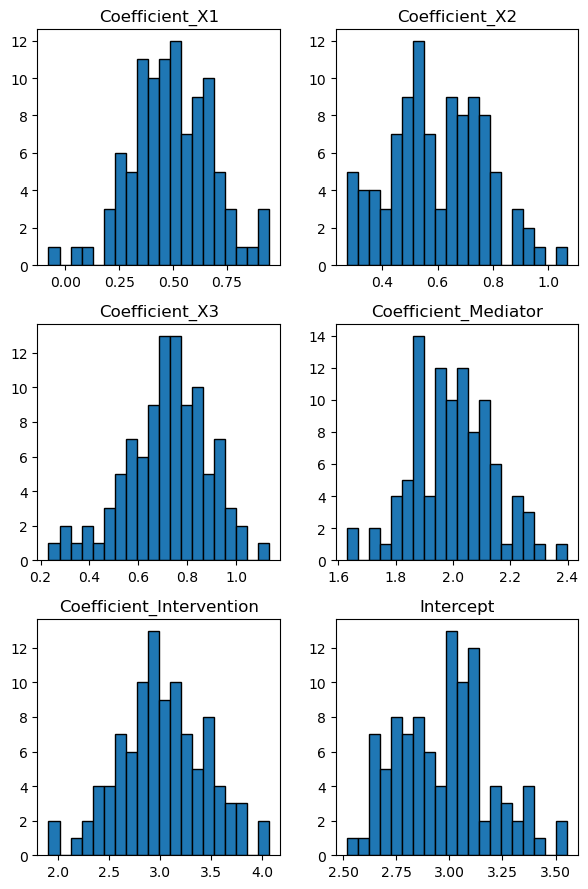

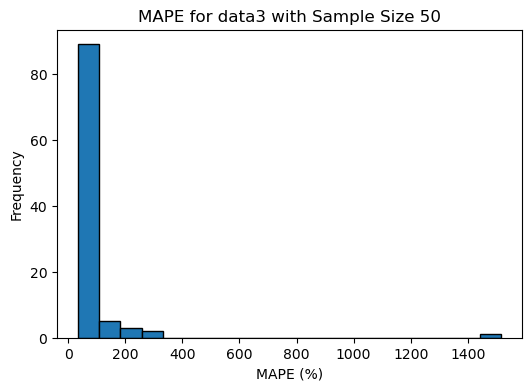

Sample Size: 100
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000            100.000000   
mean         0.510974        0.603405        0.699919              2.006248   
std          0.114879        0.129655        0.091882              0.100194   
min          0.193494        0.332227        0.437281              1.798807   
25%          0.440583        0.511529        0.625628              1.936971   
50%          0.503128        0.618885        0.709587              1.996127   
75%          0.586530        0.686177        0.759104              2.066118   
max          0.773235        0.915787        0.886216              2.249173   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.989888    2.983414  
std                    0.314494    0.155444  
min                    2.078301    2.460946  
25%                    2.800898    2.9025

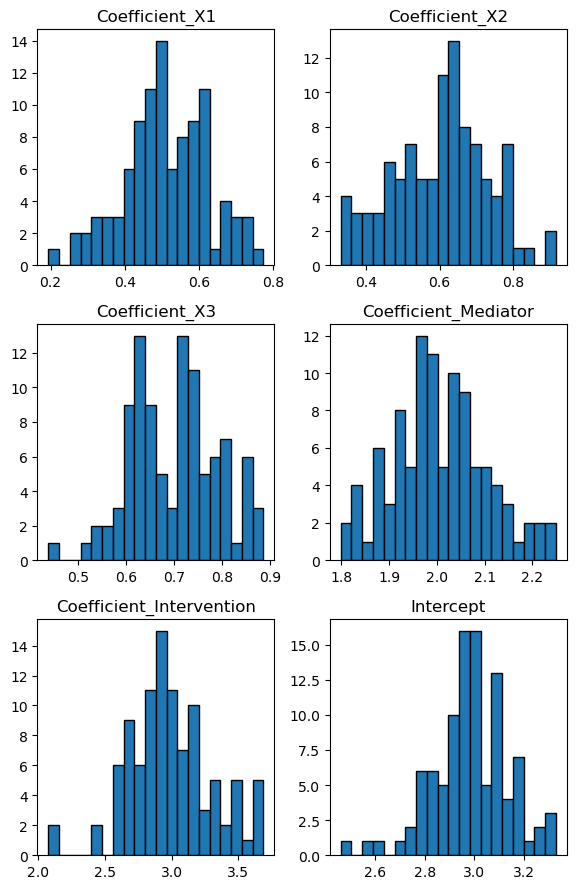

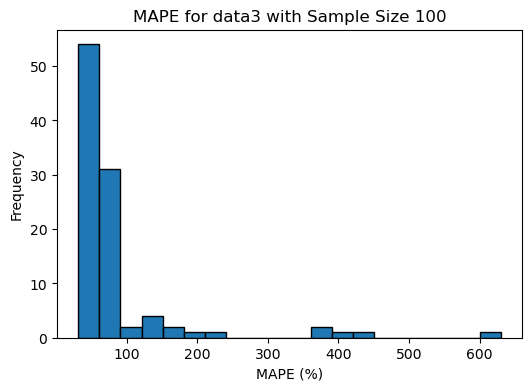

Sample Size: 1000
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000            100.000000   
mean         0.504784        0.601958        0.703981              2.001857   
std          0.037441        0.038033        0.028780              0.030229   
min          0.400903        0.504098        0.634641              1.909594   
25%          0.479983        0.572578        0.684658              1.981519   
50%          0.508190        0.603060        0.702832              2.004546   
75%          0.532727        0.629135        0.721500              2.024305   
max          0.592634        0.697693        0.791685              2.070278   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.997711    3.001925  
std                    0.098326    0.052447  
min                    2.763291    2.892803  
25%                    2.926120    2.960

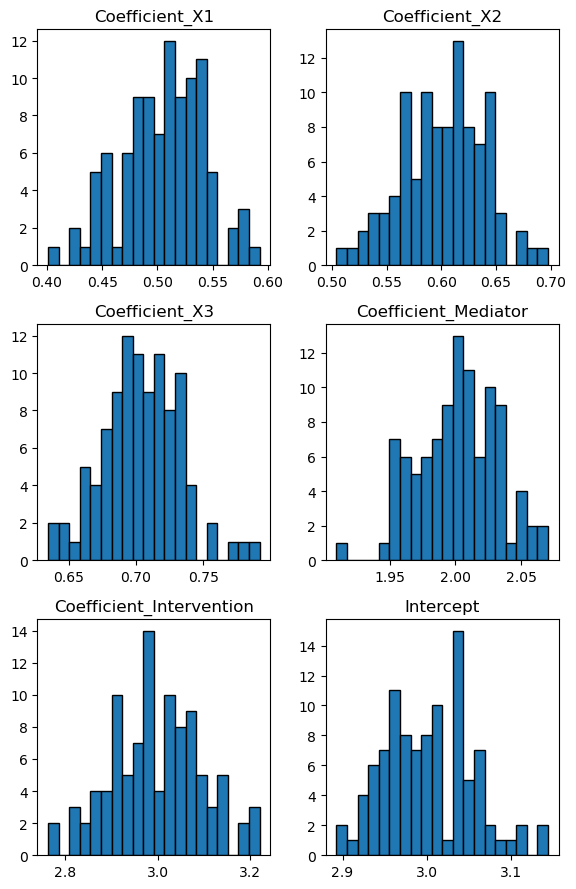

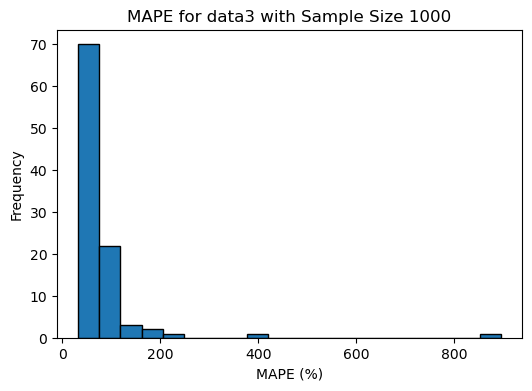

Data: data4
Sample Size: 50
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000                   0.0   
mean         0.474658        0.576672       -0.032756                   NaN   
std          0.161585        0.148966        0.171886                   NaN   
min          0.079580        0.250807       -0.649434                   NaN   
25%          0.382515        0.471756       -0.143409                   NaN   
50%          0.482286        0.572428       -0.033477                   NaN   
75%          0.594971        0.676493        0.071177                   NaN   
max          0.850040        0.898130        0.277566                   NaN   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   3.132255    2.924891  
std                    0.359771    0.222202  
min                    2.217069    2.483369  
25%                    2.89585

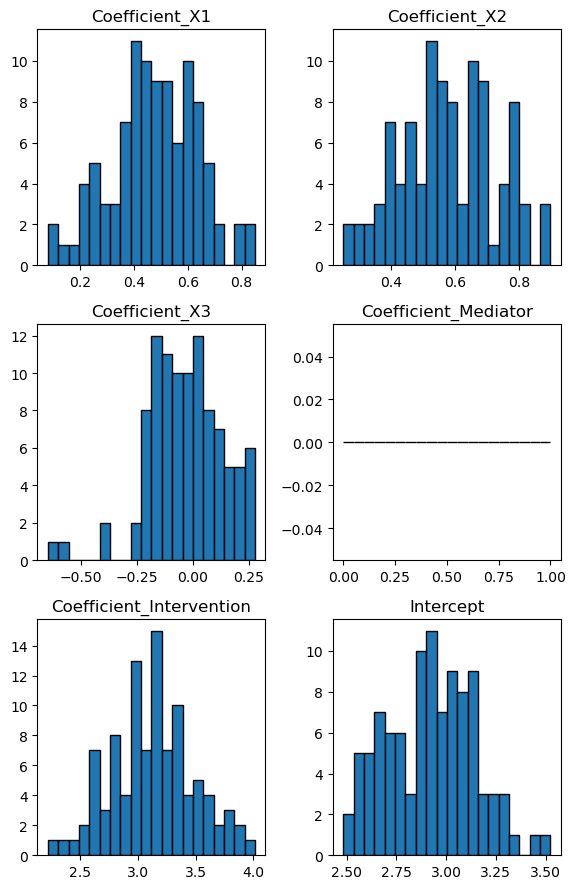

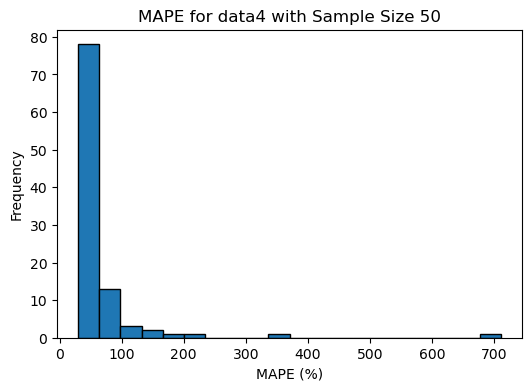

Sample Size: 100
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000                   0.0   
mean         0.508928        0.594241        0.008723                   NaN   
std          0.097503        0.130086        0.117262                   NaN   
min          0.274979        0.231635       -0.354911                   NaN   
25%          0.441940        0.523167       -0.064971                   NaN   
50%          0.500874        0.596909       -0.000844                   NaN   
75%          0.560957        0.672408        0.074344                   NaN   
max          0.780439        0.852130        0.260435                   NaN   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.990752    3.005021  
std                    0.222263    0.159673  
min                    2.372030    2.685651  
25%                    2.835870    2.8922

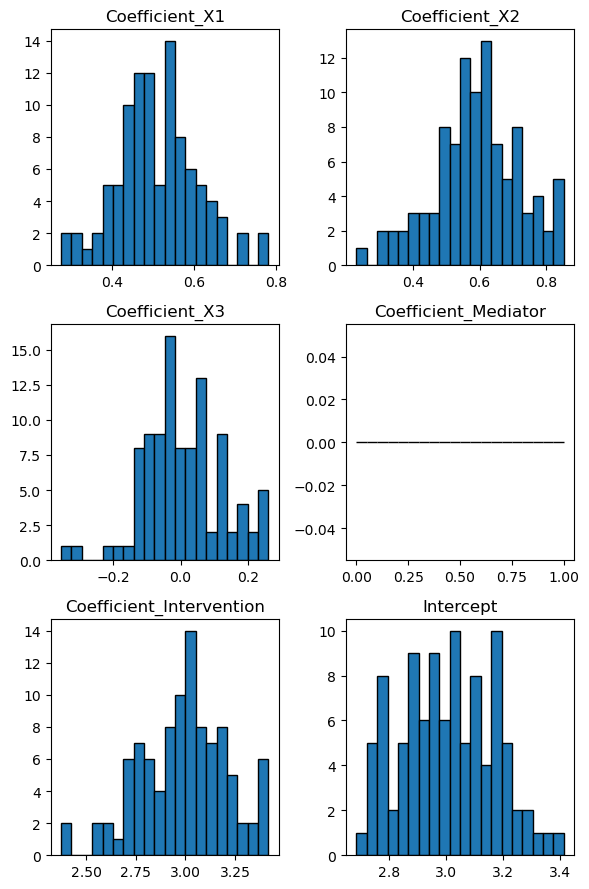

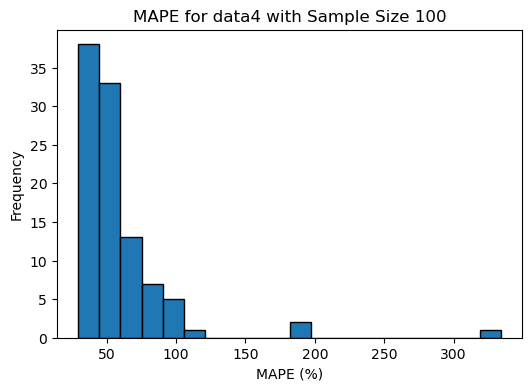

Sample Size: 1000
       Coefficient_X1  Coefficient_X2  Coefficient_X3  Coefficient_Mediator  \
count      100.000000      100.000000      100.000000                   0.0   
mean         0.501833        0.603031        0.002274                   NaN   
std          0.034714        0.030264        0.032835                   NaN   
min          0.388040        0.525078       -0.053158                   NaN   
25%          0.481265        0.580200       -0.024946                   NaN   
50%          0.502433        0.601401        0.002814                   NaN   
75%          0.528830        0.627049        0.025385                   NaN   
max          0.579035        0.692729        0.085509                   NaN   

       Coefficient_Intervention   Intercept  
count                100.000000  100.000000  
mean                   2.986164    3.006964  
std                    0.082853    0.052534  
min                    2.819227    2.881034  
25%                    2.935845    2.973

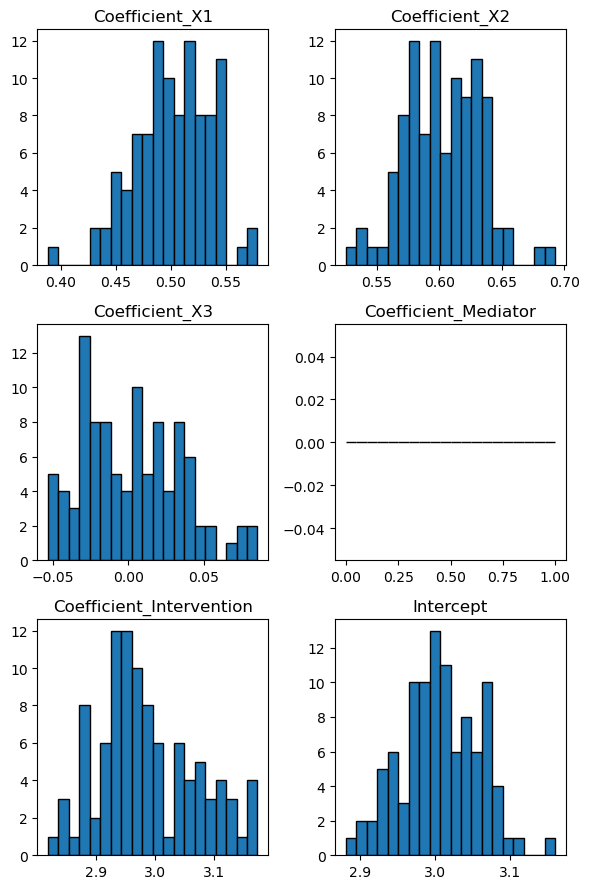

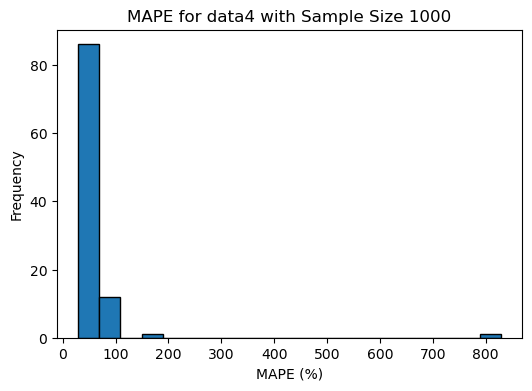

In [23]:
sample_sizes = [50, 100, 1000]

# Process and visualize results
for data_name in ["data1", "data2", "data3", "data4"]:
    print(f"Data: {data_name}")

    for size in sample_sizes:
        
        # Filter rows based on current data_name and sample_size
        filtered_df = results_df_ols[(results_df_ols['Data_Type'] == data_name) & (results_df_ols['Sample_Size'] == size)]
        
        # Drop non-coefficient columns for analysis
        coefficient_columns = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept']
        result_regression = filtered_df[coefficient_columns]
        
        print(f"Sample Size: {size}")
        print(result_regression.describe())

        # Draw histograms for each coefficient
        num_coefficients = len(coefficient_columns)
        num_rows = int(np.ceil(np.sqrt(num_coefficients)))
        num_cols = int(np.ceil(num_coefficients / num_rows))
        plt.figure(figsize=(3*num_cols, 3*num_rows))

        for i, col_name in enumerate(coefficient_columns):
            plt.subplot(num_rows, num_cols, i + 1)
            # Remove NaN values before plotting
            valid_data = result_regression[col_name].dropna()
            plt.hist(valid_data, bins=20, edgecolor='black')
            plt.title(f'{col_name}')
        plt.tight_layout()
        plt.show()

        # Plot MAPE
        plt.figure(figsize=(6, 4))
        plt.hist(filtered_df['MAPE'], bins=20, edgecolor='black')
        plt.title(f"MAPE for {data_name} with Sample Size {size}")
        plt.xlabel("MAPE (%)")
        plt.ylabel("Frequency")
        plt.show()


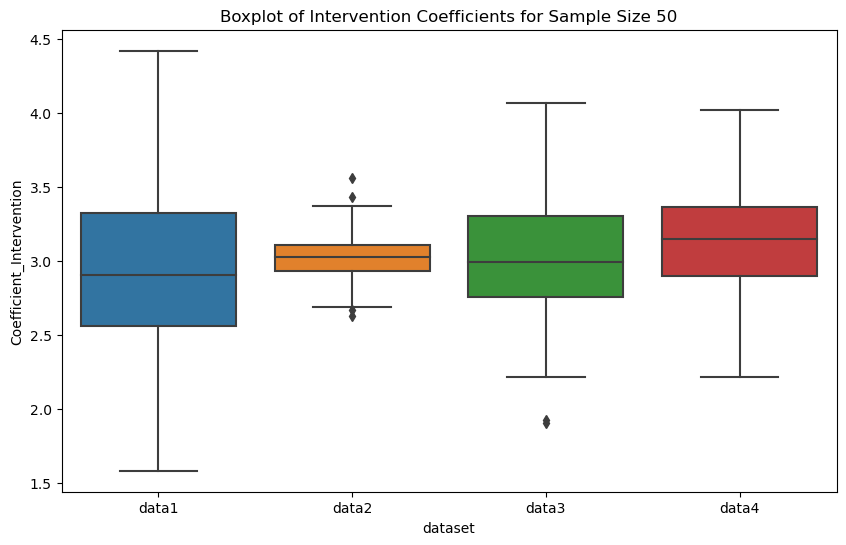

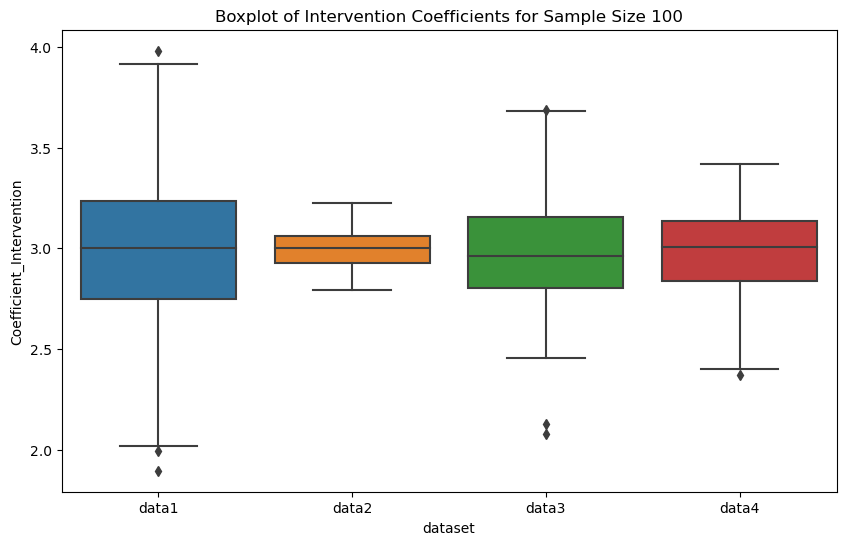

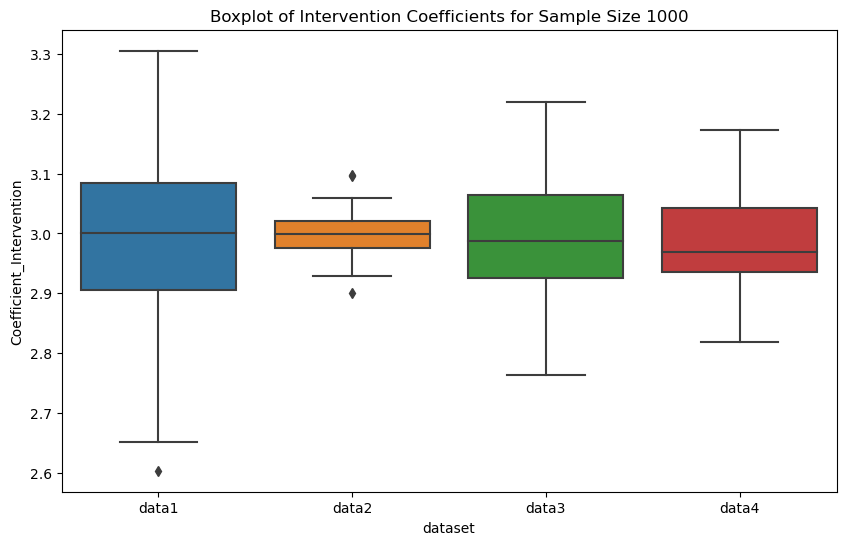

In [24]:
import seaborn as sns

for size in sample_sizes:
    plt.figure(figsize=(10, 6))
    data_to_plot = []

    for data_name in ["data1", "data2", "data3", "data4"]:
        # Filter the data for the current data_name and sample size
        filtered_data = results_df_ols[(results_df_ols['Data_Type'] == data_name) & (results_df_ols['Sample_Size'] == size)].copy()
        filtered_data['dataset'] = data_name
        data_to_plot.append(filtered_data)
    
    combined_data = pd.concat(data_to_plot)
    sns.boxplot(x='dataset', y='Coefficient_Intervention', data=combined_data)  # Adjust the 'y' parameter to plot different coefficients
    plt.title(f"Boxplot of Intervention Coefficients for Sample Size {size}")
    plt.show()


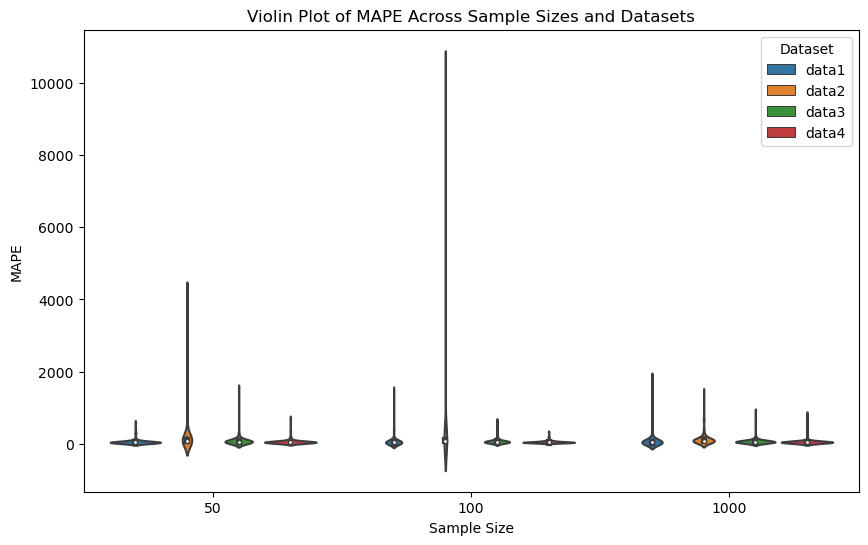

In [25]:
plt.figure(figsize=(10, 6))
mape_data = []

for data_name in ["data1", "data2", "data3", "data4"]:
    for size in sample_sizes:
        results_for_size = results_df_ols[(results_df_ols['Data_Type'] == data_name) & (results_df_ols['Sample_Size'] == size)].copy()
        # Extract the 'MAPE' column and create the new DataFrame
        temp_df = pd.DataFrame({'MAPE': results_for_size['MAPE'], 'Sample Size': [size]*len(results_for_size), 'Dataset': [data_name]*len(results_for_size)})
        mape_data.append(temp_df)

combined_mape_data = pd.concat(mape_data)
sns.violinplot(x='Sample Size', y='MAPE', hue='Dataset', data=combined_mape_data)
plt.title("Violin Plot of MAPE Across Sample Sizes and Datasets")
plt.show()


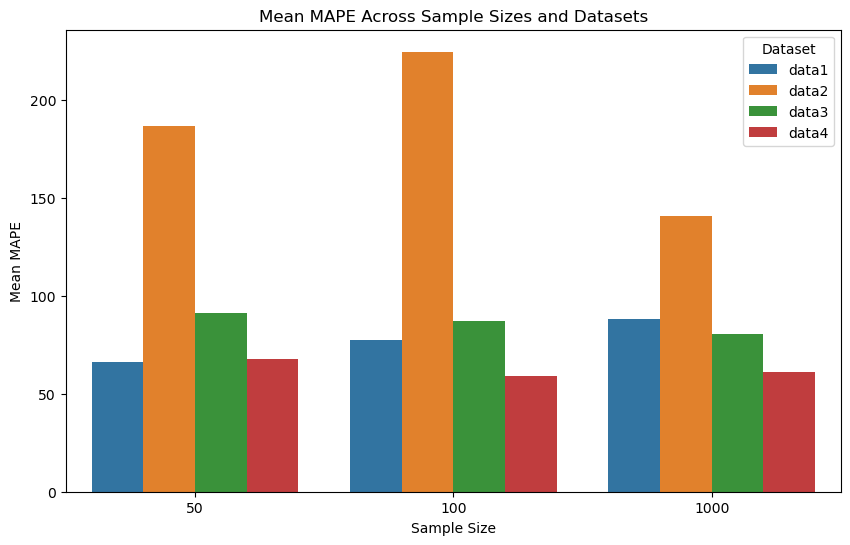

In [26]:
plt.figure(figsize=(10, 6))

# Concatenate list of DataFrames to get a single DataFrame
df_mape = pd.concat(mape_data)

# Group by Dataset and Sample Size to get mean MAPE for each group
grouped_data = df_mape.groupby(['Dataset', 'Sample Size']).mean().reset_index()

# Plotting
sns.barplot(x='Sample Size', y='MAPE', hue='Dataset', data=grouped_data)
plt.title("Mean MAPE Across Sample Sizes and Datasets")
plt.ylabel("Mean MAPE")
plt.show()


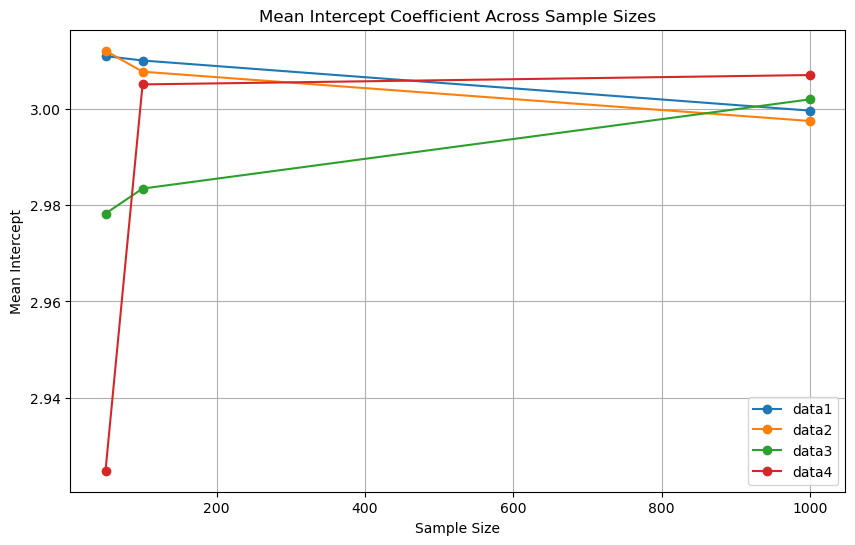

In [27]:
for coefficient in ['Intercept']:  # Adjust the name based on column names in your DataFrame
    plt.figure(figsize=(10, 6))
    
    for data_name in ["data1", "data2", "data3", "data4"]:
        mean_coefficients = []
        for size in sample_sizes:
            subset = results_df_ols[(results_df_ols['Data_Type'] == data_name) & (results_df_ols['Sample_Size'] == size)]
            mean_coefficients.append(subset[coefficient].mean())
        
        plt.plot(sample_sizes, mean_coefficients, marker='o', label=data_name)
    
    plt.title(f"Mean {coefficient} Coefficient Across Sample Sizes")
    plt.xlabel("Sample Size")
    plt.ylabel(f"Mean {coefficient}")
    plt.legend()
    plt.grid(True)
    plt.show()


In [28]:
plt.figure(figsize=(10, 6))
sns.swarmplot(x='Sample Size', y='MAPE', hue='Dataset', data=combined_mape_data)
plt.title("Swarm Plot of MAPE Across Sample Sizes and Datasets")
plt.show()

/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 82.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 83.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 83.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 84.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jeongdahye/opt/anaconda3/lib/

KeyboardInterrupt: 

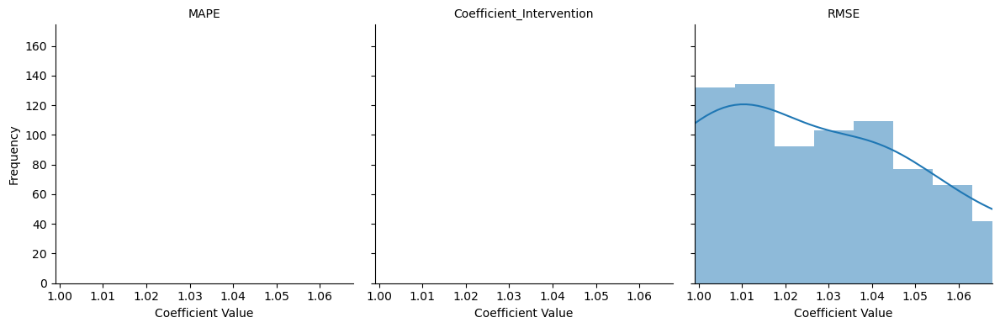

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame
coefficients_columns = ['MAPE', 'Coefficient_Intervention', 'RMSE']

melted_df = results_df_ols.melt(id_vars=['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 
                                'Coefficient_Mediator', 'Intercept','Data_Type', 'Sample_Size', 'Iteration'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')


# Create FacetGrid using the 'Coefficient' column
g = sns.FacetGrid(melted_df, col="Coefficient", col_wrap=3, height=4, margin_titles=True)
g.map_dataframe(sns.histplot, x="Value", kde=True)  # Using kde=True to add a density plot
g.set_axis_labels("Coefficient Value", "Frequency")
g.set_titles(col_template="{col_name}")

# Extract the values from the table
mape_values = [66.016841, 77.469333, 88.032673, 186.375358, 224.381352, 140.770699, 91.261831, 87.051722, 80.257082, 67.470664, 59.252157, 60.893932]
intervention_values = [2.932929, 2.984670, 2.995098, 3.024644, 2.996020, 2.998634, 3.022887, 2.989888, 2.997711, 3.132255, 2.990752, 2.986164]
rmse_values = [1.067769, 1.029973, 1.002199, 1.057694, 1.026052, 1.002229, 1.060547, 1.026997, 0.999042, 1.051590, 1.025207, 1.001361]

# Calculate the ranges
mape_range = (min(mape_values), max(mape_values))
intervention_range = (min(intervention_values), max(intervention_values))
rmse_range = (min(rmse_values), max(rmse_values))

# Specify x-axis limits for specific variables
limits = {
    'MAPE': mape_range,
    'Coefficient_Intervention': intervention_range,
    'RMSE': rmse_range
}

# Map the column names to indices
col_order = g.col_names

for index, coeff in enumerate(col_order):
    if coeff in limits:
        g.axes[index].set_xlim(limits[coeff])

g.tight_layout()
plt.show()

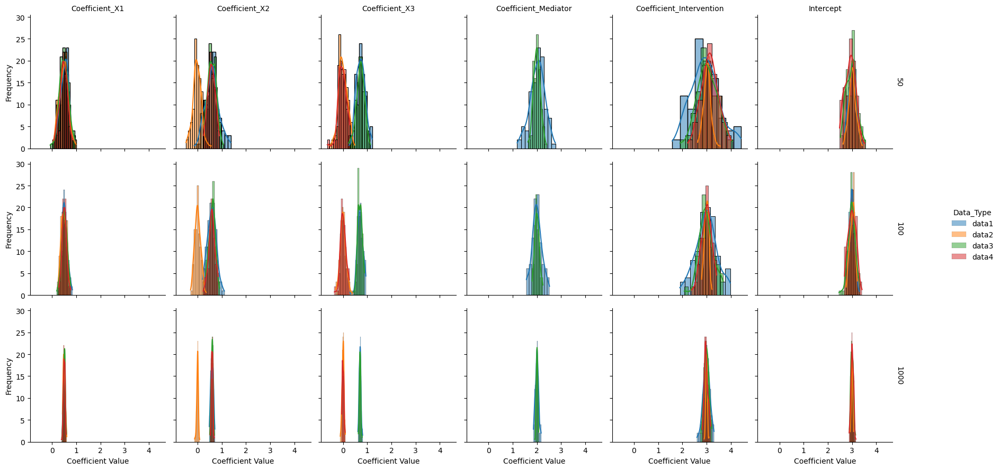

In [29]:
import seaborn as sns

# Melt the DataFrame
coefficients_columns = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 
                        'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept']

melted_df = results_df_ols.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create FacetGrid using the 'Sample_Size' as rows and 'Data_Type' as columns
g = sns.FacetGrid(melted_df, row="Sample_Size", col="Coefficient", hue="Data_Type", margin_titles=True)
g.map_dataframe(sns.histplot, x="Value", kde=True)  # Using kde=True to add a density plot
g.set_axis_labels("Coefficient Value", "Frequency")
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.add_legend()
g.tight_layout()
plt.show()


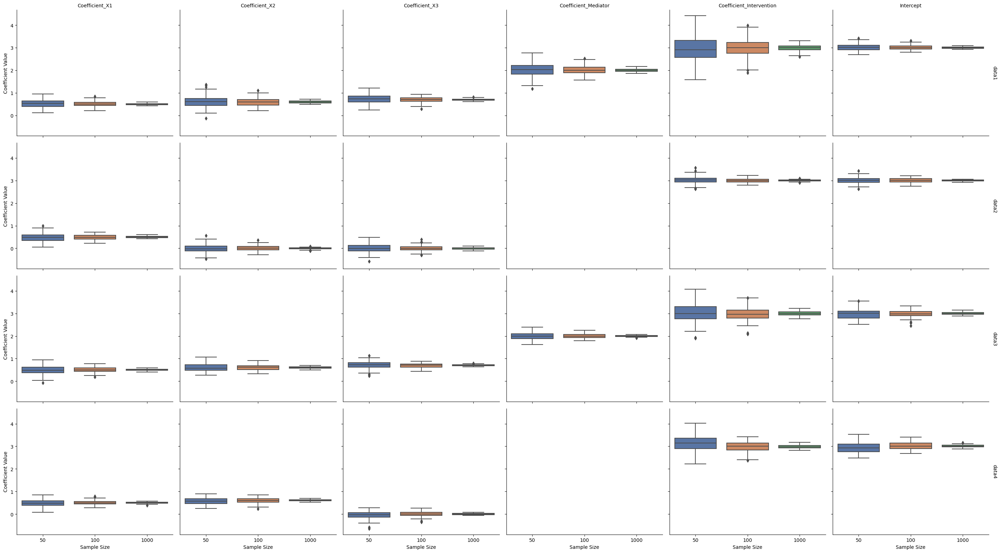

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame to have a 'Coefficient' column
melted_df = results_df_ols.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create the FacetGrid using 'Data_Type' for rows and 'Coefficient' for columns
g = sns.FacetGrid(melted_df, row="Data_Type", col="Coefficient", margin_titles=True, height=4, aspect=1.2)
g.map_dataframe(sns.boxplot, y="Value", x="Sample_Size", palette="deep")
g.set_axis_labels("Sample Size", "Coefficient Value")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
#g.add_legend(title="Sample Size")
g.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


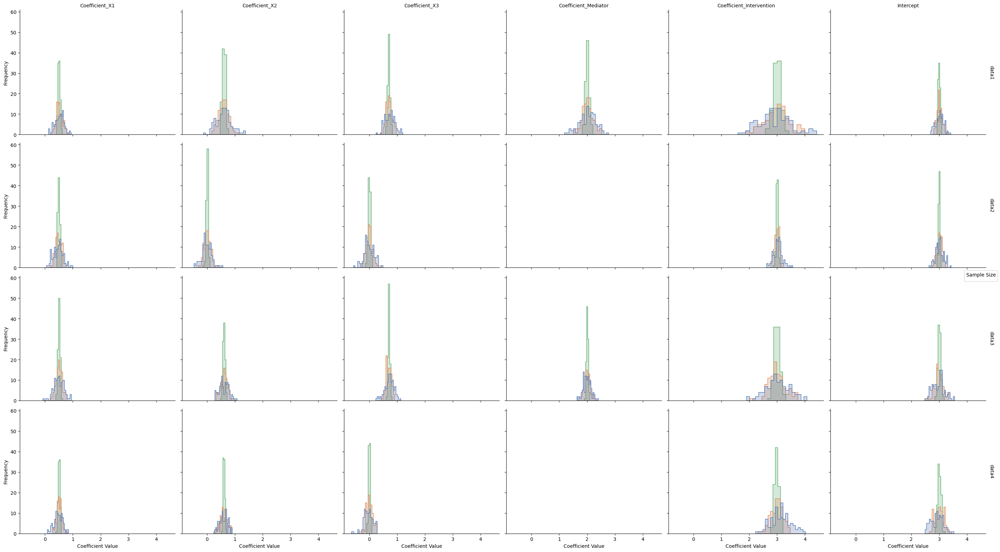

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of coefficient columns for the melt function
coefficients_columns = [
    'Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 
    'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept'
]

# Melt the DataFrame to have a 'Coefficient' column
melted_df = results_df_ols.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create the FacetGrid using 'Data_Type' for rows and 'Coefficient' for columns
g = sns.FacetGrid(melted_df, row="Data_Type", col="Coefficient", margin_titles=True, height=4, aspect=1.2)
g.map_dataframe(sns.histplot, x="Value", hue="Sample_Size", element="step", common_norm=False, palette="deep", bins=20)
g.set_axis_labels("Coefficient Value", "Frequency")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Add the legend manually
handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, loc='center right', title="Sample Size")

g.tight_layout()
plt.show()

## 2. DoWhy

In [9]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import dowhy
from dowhy import CausalModel
import matplotlib.pyplot as plt

# Define the generate_data function
def generate_data(data_type, n_samples):
    alpha = 3 
    beta1 = 0.5
    beta2 = 0.6
    beta3 = 0.7
    gamma1 = 2
    gamma2 = 3
    
    # Generate confounders
    X1 = np.random.normal(0, 1, size=n_samples)
    X2 = np.random.normal(0, 1, size=n_samples)
    X3 = np.random.normal(0, 1, size=n_samples)
    
    if data_type == "data1": 
        T = beta1 * X1 +  + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        M = gamma1 * T + beta2 * X2 + np.random.normal(loc=0, scale=0.5, size=n_samples)
        Y = alpha +  gamma2* T + gamma1 * M + beta1* X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'Mediator': M, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    elif data_type == "data2":
        T = beta1 * X1 + + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        Y = alpha  + gamma2* T + beta1* X1 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    elif data_type == "data3":
        prob_T = 1 / (1 + np.exp(-(X1 + X2)))  # Logistic function
        T = (np.random.rand(n_samples) < prob_T).astype(int)
        M = gamma1 * T + beta1 * X1 - beta2 * X2 + np.random.normal(loc=0, scale=1, size=n_samples)
        Y = alpha + gamma2* T + gamma1 * M + beta1 * X1 + beta2 * X2 + beta3 * X3 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'Mediator': M, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})
    
    elif data_type == "data4":
        prob_T = 1 / (1 + np.exp(-(X1 + X2 + X3)))  # Logistic function
        T = (np.random.rand(n_samples) < prob_T).astype(int)
        Y = alpha + gamma2 * T + beta1 * X1 + beta2 * X2 + np.random.normal(loc=0, scale=1, size=n_samples)
        return pd.DataFrame({'Intervention': T, 'X1': X1, 'X2': X2, 'X3': X3, 'Outcome': Y})

    else:
        raise ValueError("Unknown data type")

#### Total Effect - with graphs

In [10]:
# Total Effect - with graphs
import pandas as pd

# Number of iterations to obtain 100 sets of coefficients
num_iterations = 100

# Datasets
data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]

results_df_DoWhy_TEG = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

def calculate_mape(data, coeff_dict, data_type, Intercept):
    """
    Calculate the Mean Absolute Percentage Error.
    """
    # Use coefficients passed to the function
    Coefficient_Intervention = coeff_dict['Coefficient_Intervention']
    
    X_test = data.drop('Outcome', axis=1)
    Y_test = data['Outcome']
    
    # Extract treatments from data
    T = X_test["Intervention"]


    # Calculate predictions based on data type
    if data_type == "data1": 
        predictions = Intercept +  Coefficient_Intervention * T 
    elif data_type == "data2":
        predictions = Intercept  + Coefficient_Intervention * T 
    elif data_type == "data3":
        predictions = Intercept + Coefficient_Intervention * T 
    elif data_type == "data4":
        predictions = Intercept + Coefficient_Intervention * T 
    else:
        raise ValueError("Unknown data type")
    
    rmse = np.sqrt(np.mean(np.square((Y_test - predictions))))
    
    ape = np.abs((Y_test - predictions) / (Y_test))
    mape = np.mean(ape)*100

    return rmse, mape


def estimate_effect_for_treatment(data_type, data, treatment, graph):
    
    if data_type == "data1": 
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', graph=graph)
    elif data_type == "data2":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', graph=graph)
    elif data_type == "data3":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', graph=graph)
    elif data_type == "data4":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', graph=graph)
    else:
        raise ValueError("Unknown data type")
    
    identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
    estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
    
    return estimate.value, estimate.intercept

# Run the estimation multiple times for each data type
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
            # Generate synthetic data based on the current sample size
            #data = generate_data(data_type, sample_size)
            
            total_samples = sample_size + 1000  # Including training and testing
            data = generate_data(data_type, total_samples)
            
            # Shuffle and split the data
            shuffled_data = data.sample(frac=1, random_state=None)
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:]

            # Define the causal graph based on data type
            graphs = {
                'data1': """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        Intervention-> Mediator;
                        X2->Mediator
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                'data2' : """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        X1->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                'data3' : """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        X2->Mediator;
                        X1->Mediator;
                        Intervention->Mediator;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                'data4': """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        Intervention->Outcome;
                    }"""
            }
            causal_graph = graphs[data_type]
            
            # Define which treatments to estimate for each data type
            treatments_to_estimate = {
                'data1': ['X1', 'X2', 'X3', 'Mediator', 'Intervention'],
                'data2': ['X1', 'Intervention'],
                'data3': ['X1', 'X2', 'X3',  'Mediator', 'Intervention'],
                'data4': ['X1', 'X2', 'Intervention'],
            }
            
            coefficients = []
            intercept = None
            mape_values = {}  # Dictionary to hold MAPE values for each treatment
            
            for treatment in treatments_to_estimate[data_type]:
                coef, intercept = estimate_effect_for_treatment(data_type, train_data, treatment, causal_graph)
                coefficients.append(coef)
                
            # Create a dictionary to hold placeholder coefficients
            coeff_dict = {
                'Coefficient_X1': None,
                'Coefficient_X2': None,
                'Coefficient_X3': None,
                'Coefficient_Mediator': None,
                'Coefficient_Intervention': None
            }

            # For each treatment in the current data type, update the coefficient in the dictionary
            for idx, treatment in enumerate(treatments_to_estimate[data_type]):
                coeff_dict[f'Coefficient_{treatment}'] = coefficients[idx]
            
            rmse, mape = calculate_mape(test_data, coeff_dict, data_type, intercept)
            

            # Append to results dataframe
            results_df_DoWhy_TEG = results_df_DoWhy_TEG.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                **coeff_dict,
                'Intercept': intercept,
                'MAPE': mape,
                'RMSE': rmse
            }, ignore_index=True)

        
# Printing the results
results_df_DoWhy_TEG


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/472702991.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEG = results_df_DoWhy_TEG.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/472702991.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEG = results_df_DoWhy_TEG.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/472702991.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEG = results_df_DoWhy_TEG.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/472702991.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Us

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,4.464922,4.298647,4.309976,2.348634,6.912356,2.735806,159.028173,2.544698
1,data1,50,2,4.489654,6.34839,7.190956,2.096026,7.188358,2.950039,71.121732,2.315714
2,data1,50,3,4.658768,6.438988,3.803495,2.328942,6.782056,2.821155,98.083471,2.637387
3,data1,50,4,3.391263,4.846129,1.901202,2.002785,6.737638,3.306650,110.640551,2.729285
4,data1,50,5,0.981043,4.703004,4.46833,1.738236,7.198491,3.476702,72.868237,2.387160
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,0.847279,1.046346,None,None,2.894101,3.067269,99.833285,1.276547
1196,data4,1000,97,1.035707,1.095999,None,None,3.022585,2.957959,65.303640,1.249854
1197,data4,1000,98,1.016251,1.05465,None,None,2.883197,3.048135,66.502078,1.311166
1198,data4,1000,99,0.973140,1.037818,None,None,3.046355,2.977021,78.709808,1.332812


In [11]:
# Convert None values to NaN for correct aggregation
results_df_DoWhy_TEG = results_df_DoWhy_TEG.where(pd.notna(results_df_DoWhy_TEG), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_DoWhy_TEG = results_df_DoWhy_TEG.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_DoWhy_TEG

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,4.075193,6.332055,5.677502,2.010559,6.999010,3.003247,156.511214,2.473703
1,data1,100,50.5,3.965903,5.931025,5.530785,1.974962,6.997907,2.998764,179.896074,2.467300
2,data1,1000,50.5,3.957475,5.999379,5.606926,2.009747,6.996398,3.007619,111.214811,2.445608
3,data2,50,50.5,1.945745,NaN,NaN,NaN,2.990264,3.012492,128.023338,1.131751
4,data2,100,50.5,1.962543,NaN,NaN,NaN,3.012213,3.021063,171.203898,1.130133
5,data2,1000,50.5,1.980401,NaN,NaN,NaN,2.999586,3.001059,146.574038,1.118811
6,data3,50,50.5,2.825815,0.780320,0.633604,1.973563,6.967036,3.035336,345.007481,2.889933
7,data3,100,50.5,2.791636,0.645956,0.739649,2.004678,7.027835,3.011599,375.944361,2.866571
8,data3,1000,50.5,2.750154,0.674361,0.698272,1.998936,7.005180,2.981504,422.447197,2.843923
9,data4,50,50.5,0.966566,1.082403,NaN,NaN,3.022725,2.981338,120.020696,1.289470


#### Total Effect - with graphs + CC 

In [12]:

import pandas as pd

# Number of iterations to obtain 100 sets of coefficients
num_iterations = 100

# Datasets
data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]

results_df_DoWhy_TEG_CC = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

def calculate_mape(data, coeff_dict, data_type, Intercept):
    """
    Calculate the Mean Absolute Percentage Error.
    """
    # Use coefficients passed to the function
    Coefficient_Intervention = coeff_dict['Coefficient_Intervention']
    
    X_test = data.drop('Outcome', axis=1)
    Y_test = data['Outcome']
    
    # Extract treatments from data
    T = X_test["Intervention"]


    # Calculate predictions based on data type
    if data_type == "data1": 
        predictions = Intercept +  Coefficient_Intervention * T 
    elif data_type == "data2":
        predictions = Intercept  + Coefficient_Intervention * T 
    elif data_type == "data3":
        predictions = Intercept + Coefficient_Intervention * T 
    elif data_type == "data4":
        predictions = Intercept + Coefficient_Intervention * T 
    else:
        raise ValueError("Unknown data type")
    
    rmse = np.sqrt(np.mean(np.square((Y_test - predictions))))
    
    ape = np.abs((Y_test - predictions) / (Y_test))
    mape = np.mean(ape)*100

    return rmse, mape


def estimate_effect_for_treatment(data_type, data, treatment, graph):
    
    if data_type == "data1": 
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1', 'X2', 'X3'], graph=graph)
    elif data_type == "data2":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1'],instruments=['X2','X3'], graph=graph)
    elif data_type == "data3":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1', 'X2'], graph=graph)
    elif data_type == "data4":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1', 'X2'], instruments=['X3'], graph=graph)
    else:
        raise ValueError("Unknown data type")
    
    identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
    estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
    
    return estimate.value, estimate.intercept

# Run the estimation multiple times for each data type
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
            # Generate synthetic data based on the current sample size
            #data = generate_data(data_type, sample_size)
            
            total_samples = sample_size + 1000  # Including training and testing
            data = generate_data(data_type, total_samples)
            
            # Shuffle and split the data
            shuffled_data = data.sample(frac=1, random_state=None)
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:]

            # Define the causal graph based on data type
            graphs = {
                'data1': """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        Intervention-> Mediator;
                        X2->Mediator
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                'data2' : """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        X1->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                'data3' : """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        X2->Mediator;
                        X1->Mediator;
                        Intervention->Mediator;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                'data4': """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        Intervention->Outcome;
                    }"""
            }
            causal_graph = graphs[data_type]
            
            # Define which treatments to estimate for each data type
            treatments_to_estimate = {
                'data1': ['X1', 'X2', 'X3', 'Mediator', 'Intervention'],
                'data2': ['X1', 'Intervention'],
                'data3': ['X1', 'X2', 'X3',  'Mediator', 'Intervention'],
                'data4': ['X1', 'X2', 'Intervention'],
            }
            
            coefficients = []
            intercept = None
            mape_values = {}  # Dictionary to hold MAPE values for each treatment
            
            for treatment in treatments_to_estimate[data_type]:
                coef, intercept = estimate_effect_for_treatment(data_type, train_data, treatment, causal_graph)
                coefficients.append(coef)
                
            # Create a dictionary to hold placeholder coefficients
            coeff_dict = {
                'Coefficient_X1': None,
                'Coefficient_X2': None,
                'Coefficient_X3': None,
                'Coefficient_Mediator': None,
                'Coefficient_Intervention': None
            }

            # For each treatment in the current data type, update the coefficient in the dictionary
            for idx, treatment in enumerate(treatments_to_estimate[data_type]):
                coeff_dict[f'Coefficient_{treatment}'] = coefficients[idx]
            
            rmse, mape = calculate_mape(test_data, coeff_dict, data_type, intercept)
            

            # Append to results dataframe
            results_df_DoWhy_TEG_CC = results_df_DoWhy_TEG_CC.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                **coeff_dict,
                'Intercept': intercept,
                'MAPE': mape,
                'RMSE': rmse
            }, ignore_index=True)

        
# Printing the results
results_df_DoWhy_TEG_CC


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1635091539.py:167: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEG_CC = results_df_DoWhy_TEG_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1635091539.py:167: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEG_CC = results_df_DoWhy_TEG_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1635091539.py:167: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEG_CC = results_df_DoWhy_TEG_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1635091539.py:167: FutureWarning: The frame.append method is deprecated and will be removed from pandas i

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,4.101289,7.48671,6.780745,2.064071,6.678184,3.409947,57.921111,2.763381
1,data1,50,2,1.039939,4.589653,3.473981,2.418238,6.803832,2.647233,77.441807,2.615320
2,data1,50,3,5.363656,4.369975,3.104554,1.406981,7.224361,3.185381,136.971568,2.326591
3,data1,50,4,4.218175,6.33886,7.268789,2.121514,7.255998,2.852756,61.834319,2.278931
4,data1,50,5,0.251314,7.69518,7.06325,1.814159,7.039169,2.680296,181.451190,2.511812
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,1.022935,1.031682,None,None,2.996314,2.993122,62.479707,1.279844
1196,data4,1000,97,1.048472,1.04903,None,None,3.016441,2.979651,40.603021,1.209677
1197,data4,1000,98,1.119650,1.168449,None,None,2.870891,3.076161,96.553240,1.320143
1198,data4,1000,99,1.084632,1.139443,None,None,2.983613,3.057967,57.628149,1.322268


In [13]:
# Convert None values to NaN for correct aggregation
results_df_DoWhy_TEG_CC = results_df_DoWhy_TEG_CC.where(pd.notna(results_df_DoWhy_TEG), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_DoWhy_TEG_CC = results_df_DoWhy_TEG_CC.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_DoWhy_TEG_CC

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,3.824865,5.899690,5.444550,2.003627,6.970737,3.033781,113.199961,2.490795
1,data1,100,50.5,4.083806,6.015195,5.669683,2.009311,6.989701,2.997589,120.860164,2.459469
2,data1,1000,50.5,3.988433,5.989071,5.595436,1.992071,7.003056,2.998673,379.847935,2.443595
3,data2,50,50.5,2.006035,NaN,NaN,NaN,2.968046,3.025060,136.679867,1.143249
4,data2,100,50.5,2.001495,NaN,NaN,NaN,2.988996,2.992846,163.053919,1.127133
5,data2,1000,50.5,2.000961,NaN,NaN,NaN,3.002144,3.000889,148.375797,1.115239
6,data3,50,50.5,2.705753,0.640841,0.731062,2.009221,7.099258,2.883034,293.085581,2.911867
7,data3,100,50.5,2.783974,0.769495,0.734369,2.005025,6.957947,3.052310,288.906492,2.867048
8,data3,1000,50.5,2.770933,0.668857,0.685193,2.005449,6.993155,3.013148,346.681036,2.842612
9,data4,50,50.5,0.995623,1.115555,NaN,NaN,2.997493,2.979639,162.027955,1.289925


#### DoWhy without Any assumptions

In [14]:
# Direct Efffect without Graph
import pandas as pd

# Number of iterations to obtain 100 sets of coefficients
num_iterations = 100

# Datasets
data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]

results_df_DoWhy_DE = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

def estimate_effect_for_treatment(data_type, data, treatment):
                
    model = CausalModel(
        data=data, 
        treatment=treatment, 
        outcome='Outcome'
    )
    
    model.view_model()

    identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
    estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
    
    # Check for the existence of the intercept attribute
    intercept = getattr(estimate, 'intercept', None)
    
    return estimate.value, intercept


def calculate_mape(data, coeff_dict, data_type, Intercept):
    """
    Calculate the Mean Absolute Percentage Error.
    """
    # Use coefficients passed to the function
    Coefficient_Intervention = coeff_dict['Coefficient_Intervention']
    
    X_test = data.drop('Outcome', axis=1)
    Y_test = data['Outcome']
    
    # Extract treatments from data
    T = X_test["Intervention"]


    # Calculate predictions based on data type
    if data_type == "data1": 
        predictions = Intercept +  Coefficient_Intervention * T 
    elif data_type == "data2":
        predictions = Intercept  + Coefficient_Intervention * T 
    elif data_type == "data3":
        predictions = Intercept + Coefficient_Intervention * T 
    elif data_type == "data4":
        predictions = Intercept + Coefficient_Intervention * T 
    else:
        raise ValueError("Unknown data type")
    
    rmse = np.sqrt(np.mean(np.square((Y_test - predictions))))
    
    ape = np.abs((Y_test - predictions) / (Y_test))
    mape = np.mean(ape)*100

    return rmse, mape

# Run the estimation multiple times for each data type
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
            # Generate synthetic data based on the current sample size
            #data = generate_data(data_type, sample_size)
            
            total_samples = sample_size + 1000  # Including training and testing
            data = generate_data(data_type, total_samples)
            
            if i == 0:
                print(f"Data Type: {data_type}, Sample Size: {sample_size}, Iteration: {i+1}")
                print(data.describe())
                print("="*50)  # Printing a separator for clarity
            
            # Shuffle and split the data
            shuffled_data = data.sample(frac=1, random_state=None)
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:]

            # Define which treatments to estimate for each data type
            treatments_to_estimate = {
                'data1': ['X1', 'X2', 'X3', 'Mediator', 'Intervention'],
                'data2': ['X1', 'Intervention'],
                'data3': ['X1', 'X2', 'X3',  'Mediator', 'Intervention'],
                'data4': ['X1', 'X2', 'Intervention'],
            }
            
            coefficients = []
            intercept = None
            mape_values = {}  # Dictionary to hold MAPE values for each treatment
            
            for treatment in treatments_to_estimate[data_type]:
                coef, intercept_for_treatment = estimate_effect_for_treatment(data_type, train_data, treatment)
                coefficients.append(coef)
                
                #if treatment == "Intervention":
                #    intercept = intercept_for_treatment  # Only store intercept for the "Intervention"
                
                #mape_for_treatment = calculate_mape_with_coeff(test_data, treatment, coef)
                #mape_values[treatment] = mape_for_treatment
                
            # Create a dictionary to hold placeholder coefficients
            coeff_dict = {
                'Coefficient_X1': None,
                'Coefficient_X2': None,
                'Coefficient_X3': None,
                'Coefficient_Mediator': None,
                'Coefficient_Intervention': None
            }

            # For each treatment in the current data type, update the coefficient in the dictionary
            for idx, treatment in enumerate(treatments_to_estimate[data_type]):
                coeff_dict[f'Coefficient_{treatment}'] = coefficients[idx]
            
            rmse, mape = calculate_mape(test_data, coeff_dict, data_type, intercept_for_treatment)
            
            # Append to results dataframe
            results_df_DoWhy_DE = results_df_DoWhy_DE.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                **coeff_dict,
                'Intercept': intercept_for_treatment,
                'MAPE': mape, 
                'RMSE': rmse
                
                #'MAPE': mape_values.get("Intervention", None)  # Assuming you want to store MAPE for "Intervention" only
            }, ignore_index=True)
                    
# Printing the results
results_df_DoWhy_DE

Data Type: data1, Sample Size: 50, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000   
mean      -0.011494    -0.023798    -0.002929    -0.005212    -0.067205   
std        1.485553     3.356709     1.010734     1.048623     1.003151   
min       -5.010861   -11.375766    -3.222407    -4.167172    -3.065816   
25%       -0.964391    -2.149026    -0.687260    -0.670338    -0.733477   
50%       -0.040645    -0.089702    -0.035762    -0.031172    -0.054507   
75%        0.987862     2.226641     0.637411     0.665782     0.574261   
max        4.477888     9.945911     3.935771     2.926444     3.465312   

           Outcome  
count  1050.000000  
mean      2.862895  
std      12.023370  
min     -37.662906  
25%      -4.915192  
50%       2.651294  
75%      11.193880  
max      37.821264  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data1, Sample Size: 100, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000   
mean      -0.085750    -0.184605    -0.071413    -0.036344    -0.011447   
std        1.476409     3.272011     0.990314     1.019934     1.006036   
min       -4.455623    -9.377949    -3.168676    -3.716603    -3.649977   
25%       -1.082793    -2.473553    -0.739837    -0.737884    -0.663555   
50%       -0.095128    -0.162953    -0.059326    -0.036810    -0.006270   
75%        0.964802     2.055072     0.578463     0.642665     0.654828   
max        4.941224     9.485303     3.296241     3.309852     3.450045   

           Outcome  
count  1100.000000  
mean      2.344773  
std      11.706502  
min     -31.774225  
25%      -5.867654  
50%       2.321008  
75%      10.507405  
max      36.455068  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data1, Sample Size: 1000, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   
mean      -0.029159    -0.058773    -0.009076     0.009736    -0.031923   
std        1.474108     3.278481     0.987073     0.992829     1.003247   
min       -5.525813   -11.370332    -3.315935    -3.189299    -3.221818   
25%       -1.005092    -2.162904    -0.662790    -0.668551    -0.718260   
50%       -0.018774    -0.052809     0.006483     0.011871    -0.030160   
75%        0.955850     2.089533     0.657212     0.711818     0.639262   
max        5.455915    12.641722     3.177149     3.331191     3.059096   

           Outcome  
count  2000.000000  
mean      2.766798  
std      11.803067  
min     -40.699850  
25%      -4.663899  
50%       2.766905  
75%      10.497550  
max      48.354591  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data2, Sample Size: 50, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000
mean       0.030439     0.033852     0.026583     0.022414     3.103650
std        1.391091     0.990329     0.991703     0.973924     4.466080
min       -5.193618    -3.355930    -3.260748    -3.556187   -14.100679
25%       -0.936619    -0.635302    -0.657597    -0.596565     0.050391
50%        0.041602     0.016334     0.014629     0.018717     3.244695
75%        0.992613     0.716267     0.724381     0.700775     6.081379
max        4.026915     3.351317     3.143218     3.306112    16.067707


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data2, Sample Size: 100, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000
mean      -0.058327     0.001256    -0.024671    -0.011917     2.847571
std        1.388119     0.950990     0.968512     0.995639     4.474898
min       -5.113328    -3.222977    -2.810247    -2.882196   -12.177969
25%       -0.928353    -0.657505    -0.642371    -0.671501    -0.046458
50%       -0.048011     0.013146    -0.036873     0.012006     2.895165
75%        0.851560     0.653020     0.572836     0.644124     5.761749
max        4.697780     2.753666     2.905227     3.067678    17.099962


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data2, Sample Size: 1000, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000
mean      -0.020887    -0.005285    -0.038505     0.017758     2.921516
std        1.445665     0.996992     0.992347     1.000881     4.643584
min       -4.860990    -3.309848    -3.069182    -2.992629   -13.548103
25%       -0.974627    -0.671007    -0.741912    -0.653653    -0.230205
50%       -0.034389    -0.009558    -0.054138     0.008610     2.966066
75%        0.958034     0.638214     0.640451     0.699672     5.952365
max        5.341592     3.609825     3.391432     3.842187    19.279382


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data3, Sample Size: 50, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000   
mean       0.528571     1.043321     0.004861     0.015049    -0.027872   
std        0.499421     1.594187     0.983624     0.991602     1.002729   
min        0.000000    -3.659387    -2.655865    -3.079858    -3.265014   
25%        0.000000    -0.118064    -0.644530    -0.597530    -0.697456   
50%        1.000000     1.102535    -0.012187     0.021032    -0.024845   
75%        1.000000     2.157221     0.632364     0.670237     0.600964   
max        1.000000     5.703683     3.032256     3.138823     3.019168   

           Outcome  
count  1050.000000  
mean      6.624909  
std       4.675194  
min      -5.079264  
25%       2.729924  
50%       6.721574  
75%      10.438607  
max      19.816151  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data3, Sample Size: 100, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000   
mean       0.510000     1.004996    -0.033904     0.026258    -0.018284   
std        0.500127     1.609106     0.993272     0.961895     1.021485   
min        0.000000    -3.378399    -3.207592    -3.055813    -4.588192   
25%        0.000000    -0.152929    -0.734511    -0.641265    -0.699597   
50%        1.000000     1.014452    -0.024862     0.034316    -0.013522   
75%        1.000000     2.216829     0.653272     0.680970     0.683614   
max        1.000000     5.806472     3.840918     3.265450     3.671820   

           Outcome  
count  1100.000000  
mean      6.538009  
std       4.858664  
min      -6.995024  
25%       2.563973  
50%       6.273181  
75%      10.681033  
max      19.309541  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data3, Sample Size: 1000, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   
mean       0.500000     1.003375     0.000506    -0.009268     0.008489   
std        0.500125     1.581037     0.963810     1.000351     1.008665   
min        0.000000    -4.371685    -2.992046    -3.641679    -3.330448   
25%        0.000000    -0.049470    -0.666607    -0.672504    -0.664479   
50%        0.500000     0.999162     0.009396    -0.008689     0.029864   
75%        1.000000     2.083430     0.650142     0.679252     0.642901   
max        1.000000     5.500243     3.660941     3.219644     3.560486   

           Outcome  
count  2000.000000  
mean      6.506084  
std       4.752908  
min      -6.470772  
25%       2.841025  
50%       6.476149  
75%      10.248260  
max      18.580433  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data4, Sample Size: 50, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000
mean       0.456190    -0.046190     0.007433    -0.020032     4.343994
std        0.498314     1.014190     1.009498     0.987579     2.273017
min        0.000000    -2.964800    -3.096088    -2.959124    -1.062463
25%        0.000000    -0.735324    -0.638860    -0.660770     2.441656
50%        0.000000    -0.059358    -0.001343    -0.032746     4.220785
75%        1.000000     0.668231     0.695622     0.598588     6.272735
max        1.000000     3.137040     2.889480     3.236445    10.371944


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data4, Sample Size: 100, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000
mean       0.520000    -0.016751     0.025215    -0.029275     4.597939
std        0.499827     0.999985     1.017503     0.979236     2.257048
min        0.000000    -3.036065    -3.390263    -3.195066    -1.335590
25%        0.000000    -0.660821    -0.655036    -0.671139     2.668364
50%        1.000000    -0.026384     0.009376    -0.006725     4.867894
75%        1.000000     0.641862     0.671546     0.632880     6.476612
max        1.000000     3.687510     2.897974     3.393464     9.739325


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

Data Type: data4, Sample Size: 1000, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000
mean       0.508500    -0.021665     0.012931     0.008850     4.517966
std        0.500053     1.005214     1.015065     1.020963     2.247510
min        0.000000    -3.647277    -4.627151    -3.313502    -1.393940
25%        0.000000    -0.673056    -0.656137    -0.654400     2.592311
50%        1.000000    -0.015271    -0.005679     0.020577     4.533216
75%        1.000000     0.684169     0.685652     0.687491     6.362038
max        1.000000     3.863224     3.716425     3.577110    10.704157


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE = results_df_DoWhy_DE.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/4128020406.py:127: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,3.021372,6.80184,2.042813,3.471519,8.375263,3.038499,81.387330,2.182374
1,data1,50,2,5.042748,4.589356,8.059704,3.521237,7.891774,2.568882,407.727286,2.134297
2,data1,50,3,4.549376,7.725168,6.484355,3.481107,7.955515,2.937585,69.268898,2.156611
3,data1,50,4,2.969970,5.547916,5.20549,3.45111,7.678825,3.138909,486.015253,2.142283
4,data1,50,5,1.891006,7.592922,5.325071,3.461856,7.957060,3.212782,400.689898,2.133288
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,0.954835,1.170094,None,None,3.786465,2.529322,45.446497,1.222567
1196,data4,1000,97,1.000079,1.136962,None,None,3.744603,2.594059,43.396495,1.210191
1197,data4,1000,98,1.067245,1.121449,None,None,3.710800,2.683123,63.797669,1.231290
1198,data4,1000,99,1.102485,1.137079,None,None,3.855365,2.567296,88.067742,1.149890


In [15]:
# Convert None values to NaN for correct aggregation
results_df_DoWhy_DE = results_df_DoWhy_DE.where(pd.notna(results_df_DoWhy_DE), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_DoWhy_DE = results_df_DoWhy_DE.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_DoWhy_DE

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,4.042206,5.906119,5.376093,3.541610,7.884934,2.979111,216.167962,2.136180
1,data1,100,50.5,4.060643,6.143818,5.664262,3.550661,7.867797,3.017425,122.644280,2.125217
2,data1,1000,50.5,3.986564,6.065100,5.663631,3.555127,7.875684,3.000403,132.263201,2.098624
3,data2,50,50.5,1.991262,NaN,NaN,NaN,3.122549,2.980138,161.647680,1.122634
4,data2,100,50.5,1.973839,NaN,NaN,NaN,3.131634,2.991006,126.288998,1.117874
5,data2,1000,50.5,2.010492,NaN,NaN,NaN,3.119502,3.004825,170.930835,1.100287
6,data3,50,50.5,2.845236,0.647862,0.599800,2.691290,7.666296,2.662156,274.332342,2.888593
7,data3,100,50.5,2.838399,0.633601,0.751452,2.680973,7.693105,2.614354,301.181713,2.868122
8,data3,1000,50.5,2.777362,0.677649,0.700964,2.687488,7.659048,2.676519,273.555776,2.828897
9,data4,50,50.5,0.998104,1.131169,NaN,NaN,3.749204,2.639616,108.417112,1.238500


#### Direct Efffect without Graph (With CC - all the remaining variables)

In [16]:
# Direct Efffect without Graph
import pandas as pd

# Number of iterations to obtain 100 sets of coefficients
num_iterations = 100

# Datasets
data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]

results_df_DoWhy_DE_CC = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

def estimate_effect_for_treatment(data_type, data, treatment):
    
    models_config = {
        "data1": {
            "Intervention": {"common_causes": ['X1', 'X2', 'X3', 'Mediator']},
            "Mediator": {"common_causes": ['Intervention', 'X2', 'X1', 'X2']},
            "X1": {"common_causes": ['X2', 'X3', 'Intervention', 'Mediator']},
            "X2": {"common_causes": ['X1', 'X3', 'Intervention', 'Mediator']},
            "X3": {"common_causes": ['X1', 'X2', 'Intervention', 'Mediator']},
        },
        "data2": {
            "Intervention": {"common_causes": ['X1']},
            "X1": {"common_causes": ['Intervention']},
        },
        "data3": {
            "Intervention": {"common_causes": ['X1', 'X2', 'X3', 'Mediator']},
            "Mediator": {"common_causes": ['Intervention', 'X1', 'X2', 'X3']},
            "X1": {"common_causes": ['X2', 'X3', 'Intervention', 'Mediator']},
            "X2": {"common_causes": ['X1', 'X3','Intervention', 'Mediator']},
            "X3": {"common_causes": ['X1', 'X2','Intervention', 'Mediator']},
        },
        "data4": {
            "Intervention": {"common_causes": ['X1', 'X2']},
            "X1": {"common_causes": ['X2', 'Intervention']},
            "X2": {"common_causes": ['X1', 'Intervention']},
        }
    }
    
    if data_type not in models_config:
        raise ValueError("Unknown data type")
    
    if treatment not in models_config[data_type]:
        raise ValueError(f"Unknown treatment for data type {data_type}")
    
    config = models_config[data_type][treatment]
    
    model = CausalModel(
        data=data, 
        treatment=treatment, 
        outcome='Outcome', 
        common_causes=config.get("common_causes", []), 
        instruments=config.get("instruments", []), 
    )
    
    identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
    estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
    
    # Check for the existence of the intercept attribute
    intercept = getattr(estimate, 'intercept', None)
    
    return estimate.value, intercept


def calculate_mape(data, coeff_dict, data_type, Intercept):
    """
    Calculate the Mean Absolute Percentage Error.
    """
    # Use coefficients passed to the function
    Coefficient_Intervention = coeff_dict['Coefficient_Intervention']
    Coefficient_Mediator = coeff_dict['Coefficient_Mediator']
    Coefficient_X1 = coeff_dict['Coefficient_X1']
    Coefficient_X2 = coeff_dict['Coefficient_X2']
    Coefficient_X3 = coeff_dict['Coefficient_X3']
    
    X_test = data.drop('Outcome', axis=1)
    Y_test = data['Outcome']
    
    # Extract treatments from data
    T = X_test["Intervention"]
    M = X_test["Mediator"] if "Mediator" in X_test.columns else 0
    X1 = X_test["X1"]
    X2 = X_test["X2"]
    X3 = X_test["X3"]

    # Calculate predictions based on data type
    if data_type == "data1": 
        predictions = Intercept +  Coefficient_Intervention * T + Coefficient_Mediator * M + Coefficient_X1 * X1 + Coefficient_X2 * X2 + Coefficient_X3 * X3 + np.random.normal(loc=0, scale=1, size=1000)
    elif data_type == "data2":
        predictions = Intercept  + Coefficient_Intervention * T + Coefficient_X1 * X1 + np.random.normal(loc=0, scale=1, size=1000)
    elif data_type == "data3":
        predictions = Intercept + Coefficient_Intervention * T + Coefficient_Mediator * M + Coefficient_X1 * X1 + Coefficient_X2 * X2 + Coefficient_X3 * X3 + np.random.normal(loc=0, scale=1, size=1000)
    elif data_type == "data4":
        predictions = Intercept + Coefficient_Intervention * T + Coefficient_X1 * X1 + Coefficient_X2 * X2 + np.random.normal(loc=0, scale=1, size=1000)
    else:
        raise ValueError("Unknown data type")
    
    rmse = np.sqrt(np.mean(np.square((Y_test - predictions))))
    
    ape = np.abs((Y_test - predictions) / (Y_test))
    mape = np.mean(ape)*100

    return rmse, mape

# Run the estimation multiple times for each data type
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
            # Generate synthetic data based on the current sample size
            #data = generate_data(data_type, sample_size)
            
            total_samples = sample_size + 1000  # Including training and testing
            data = generate_data(data_type, total_samples)
            
            if i == 0:
                print(f"Data Type: {data_type}, Sample Size: {sample_size}, Iteration: {i+1}")
                print(data.describe())
                print("="*50)  # Printing a separator for clarity
            
            # Shuffle and split the data
            shuffled_data = data.sample(frac=1, random_state=None)
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:]

            # Define which treatments to estimate for each data type
            treatments_to_estimate = {
                'data1': ['X1', 'X2', 'X3', 'Mediator', 'Intervention'],
                'data2': ['X1', 'Intervention'],
                'data3': ['X1', 'X2', 'X3',  'Mediator', 'Intervention'],
                'data4': ['X1', 'X2', 'Intervention'],
            }
            
            coefficients = []
            intercept = None
            mape_values = {}  # Dictionary to hold MAPE values for each treatment
            
            for treatment in treatments_to_estimate[data_type]:
                coef, intercept_for_treatment = estimate_effect_for_treatment(data_type, train_data, treatment)
                coefficients.append(coef)
                
                #if treatment == "Intervention":
                #    intercept = intercept_for_treatment  # Only store intercept for the "Intervention"
                
                #mape_for_treatment = calculate_mape_with_coeff(test_data, treatment, coef)
                #mape_values[treatment] = mape_for_treatment
                
            # Create a dictionary to hold placeholder coefficients
            coeff_dict = {
                'Coefficient_X1': None,
                'Coefficient_X2': None,
                'Coefficient_X3': None,
                'Coefficient_Mediator': None,
                'Coefficient_Intervention': None
            }

            # For each treatment in the current data type, update the coefficient in the dictionary
            for idx, treatment in enumerate(treatments_to_estimate[data_type]):
                coeff_dict[f'Coefficient_{treatment}'] = coefficients[idx]
            
            rmse, mape = calculate_mape(test_data, coeff_dict, data_type, intercept_for_treatment)
            
            # Append to results dataframe
            results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                **coeff_dict,
                'Intercept': intercept_for_treatment,
                'MAPE': mape, 
                'RMSE': rmse
                
                #'MAPE': mape_values.get("Intervention", None)  # Assuming you want to store MAPE for "Intervention" only
            }, ignore_index=True)
                    
# Printing the results
results_df_DoWhy_DE_CC

/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({


Data Type: data1, Sample Size: 50, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000   
mean      -0.031598    -0.052290    -0.057782    -0.001420     0.034273   
std        1.444083     3.239611     0.996660     0.993719     0.999978   
min       -4.213050    -9.724682    -3.727923    -2.998083    -2.846706   
25%       -1.031214    -2.177910    -0.746064    -0.712667    -0.607590   
50%        0.028202    -0.054841    -0.067875     0.001641     0.027811   
75%        0.933715     2.158615     0.603769     0.647414     0.722907   
max        5.281248    12.275832     2.970278     3.292313     3.186627   

           Outcome  
count  1050.000000  
mean      2.720746  
std      11.622924  
min     -33.496642  
25%      -4.942757  
50%       3.034602  
75%      10.344184  
max      44.908176  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data1, Sample Size: 100, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000   
mean      -0.008371    -0.040328     0.010884    -0.022060     0.046849   
std        1.446666     3.227084     1.011188     1.004064     1.020548   
min       -4.096432    -9.616566    -3.248702    -3.918384    -3.038179   
25%       -1.023020    -2.334015    -0.693620    -0.693608    -0.623273   
50%       -0.024754    -0.031728    -0.006732    -0.036578     0.015257   
75%        0.960145     2.137563     0.746986     0.652792     0.747737   
max        4.202810     8.699137     3.353671     3.080954     3.635238   

           Outcome  
count  1100.000000  
mean      2.916267  
std      11.554263  
min     -31.688732  
25%      -5.368205  
50%       3.008212  
75%      10.709831  
max      35.815479  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data1, Sample Size: 1000, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   
mean      -0.003364     0.000847    -0.020148     0.011833    -0.008689   
std        1.434965     3.236820     1.003757     1.031353     0.968364   
min       -4.889956   -11.306970    -3.731078    -3.574231    -3.070803   
25%       -0.978555    -2.200003    -0.680943    -0.692831    -0.699260   
50%       -0.032152     0.045143    -0.044404     0.002390     0.001477   
75%        0.974586     2.181971     0.651530     0.682887     0.661410   
max        5.090038    12.071911     3.523383     3.598765     3.289717   

           Outcome  
count  2000.000000  
mean      3.027522  
std      11.537641  
min     -36.148991  
25%      -4.666442  
50%       2.864786  
75%      10.839223  
max      46.716637  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data2, Sample Size: 50, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000
mean       0.070209     0.032228     0.032469     0.024603     3.256483
std        1.456812     1.034172     0.982743     0.985941     4.714072
min       -3.892634    -3.081678    -3.762420    -3.055039   -10.650102
25%       -0.928216    -0.675308    -0.574340    -0.580481     0.117705
50%        0.046372     0.075156     0.034937     0.001308     3.154560
75%        1.035049     0.714349     0.683049     0.682218     6.458087
max        4.430097     3.810731     3.596503     3.075344    17.011691


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data2, Sample Size: 100, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000
mean       0.009524    -0.018536     0.035275     0.014630     3.026189
std        1.446948     1.034602     0.995364     0.996387     4.685216
min       -5.040291    -3.933189    -3.436921    -2.916020   -12.459700
25%       -0.962684    -0.711484    -0.651528    -0.633621    -0.160450
50%        0.000987     0.017276     0.045230     0.000917     3.092199
75%        1.026567     0.684078     0.649982     0.639389     6.056615
max        4.518341     4.371269     3.238405     3.201360    18.079412


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data2, Sample Size: 1000, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000
mean      -0.009353     0.039451     0.006003    -0.033579     3.033630
std        1.458076     0.994652     1.018330     0.986709     4.663140
min       -5.585890    -3.644900    -3.779101    -4.289050   -14.969101
25%       -0.957168    -0.650450    -0.697566    -0.694966     0.115192
50%        0.000583     0.044942     0.001222    -0.039455     2.991312
75%        0.930033     0.716801     0.666964     0.634643     6.072514
max        5.032034     3.486736     3.786207     2.937509    20.340254


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data3, Sample Size: 50, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000   
mean       0.505714     0.968890    -0.003340     0.000838     0.021596   
std        0.500206     1.592396     0.999410     0.984366     0.981911   
min        0.000000    -3.709936    -3.070117    -3.120900    -3.743175   
25%        0.000000    -0.178693    -0.671621    -0.650454    -0.636271   
50%        1.000000     1.014836    -0.019419     0.002665     0.026457   
75%        1.000000     2.081742     0.679937     0.651617     0.668518   
max        1.000000     5.602749     3.290580     3.175995     3.423878   

           Outcome  
count  1050.000000  
mean      6.401952  
std       4.735862  
min      -5.461627  
25%       2.523267  
50%       6.682517  
75%      10.338240  
max      18.618127  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data3, Sample Size: 100, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000   
mean       0.500000     0.942947    -0.006948     0.040993    -0.024181   
std        0.500227     1.598739     1.012771     0.990402     1.007782   
min        0.000000    -4.779943    -4.298159    -3.254346    -3.692129   
25%        0.000000    -0.220121    -0.711861    -0.620965    -0.723868   
50%        0.500000     0.927903    -0.036064     0.000110    -0.022713   
75%        1.000000     2.064987     0.649640     0.698446     0.616487   
max        1.000000     6.330929     3.833648     3.130814     3.370661   

           Outcome  
count  1100.000000  
mean      6.385068  
std       4.702166  
min      -6.776147  
25%       2.790098  
50%       6.333991  
75%      10.092548  
max      21.219629  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data3, Sample Size: 1000, Iteration: 1
       Intervention     Mediator           X1           X2           X3  \
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   
mean       0.502500     0.998749    -0.013300    -0.010106    -0.011570   
std        0.500119     1.625468     1.004689     0.998635     0.995893   
min        0.000000    -3.922056    -3.597726    -3.357841    -3.460512   
25%        0.000000    -0.131645    -0.684667    -0.666252    -0.696867   
50%        1.000000     1.008187    -0.027807    -0.039471     0.005003   
75%        1.000000     2.133374     0.678197     0.649266     0.663130   
max        1.000000     6.433758     3.696118     3.262680     3.215247   

           Outcome  
count  2000.000000  
mean      6.480041  
std       4.834274  
min      -6.885998  
25%       2.547769  
50%       6.469015  
75%      10.233712  
max      20.710493  


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data4, Sample Size: 50, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1050.000000  1050.000000  1050.000000  1050.000000  1050.000000
mean       0.505714     0.023445    -0.029994     0.032012     4.481898
std        0.500206     0.973563     1.010947     1.013237     2.201329
min        0.000000    -3.457757    -2.949521    -4.037350    -0.796724
25%        0.000000    -0.614276    -0.703082    -0.645854     2.600927
50%        1.000000    -0.033070     0.010214    -0.007778     4.459107
75%        1.000000     0.726441     0.687894     0.723313     6.323338
max        1.000000     2.888937     3.681911     3.216053     9.897356


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data4, Sample Size: 100, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   1100.000000  1100.000000  1100.000000  1100.000000  1100.000000
mean       0.524545     0.023111    -0.021423    -0.017840     4.566749
std        0.499624     1.006727     1.051933     0.997005     2.266542
min        0.000000    -2.888622    -4.747993    -3.027459    -2.154049
25%        0.000000    -0.668454    -0.729460    -0.648911     2.616982
50%        1.000000     0.038515    -0.049723    -0.021560     4.716538
75%        1.000000     0.739189     0.676165     0.610210     6.467613
max        1.000000     2.707602     3.221909     3.802847    10.145063


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Data Type: data4, Sample Size: 1000, Iteration: 1
       Intervention           X1           X2           X3      Outcome
count   2000.000000  2000.000000  2000.000000  2000.000000  2000.000000
mean       0.501500     0.005281     0.006373     0.023943     4.540437
std        0.500123     1.008748     0.991896     1.002785     2.274929
min        0.000000    -3.116653    -3.177798    -3.320286    -1.322677
25%        0.000000    -0.673790    -0.704185    -0.687389     2.631808
50%        1.000000    -0.020159     0.019308     0.024055     4.517485
75%        1.000000     0.728733     0.714089     0.737491     6.441758
max        1.000000     3.650530     3.548308     3.119522    10.263995


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1638162341.py:168: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,0.610846,0.405528,0.35523,2.276985,2.689227,2.700800,56.244921,1.502647
1,data1,50,2,0.580125,0.52274,0.701984,1.906283,3.260286,3.066699,53.078660,1.436099
2,data1,50,3,0.793999,0.623712,0.753819,1.885029,3.101279,2.980563,54.631293,1.432513
3,data1,50,4,0.659377,0.878875,0.78526,1.639956,3.914897,3.242429,118.064893,1.533499
4,data1,50,5,0.263932,0.996196,0.45606,1.591079,4.125612,3.006680,100.307509,1.513659
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,0.478344,0.609701,None,None,3.059494,2.957606,58.418257,1.426751
1196,data4,1000,97,0.501073,0.612513,None,None,3.017530,3.017443,65.762736,1.434965
1197,data4,1000,98,0.453795,0.611205,None,None,3.066903,2.918422,161.271915,1.417011
1198,data4,1000,99,0.433122,0.635538,None,None,3.079925,2.997451,41.159536,1.360219


In [17]:
# Convert None values to NaN for correct aggregation
results_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.where(pd.notna(results_df_DoWhy_DE_CC), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_DoWhy_DE_CC = results_df_DoWhy_DE_CC.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_DoWhy_DE_CC


,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,0.479590,0.624282,0.679493,1.918914,3.151601,2.993115,104.212767,1.516643
1,data1,100,50.5,0.508495,0.638265,0.704768,1.988759,3.037460,3.005605,91.115034,1.508033
2,data1,1000,50.5,0.495500,0.600159,0.700231,1.996749,3.008007,3.002564,99.638080,1.416740
3,data2,50,50.5,0.474851,NaN,NaN,NaN,3.010495,3.000760,263.871599,1.432796
4,data2,100,50.5,0.509164,NaN,NaN,NaN,2.998590,3.003552,176.603287,1.425793
5,data2,1000,50.5,0.498282,NaN,NaN,NaN,3.002003,2.998014,181.790117,1.418326
6,data3,50,50.5,0.503828,0.589040,0.713268,2.003003,2.994987,3.018134,125.688274,1.458461
7,data3,100,50.5,0.505520,0.609770,0.696921,1.990172,3.000515,2.995336,104.648795,1.435259
8,data3,1000,50.5,0.504069,0.599382,0.699968,2.001050,3.003361,2.996598,143.345810,1.412575
9,data4,50,50.5,0.493339,0.601841,NaN,NaN,3.024452,2.998759,99.978207,1.441496


#### Direct Effect with Graphs

In [18]:
# Direct Efffect with Graph
import pandas as pd

# Number of iterations to obtain 100 sets of coefficients
num_iterations = 100

# Datasets
data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]

results_df_DoWhy_DEG = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

def estimate_effect_for_treatment(data_type, data, treatment):
    
    models_config = {
        "data1": {
            "Intervention": {"common_causes": ['X1', 'X2', 'X3', 'Mediator']},
            "Mediator": {"common_causes": ['Intervention', 'X2', 'X1', 'X2']},
            "X1": {"common_causes": ['X2', 'X3', 'Intervention', 'Mediator']},
            "X2": {"common_causes": ['X1', 'X3', 'Intervention', 'Mediator']},
            "X3": {"common_causes": ['X1', 'X2', 'Intervention', 'Mediator']},
        },
        "data2": {
            "Intervention": {"common_causes": ['X1']},
            "X1": {"common_causes": ['Intervention']},
        },
        "data3": {
            "Intervention": {"common_causes": ['X1', 'X2', 'X3', 'Mediator']},
            "Mediator": {"common_causes": ['Intervention', 'X1', 'X2', 'X3']},
            "X1": {"common_causes": ['X2', 'X3', 'Intervention', 'Mediator']},
            "X2": {"common_causes": ['X1', 'X3','Intervention', 'Mediator']},
            "X3": {"common_causes": ['X1', 'X2','Intervention', 'Mediator']},
        },
        "data4": {
            "Intervention": {"common_causes": ['X1', 'X2']},
            "X1": {"common_causes": ['X2', 'Intervention']},
            "X2": {"common_causes": ['X1', 'Intervention']},
        }
    }
    
    modified_graphs = {
        'data1': {
            'Intervention': """
                digraph {
                    X1->Intervention;
                    X2->Intervention;
                    X3->Intervention;
                    Mediator->Intervention; 
                    X2->Mediator;
                    X1->Outcome;
                    X2->Outcome;
                    X3->Outcome;
                    Mediator->Outcome;
                    Intervention->Outcome;
                }
                """,
            'Mediator': """
                digraph {
                    X1->Intervention;
                    X2->Intervention;
                    X3->Intervention;
                    Intervention->Mediator;
                    X1->Mediator;
                    X2->Mediator;
                    X3->Mediator;
                    Mediator->Outcome;
                }
            """,
            'X1': """
                digraph {
                    X2->Intervention;
                    X3->Intervention;
                    X2->Mediator;
                    X2->X1;
                    X3->X1;
                    X1->Outcome;
                }
            """,
            'X2': """
                digraph {
                    X1->Intervention;
                    X3->Intervention;
                    X1->X2;
                    X3->X2;
                    Mediator->X2;
                    X2->Outcome;
                }
            """,
            'X3': """
                digraph {
                    X1->Intervention;
                    X2->Intervention;
                    X2->Mediator;
                    X2->X3;
                    X1->X3;
                    X3->Outcome;
                }
            """
                },
        'data2': {
            'Intervention': """
                digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        Intervention->Outcome;
                }
                """,
            'X1': """
                digraph {
                        Intervention->X1;
                        X2->X1;
                        X3->X1;
                        X1->Outcome;
                }
                """
        },
        'data3': {
            'Intervention': """
                digraph {
                        X2->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        X2->Mediator;
                        X1->Mediator;
                        Mediator->Intervention;
                        Mediator->Outcome;
                        Intervention->Outcome;
                }
                """,
            'Mediator': """
                digraph {
                        X2->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        X2->Mediator;
                        X1->Mediator;
                        Intervention->Mediator;
                        Mediator->Outcome;
                }
                """,
            'X1': """
                    digraph {
                        Intervention->X1;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        Mediator->X1;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                """,
                'X2': """
                    digraph {
                        Intervention->X2;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        Mediator->X2;
                        X1->Mediator;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                """,
            'X3': """
                digraph {
                        X2->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        X2->Mediator;
                        X1->Mediator;
                        Mediator->Outcome;
                        Intervention->Outcome;
                }
                """
        },
        'data4': {
            'Intervention': """
                digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        Intervention->Outcome;
                }
                """,
            'X1': """
                digraph {
                        Intervention->X1;
                        X2->X1;
                        X3->X1;
                        X1->Outcome;
                        X2->Outcome;
                        Intervention->Outcome;
                }
                """,
            'X2': """
                digraph {
                        X1->X2;
                        Intervention->X2;
                        X3->X2;
                        X1->Outcome;
                        X2->Outcome;
                        Intervention->Outcome;
                }
                """
        }
    }
    
    if data_type not in models_config:
        raise ValueError("Unknown data type")
    
    if treatment not in models_config[data_type]:
        raise ValueError(f"Unknown treatment for data type {data_type}")
    
    config = models_config[data_type][treatment]
    
    if data_type not in modified_graphs or treatment not in modified_graphs[data_type]:
        raise ValueError(f"Graph not found for data type {data_type} and treatment {treatment}")
    graph_structure = modified_graphs[data_type][treatment]
    
    model = CausalModel(
        data=data, 
        treatment=treatment, 
        outcome='Outcome', 
        common_causes=config.get("common_causes", []), 
        instruments=config.get("instruments", []),
        graph=graph_structure  # Change this line
    )
    
    identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
    estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
    
    # Check for the existence of the intercept attribute
    intercept = getattr(estimate, 'intercept', None)
    
    return estimate.value, intercept


def calculate_mape(data, coeff_dict, data_type, Intercept):
    """
    Calculate the Mean Absolute Percentage Error.
    """
    # Use coefficients passed to the function
    Coefficient_Intervention = coeff_dict['Coefficient_Intervention']
    Coefficient_Mediator = coeff_dict['Coefficient_Mediator']
    Coefficient_X1 = coeff_dict['Coefficient_X1']
    Coefficient_X2 = coeff_dict['Coefficient_X2']
    Coefficient_X3 = coeff_dict['Coefficient_X3']
    
    X_test = data.drop('Outcome', axis=1)
    Y_test = data['Outcome']
    
    # Extract treatments from data
    T = X_test["Intervention"]
    M = X_test["Mediator"] if "Mediator" in X_test.columns else 0
    X1 = X_test["X1"]
    X2 = X_test["X2"]
    X3 = X_test["X3"]

    # Calculate predictions based on data type
    if data_type == "data1": 
        predictions = Intercept +  Coefficient_Intervention * T + Coefficient_Mediator * M + Coefficient_X1 * X1 + Coefficient_X2 * X2 + Coefficient_X3 * X3 + np.random.normal(loc=0, scale=1, size=1000)
    elif data_type == "data2":
        predictions = Intercept  + Coefficient_Intervention * T + Coefficient_X1 * X1 + np.random.normal(loc=0, scale=1, size=1000)
    elif data_type == "data3":
        predictions = Intercept + Coefficient_Intervention * T + Coefficient_Mediator * M + Coefficient_X1 * X1 + Coefficient_X2 * X2 + Coefficient_X3 * X3 + np.random.normal(loc=0, scale=1, size=1000)
    elif data_type == "data4":
        predictions = Intercept + Coefficient_Intervention * T + Coefficient_X1 * X1 + Coefficient_X2 * X2 + np.random.normal(loc=0, scale=1, size=1000)
    else:
        raise ValueError("Unknown data type")
    
    rmse = np.sqrt(np.mean(np.square((Y_test - predictions))))
    
    ape = np.abs((Y_test - predictions) / (Y_test))
    mape = np.mean(ape)*100

    return rmse, mape


# Run the estimation multiple times for each data type
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
            # Generate synthetic data based on the current sample size
            #data = generate_data(data_type, sample_size)
            
            total_samples = sample_size + 1000  # Including training and testing
            data = generate_data(data_type, total_samples)
            
            # Shuffle and split the data
            shuffled_data = data.sample(frac=1, random_state=None)
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:]
            
            
            # Define which treatments to estimate for each data type
            treatments_to_estimate = {
                'data1': ['X1', 'X2', 'X3', 'Mediator', 'Intervention'],
                'data2': ['X1', 'Intervention'],
                'data3': ['X1', 'X2', 'X3',  'Mediator', 'Intervention'],
                'data4': ['X1', 'X2', 'Intervention'],
            }
            
            coefficients = []
            intercept = None
            mape_values = {}

            for treatment in treatments_to_estimate[data_type]:
                coef, intercept_for_treatment = estimate_effect_for_treatment(data_type, train_data, treatment)
                coefficients.append(coef)

                if treatment == "Intervention":
                    intercept = intercept_for_treatment

            coeff_dict = {
                'Coefficient_X1': None,
                'Coefficient_X2': None,
                'Coefficient_X3': None,
                'Coefficient_Mediator': None,
                'Coefficient_Intervention': None
            }

            for idx, treatment in enumerate(treatments_to_estimate[data_type]):
                coeff_dict[f'Coefficient_{treatment}'] = coefficients[idx]

            
            rmse, mape = calculate_mape(test_data, coeff_dict, data_type, intercept)
            
            # Append to results dataframe
            results_df_DoWhy_DEG = results_df_DoWhy_DEG.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                **coeff_dict,
                'Intercept': intercept,
                'MAPE': mape,
                'RMSE': rmse
                #'MAPE': mape_values.get("Intervention", None)  # Assuming you want to store MAPE for "Intervention" only
            }, ignore_index=True)
                    
# Printing the results
results_df_DoWhy_DEG

/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1387652398.py:339: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DEG = results_df_DoWhy_DEG.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1387652398.py:339: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DEG = results_df_DoWhy_DEG.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1387652398.py:339: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_DEG = results_df_DoWhy_DEG.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/1387652398.py:339: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,4.129358,5.469852,5.013538,3.549036,4.177317,3.196273,188.266349,13.397071
1,data1,50,2,4.517846,4.827519,4.99534,3.470121,2.913382,3.231074,341.688747,11.331562
2,data1,50,3,7.539973,6.950912,8.145401,3.67287,3.503615,3.141886,729.017390,17.365236
3,data1,50,4,6.041385,5.09122,5.619961,3.566575,1.619575,3.036484,356.030160,11.276155
4,data1,50,5,4.195722,4.741032,6.951783,3.740706,3.476028,2.948817,1096.096058,14.136308
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,0.448794,0.55239,None,None,3.088424,2.962210,63.292627,1.479547
1196,data4,1000,97,0.559116,0.585841,None,None,2.913139,3.076714,60.335850,1.377277
1197,data4,1000,98,0.488935,0.613544,None,None,3.035669,3.019469,64.563516,1.435182
1198,data4,1000,99,0.462212,0.613693,None,None,3.066521,2.931783,50.205706,1.376995


In [19]:
# Convert None values to NaN for correct aggregation
results_df_DoWhy_DEG = results_df_DoWhy_DEG.where(pd.notna(results_df_DoWhy_DEG), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_DoWhy_DEG = results_df_DoWhy_DEG.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_DoWhy_DEG


,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,4.062151,6.130344,5.511964,3.551476,3.109421,3.017386,431.874560,12.812989
1,data1,100,50.5,3.978167,6.050214,5.531698,3.553741,2.993401,3.003767,401.192656,12.511860
2,data1,1000,50.5,4.031911,6.001146,5.520969,3.553699,2.993926,3.000092,400.612579,12.423295
3,data2,50,50.5,1.999409,NaN,NaN,NaN,3.123581,2.965775,288.749279,2.157434
4,data2,100,50.5,1.985566,NaN,NaN,NaN,3.110183,2.991248,320.254936,2.116882
5,data2,1000,50.5,2.001216,NaN,NaN,NaN,3.116640,3.002731,291.902906,2.108689
6,data3,50,50.5,0.524787,0.611386,0.749661,2.661762,2.999832,2.822581,216.222235,2.031701
7,data3,100,50.5,0.542619,0.621913,0.738009,2.650459,3.045976,2.813631,223.559261,1.941947
8,data3,1000,50.5,0.560740,0.649130,0.677430,2.633198,3.009257,2.822638,172.956156,1.825239
9,data4,50,50.5,0.507663,0.592300,NaN,NaN,3.003040,3.018493,135.698654,1.451134


#### Viz

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt

coefficients = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept', 'MAPE']

for coef in coefficients:
    g = sns.FacetGrid(results_df_DoWhy, col="Sample_Size", row="Data_Type", margin_titles=True, sharey=False)
    g.map_dataframe(sns.histplot, x=coef, bins=30)
    g.set_axis_labels(coef, "Count")
    g.set_titles(col_template="{col_name} samples", row_template="{row_name}")
    plt.tight_layout()
    plt.show()


NameError: name 'results_df_DoWhy' is not defined

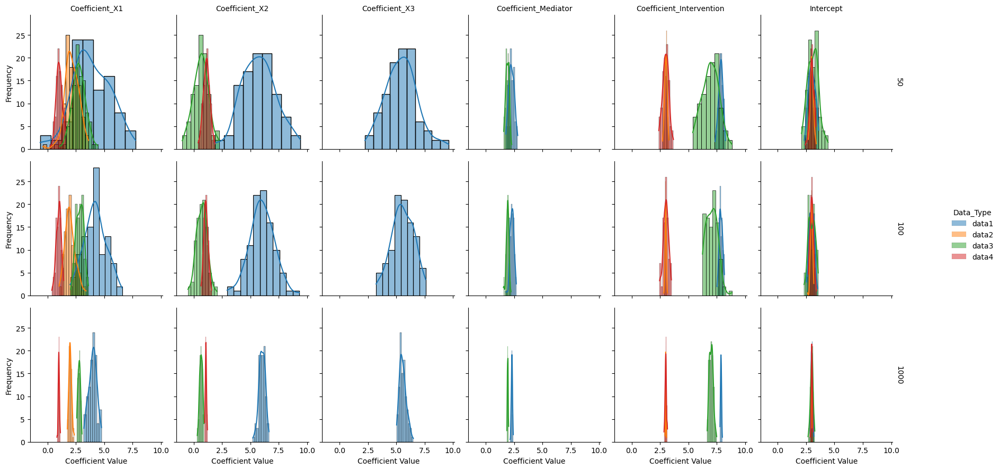

In [ ]:
import seaborn as sns

# Melt the DataFrame
coefficients_columns = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 
                        'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept']

melted_df = results_df_DoWhy.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create FacetGrid using the 'Sample_Size' as rows and 'Data_Type' as columns
g = sns.FacetGrid(melted_df, row="Sample_Size", col="Coefficient", hue="Data_Type", margin_titles=True)
g.map_dataframe(sns.histplot, x="Value", kde=True)  # Using kde=True to add a density plot
g.set_axis_labels("Coefficient Value", "Frequency")
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.add_legend()
g.tight_layout()
plt.show()


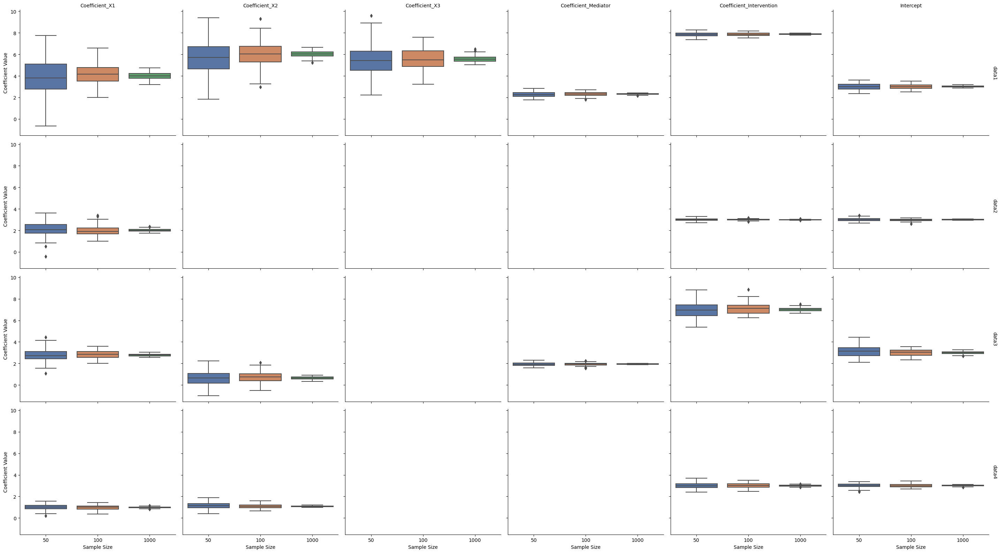

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


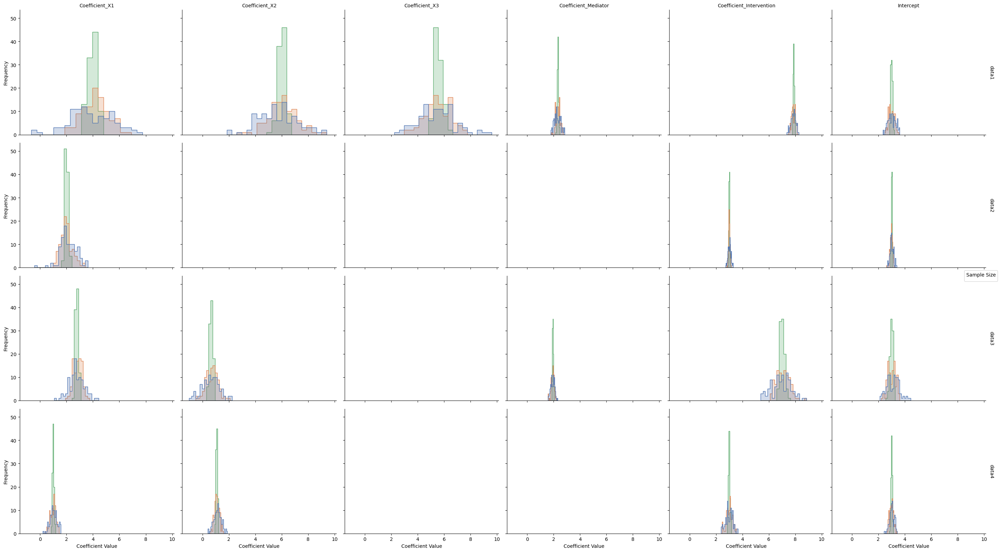

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame to have a 'Coefficient' column
melted_df = results_df_DoWhy.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create the FacetGrid using 'Data_Type' for rows and 'Coefficient' for columns
g = sns.FacetGrid(melted_df, row="Data_Type", col="Coefficient", margin_titles=True, height=4, aspect=1.2)
g.map_dataframe(sns.boxplot, y="Value", x="Sample_Size", palette="deep")
g.set_axis_labels("Sample Size", "Coefficient Value")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
#g.add_legend(title="Sample Size")
g.tight_layout()
plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

# List of coefficient columns for the melt function
coefficients_columns = [
    'Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 
    'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept'
]

# Melt the DataFrame to have a 'Coefficient' column
melted_df = results_df_DoWhy.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create the FacetGrid using 'Data_Type' for rows and 'Coefficient' for columns
g = sns.FacetGrid(melted_df, row="Data_Type", col="Coefficient", margin_titles=True, height=4, aspect=1.2)
g.map_dataframe(sns.histplot, x="Value", hue="Sample_Size", element="step", common_norm=False, palette="deep", bins=20)
g.set_axis_labels("Coefficient Value", "Frequency")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Add the legend manually
handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, loc='center right', title="Sample Size")

g.tight_layout()
plt.show()

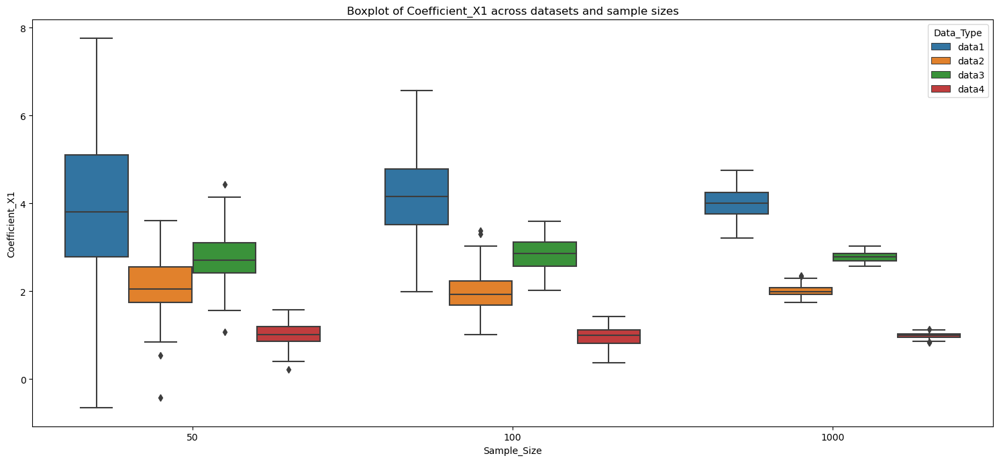

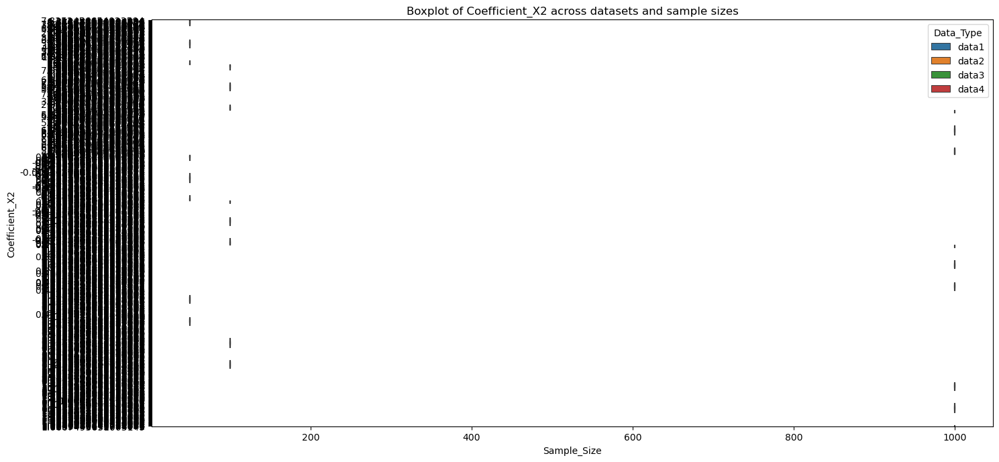

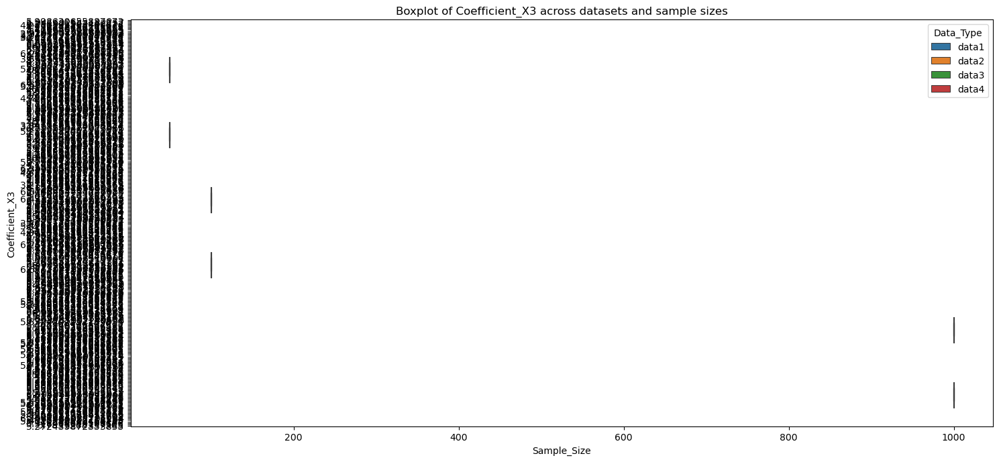

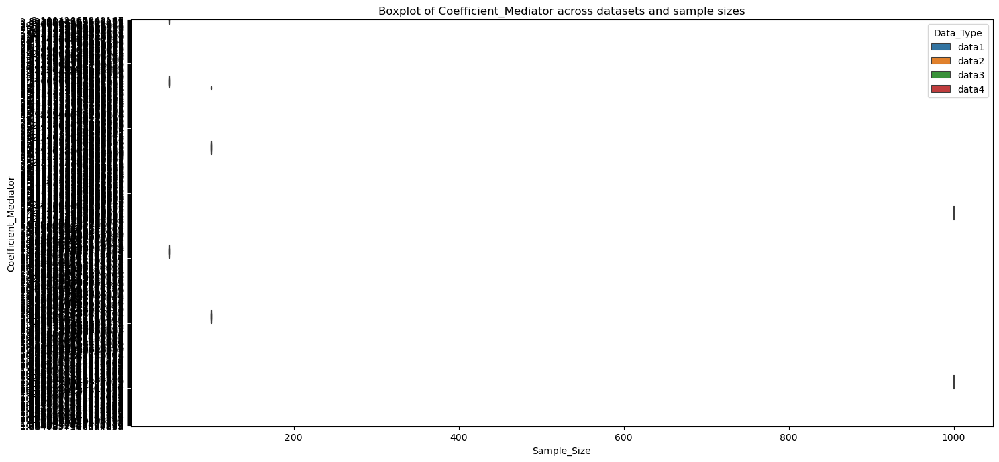

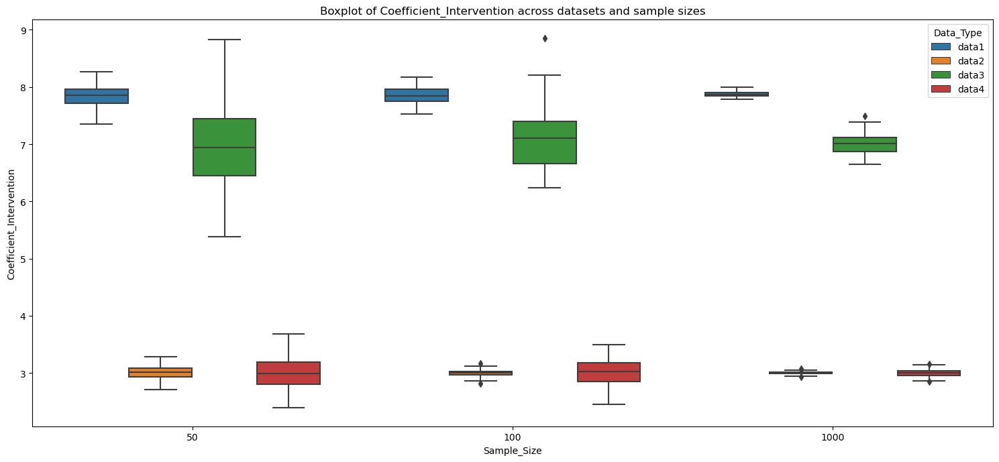

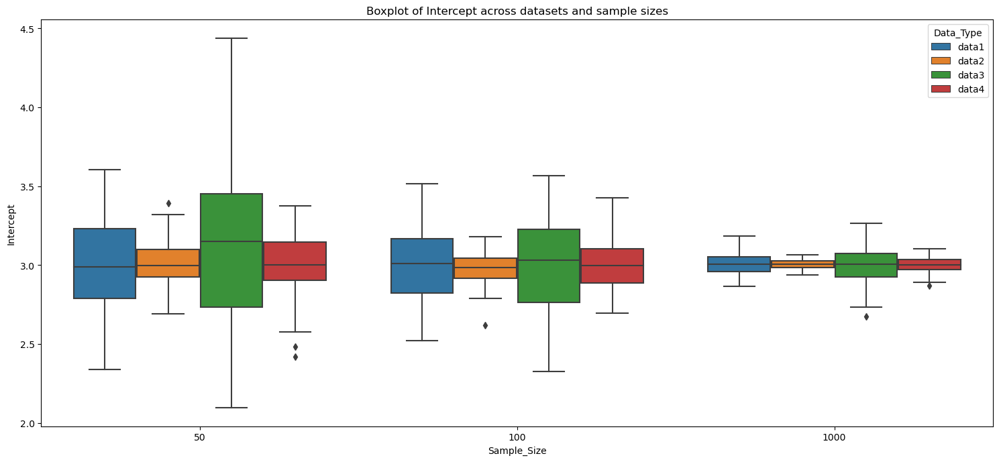

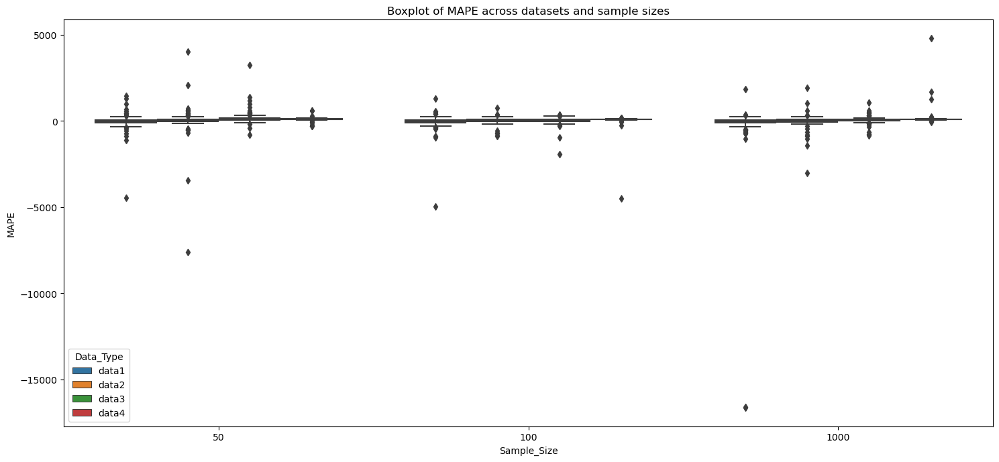

In [ ]:
for coef in coefficients:
    plt.figure(figsize=(15, 7))
    sns.boxplot(data=results_df_DoWhy, x="Sample_Size", y=coef, hue="Data_Type")
    plt.title(f"Boxplot of {coef} across datasets and sample sizes")
    plt.tight_layout()
    plt.show()

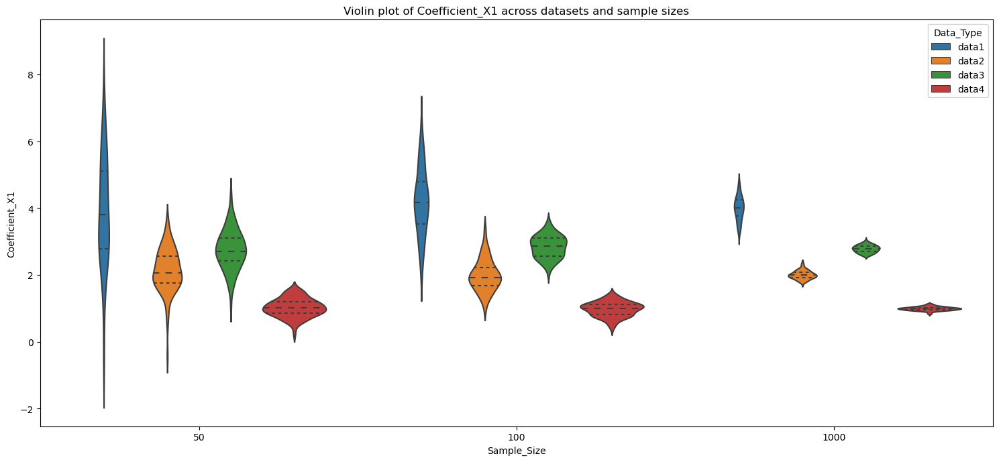

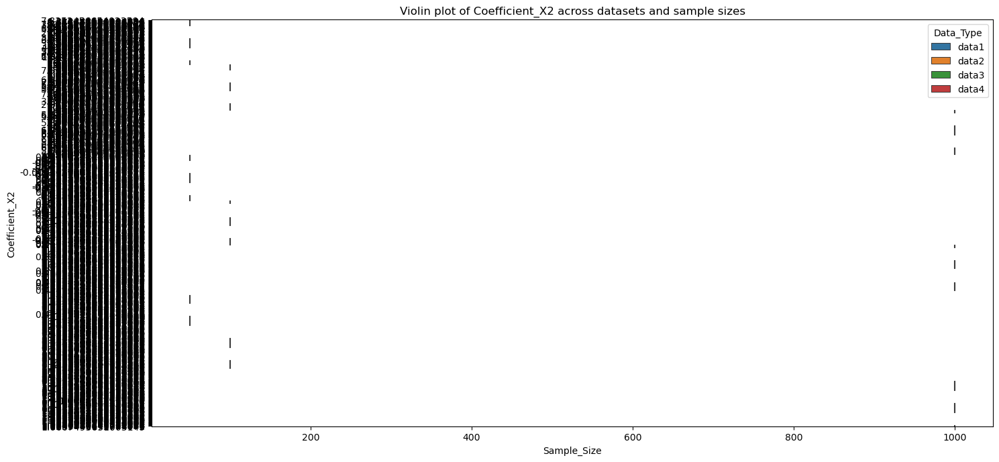

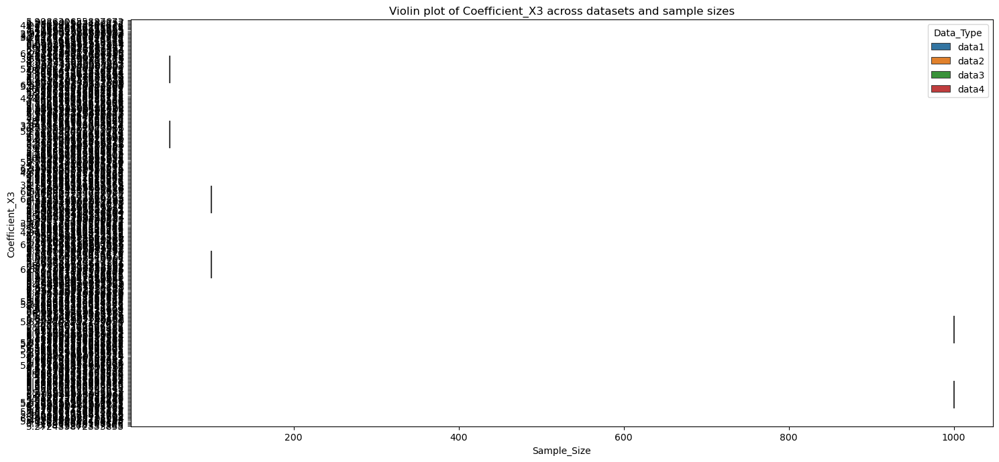

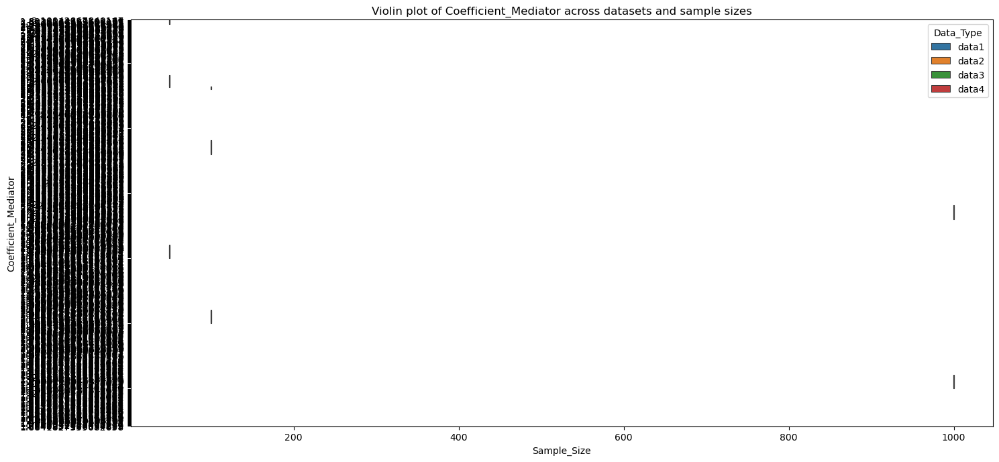

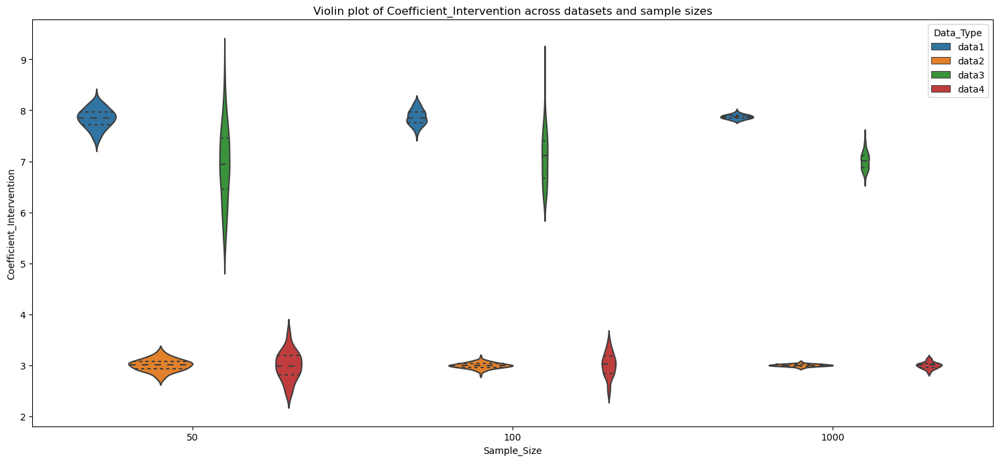

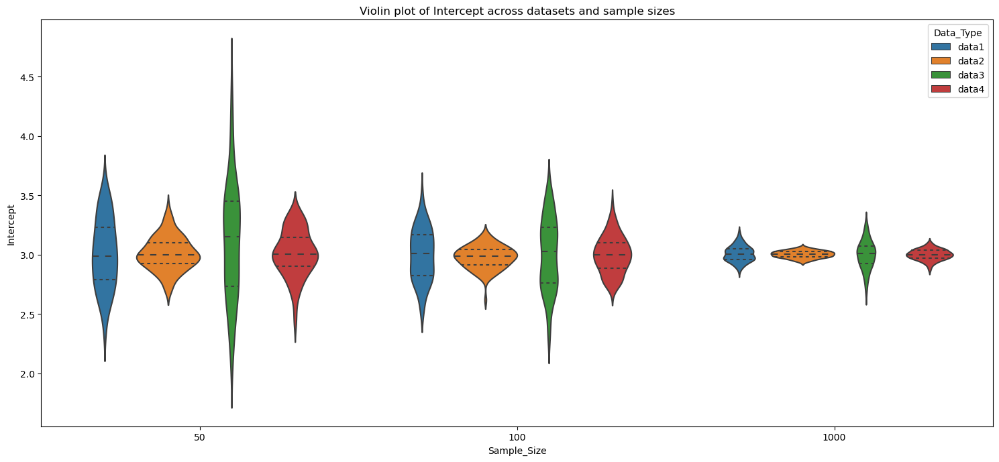

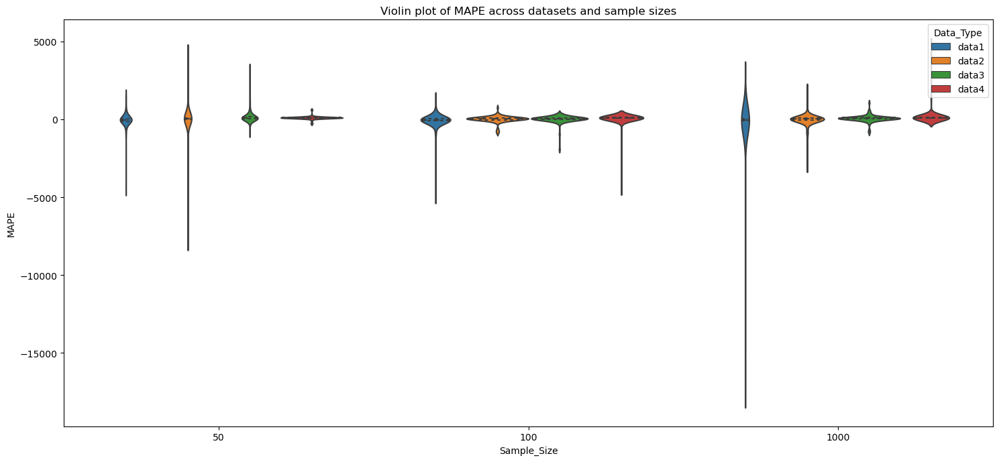

In [ ]:
for coef in coefficients:
    plt.figure(figsize=(15, 7))
    sns.violinplot(data=results_df_DoWhy, x="Sample_Size", y=coef, hue="Data_Type", inner="quartile")
    plt.title(f"Violin plot of {coef} across datasets and sample sizes")
    plt.tight_layout()
    plt.show()


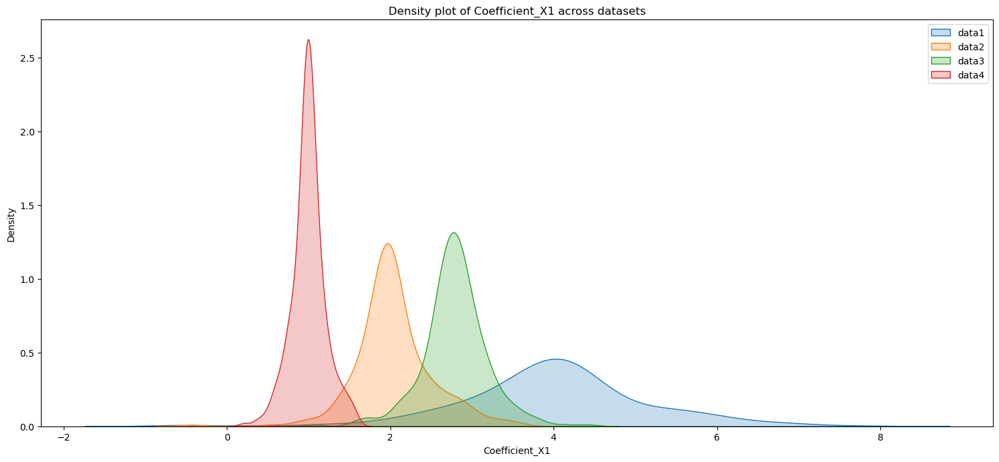

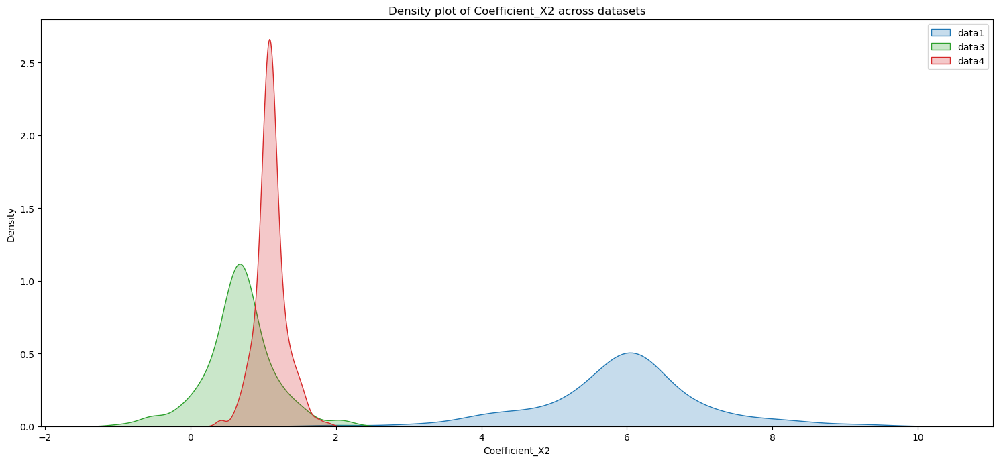

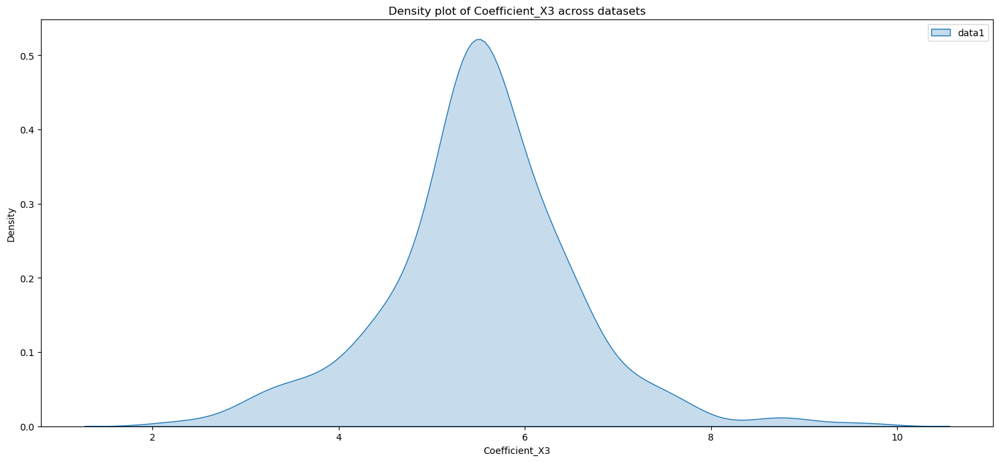

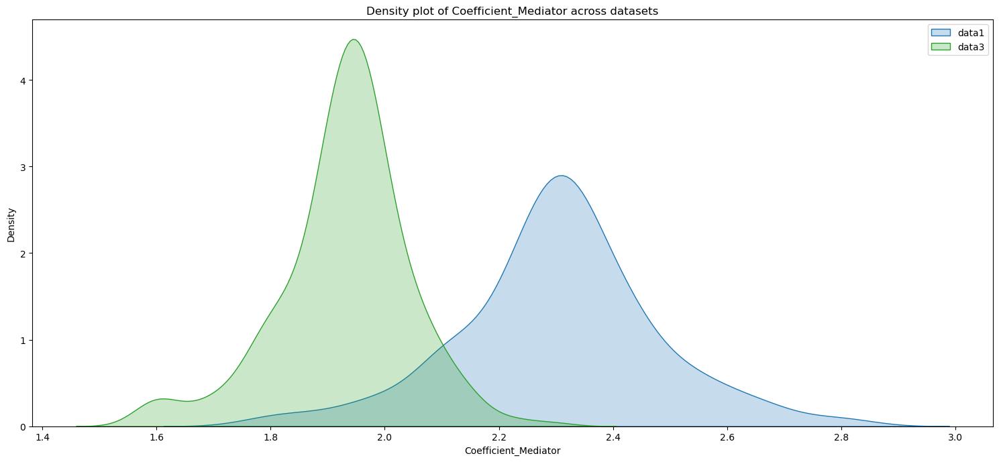

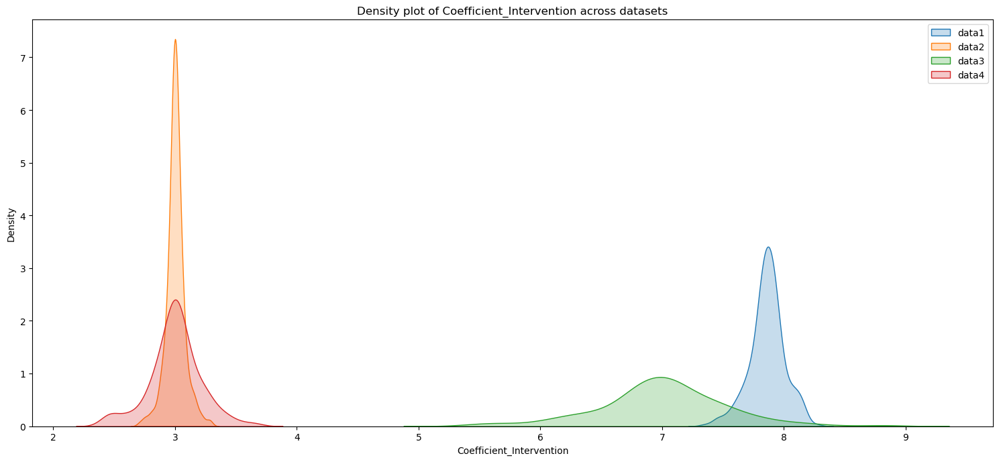

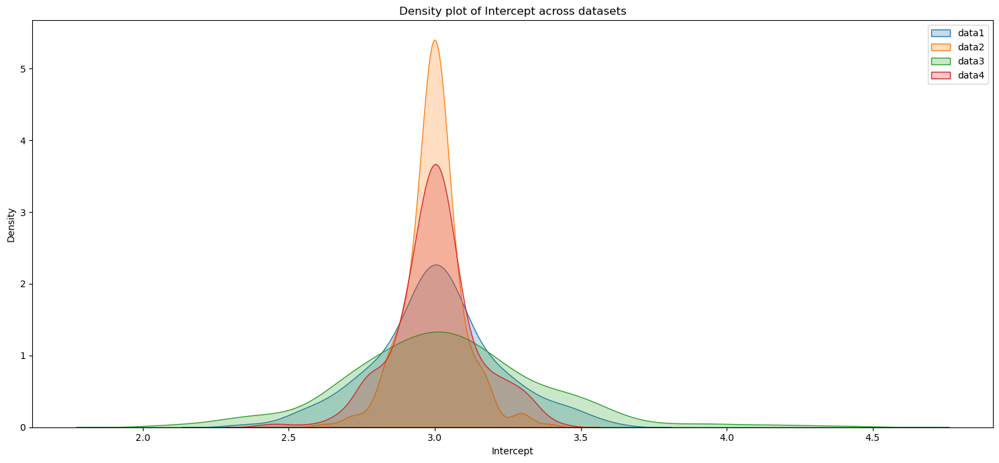

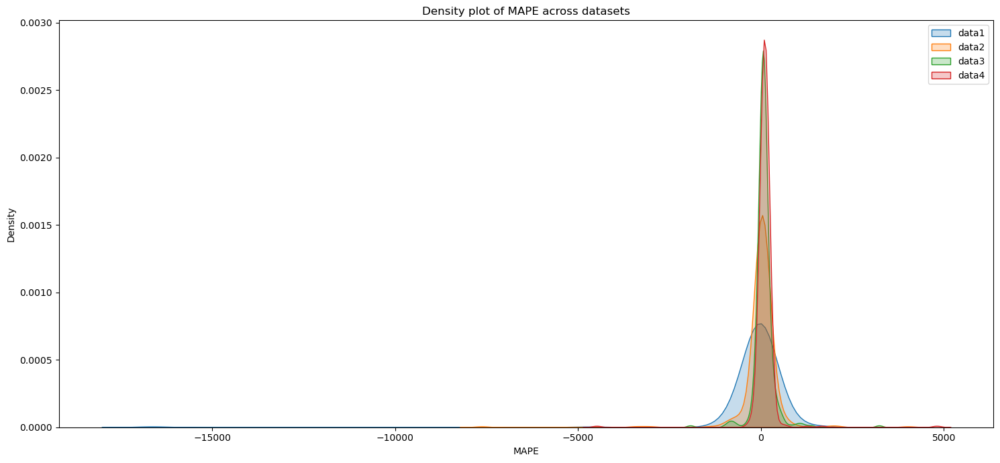

In [ ]:
for coef in coefficients:
    plt.figure(figsize=(15, 7))
    for data_type in results_df_DoWhy['Data_Type'].unique():
        subset = results_df_DoWhy[results_df_DoWhy['Data_Type'] == data_type]
        sns.kdeplot(data=subset, x=coef, label=data_type, fill=True)
    plt.title(f"Density plot of {coef} across datasets")
    plt.legend()
    plt.tight_layout()
    plt.show()


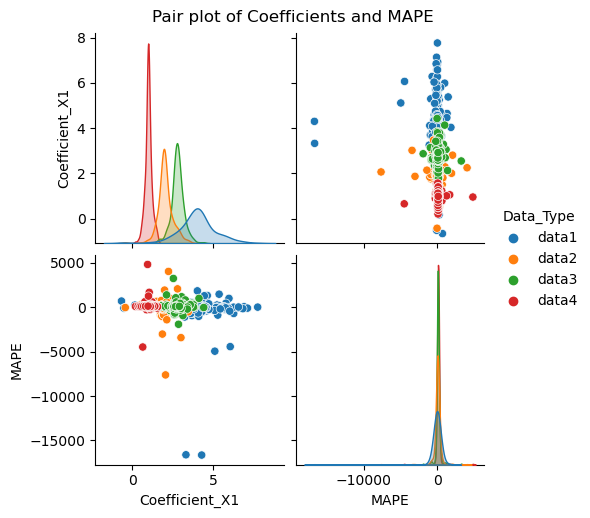

In [ ]:
# Selecting subset of columns for simplicity in visualizing
cols_to_include = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 'MAPE', 'Data_Type']
sns.pairplot(results_df_DoWhy[cols_to_include], hue="Data_Type")
plt.suptitle('Pair plot of Coefficients and MAPE', y=1.02)
plt.show()


### With Noise (the graph by changing arrow at random)

In [20]:
import random

def add_noise_to_graph(graph_string, available_nodes):
    # Remove the outer "digraph {" and "}" structure and split by semicolon
    core_lines = graph_string.strip().split("{")[1].split("}")[0].split(";")
    new_lines = []
    
    used_nodes = set()  # To track nodes we've already used
    directed_edges = set()  # To track directed edges
    
    for line in core_lines:
        line = line.strip()  # remove unnecessary whitespace
        
        if not line:
            continue  # Skip empty lines

        nodes = [node.strip() for node in line.split('->')]
        directed_edges.add(tuple(nodes))  # add the edge to our set
        
        # Try to reverse the link with 10% chance, but only if 'Outcome' is not at the start or end
        if random.random() < 0.1 and nodes[0] != 'Outcome' and nodes[1] != 'Outcome':
            new_edge = tuple(nodes[::-1])
            if not causes_cycle(directed_edges, new_edge):  # Check if reversing causes a cycle
                directed_edges.remove(tuple(nodes))
                directed_edges.add(new_edge)
                line = ' -> '.join(nodes[::-1])
        elif nodes[1] == 'Outcome':
            # Choose a new start node that hasn't been used yet and isn't the current node
            available_starts = [node for node in available_nodes if node not in used_nodes and node != nodes[0] and node != 'Outcome']
            if available_starts:
                new_start = random.choice(available_starts)
                directed_edges.remove(tuple(nodes))
                directed_edges.add((new_start, nodes[1]))
                line = new_start + ' -> ' + nodes[1]
                used_nodes.add(new_start)
        else:
            line = ' -> '.join(nodes)
            
        new_lines.append(line + ";")  # Add the modified or original line with semicolon to new_lines

    return "digraph {\n" + "\n".join(new_lines) + "\n}"

def causes_cycle(edges, new_edge):
    """
    Uses DFS to determine if adding a new edge will cause a cycle.
    """
    graph = {}
    for edge in edges:
        if edge[0] not in graph:
            graph[edge[0]] = []
        graph[edge[0]].append(edge[1])
    
    if new_edge[0] not in graph:
        graph[new_edge[0]] = []
    graph[new_edge[0]].append(new_edge[1])

    visited = set()
    stack = [new_edge[0]]

    while stack:
        vertex = stack.pop()
        if vertex == new_edge[1]:  # We found a cycle
            return True
        if vertex not in visited:
            visited.add(vertex)
            stack.extend(set(graph.get(vertex, [])) - visited)

    return False

# Total Effect - with graphs
import pandas as pd

# Number of iterations to obtain 100 sets of coefficients
num_iterations = 100

# Datasets
data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]

available_nodes_list = ['X1', 'X2', 'X3', 'Intervention', 'Mediator']


results_df_DoWhy_TEGN = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

def calculate_mape(data, coeff_dict, data_type, Intercept):
    """
    Calculate the Mean Absolute Percentage Error.
    """
    # Use coefficients passed to the function
    Coefficient_Intervention = coeff_dict['Coefficient_Intervention']
    
    X_test = data.drop('Outcome', axis=1)
    Y_test = data['Outcome']
    
    # Extract treatments from data
    T = X_test["Intervention"]


    # Calculate predictions based on data type
    if data_type == "data1": 
        predictions = Intercept +  Coefficient_Intervention * T 
    elif data_type == "data2":
        predictions = Intercept  + Coefficient_Intervention * T 
    elif data_type == "data3":
        predictions = Intercept + Coefficient_Intervention * T 
    elif data_type == "data4":
        predictions = Intercept + Coefficient_Intervention * T 
    else:
        raise ValueError("Unknown data type")
    
    rmse = np.sqrt(np.mean(np.square((Y_test - predictions))))
    
    ape = np.abs((Y_test - predictions) / (Y_test))
    mape = np.mean(ape)*100

    return rmse, mape


def estimate_effect_for_treatment(data_type, data, treatment, graph):
    
    if data_type == "data1": 
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1', 'X2', 'X3'], graph=graph)
    elif data_type == "data2":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1'], instruments=['X2','X3'], graph=graph)
    elif data_type == "data3":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1', 'X2'], graph=graph)
    elif data_type == "data4":
        model = CausalModel(data=data, treatment=treatment, outcome='Outcome', common_causes=['X1', 'X2'], instruments=['X3'], graph=graph)
    else:
        raise ValueError("Unknown data type")
    
    identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
    estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
    
    intercept = getattr(estimate, 'intercept', 0)

    
    return estimate.value, intercept

# Run the estimation multiple times for each data type
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
            # Generate synthetic data based on the current sample size         
            total_samples = sample_size + 1000  # Including training and testing
            data = generate_data(data_type, total_samples)
            
            # Shuffle and split the data
            shuffled_data = data.sample(frac=1, random_state=None)
            train_data = shuffled_data.iloc[:sample_size]
            test_data = shuffled_data.iloc[sample_size:]

            # Define the causal graph based on data type
            graphs = {
                'data1': """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        Intervention-> Mediator;
                        X2->Mediator
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                    """, 
                'data2' : """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        X1->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                'data3' : """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        X3->Outcome;
                        X2->Mediator;
                        X1->Mediator;
                        Intervention->Mediator;
                        Mediator->Outcome;
                        Intervention->Outcome;
                    }
                    """,
                       
                'data4': """
                    digraph {
                        X1->Intervention;
                        X2->Intervention;
                        X3->Intervention;
                        X1->Outcome;
                        X2->Outcome;
                        Intervention->Outcome;                        
                    }"""
            }
            causal_graph = add_noise_to_graph(graphs[data_type], available_nodes_list)
            
            # Define which treatments to estimate for each data type
            treatments_to_estimate = {
                'data1': ['X1', 'X2', 'X3', 'Mediator', 'Intervention'],
                'data2': ['X1', 'Intervention'],
                'data3': ['X1', 'X2', 'X3',  'Mediator', 'Intervention'],
                'data4': ['X1', 'X2', 'Intervention'],
            }
            
            coefficients = []
            intercept = None
            mape_values = {}  # Dictionary to hold MAPE values for each treatment
            
            for treatment in treatments_to_estimate[data_type]:
                coef, intercept = estimate_effect_for_treatment(data_type, train_data, treatment, causal_graph)
                coefficients.append(coef)
                
            # Create a dictionary to hold placeholder coefficients
            coeff_dict = {
                'Coefficient_X1': None,
                'Coefficient_X2': None,
                'Coefficient_X3': None,
                'Coefficient_Mediator': None,
                'Coefficient_Intervention': None
            }

            # For each treatment in the current data type, update the coefficient in the dictionary
            for idx, treatment in enumerate(treatments_to_estimate[data_type]):
                coeff_dict[f'Coefficient_{treatment}'] = coefficients[idx]
            
            rmse, mape = calculate_mape(test_data, coeff_dict, data_type, intercept)
            

            # Append to results dataframe
            results_df_DoWhy_TEGN = results_df_DoWhy_TEGN.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                **coeff_dict,
                'Intercept': intercept,
                'MAPE': mape,
                'RMSE': rmse
            }, ignore_index=True)

        
# Printing the results
results_df_DoWhy_TEGN

/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/2663934702.py:242: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEGN = results_df_DoWhy_TEGN.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/2663934702.py:242: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEGN = results_df_DoWhy_TEGN.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/2663934702.py:242: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df_DoWhy_TEGN = results_df_DoWhy_TEGN.append({
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/2663934702.py:242: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,NaN,6.932412,6.616351,1.957306,7.137547,3.333395,296.432394,2.399025
1,data1,50,2,4.42302,1.629832,3.891509,2.510171,6.657167,2.745813,93.924691,2.736913
2,data1,50,3,None,6.509206,7.456315,1.510234,7.262185,3.006281,201.402546,2.311211
3,data1,50,4,None,9.46531,6.133517,0.0,7.407418,3.049624,151.931493,2.253975
4,data1,50,5,None,4.133417,3.946385,2.555082,6.687044,3.038229,128.206110,2.667322
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,1.03906,1.12412,None,None,2.911728,3.011758,71.727428,1.316035
1196,data4,1000,97,0,1.060728,None,None,0.000000,0.000000,100.000000,4.920726
1197,data4,1000,98,1.098577,0,None,None,0.000000,0.000000,100.000000,4.904318
1198,data4,1000,99,1.095176,0,None,None,0.000000,0.000000,100.000000,4.851975


In [21]:
# Convert None values to NaN for correct aggregation
results_df_DoWhy_TEGN = results_df_DoWhy_TEGN.where(pd.notna(results_df_DoWhy_TEGN), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_DoWhy_TEGN = results_df_DoWhy_TEGN.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_DoWhy_TEGN


,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,NaN,6.248534,5.677682,1.672238,7.088749,2.958702,109.619568,2.411706
1,data1,100,50.5,NaN,5.899916,5.737540,1.489376,7.065379,2.992361,154.594502,2.421633
2,data1,1000,50.5,NaN,6.000002,5.611545,1.655352,7.049098,3.003064,191.153811,2.417655
3,data2,50,50.5,1.030264,NaN,NaN,NaN,0.996105,0.976856,115.717754,4.122488
4,data2,100,50.5,0.833216,NaN,NaN,NaN,0.585265,0.569411,104.279102,4.699163
5,data2,1000,50.5,1.065946,NaN,NaN,NaN,0.807026,0.778152,115.018138,4.389843
6,data3,50,50.5,2.774928,0.688031,0.729947,1.978897,6.980667,3.003921,269.420460,2.899542
7,data3,100,50.5,2.742994,0.686050,0.626262,1.985638,6.985372,2.958914,257.369686,2.868080
8,data3,1000,50.5,2.783096,0.654839,0.706900,2.000340,6.997600,2.991583,287.428819,2.846820
9,data4,50,50.5,0.924435,0.885812,NaN,NaN,1.813727,1.421819,90.095078,3.054014


#### viz

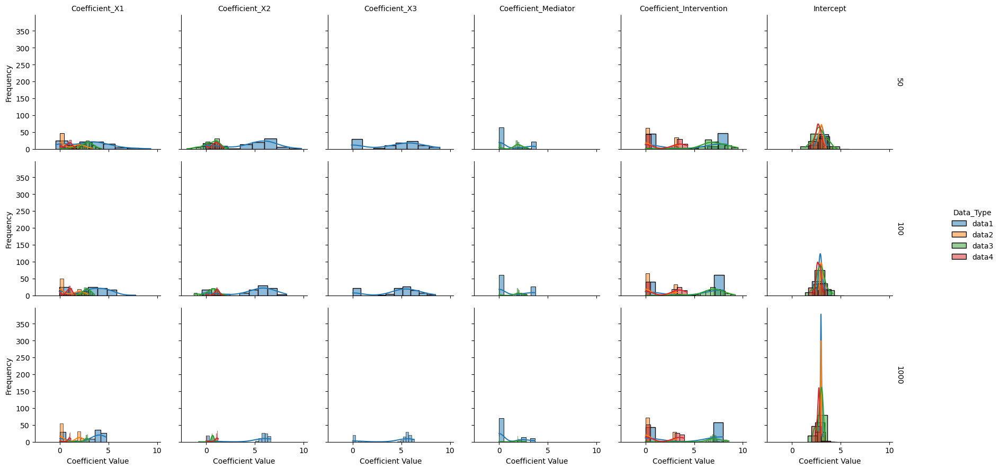

In [ ]:
import seaborn as sns

# Melt the DataFrame
coefficients_columns = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 
                        'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept']

melted_df = results_df_DoWhy_TEGN.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create FacetGrid using the 'Sample_Size' as rows and 'Data_Type' as columns
g = sns.FacetGrid(melted_df, row="Sample_Size", col="Coefficient", hue="Data_Type", margin_titles=True)
g.map_dataframe(sns.histplot, x="Value", kde=True)  # Using kde=True to add a density plot
g.set_axis_labels("Coefficient Value", "Frequency")
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.add_legend()
g.tight_layout()
plt.show()



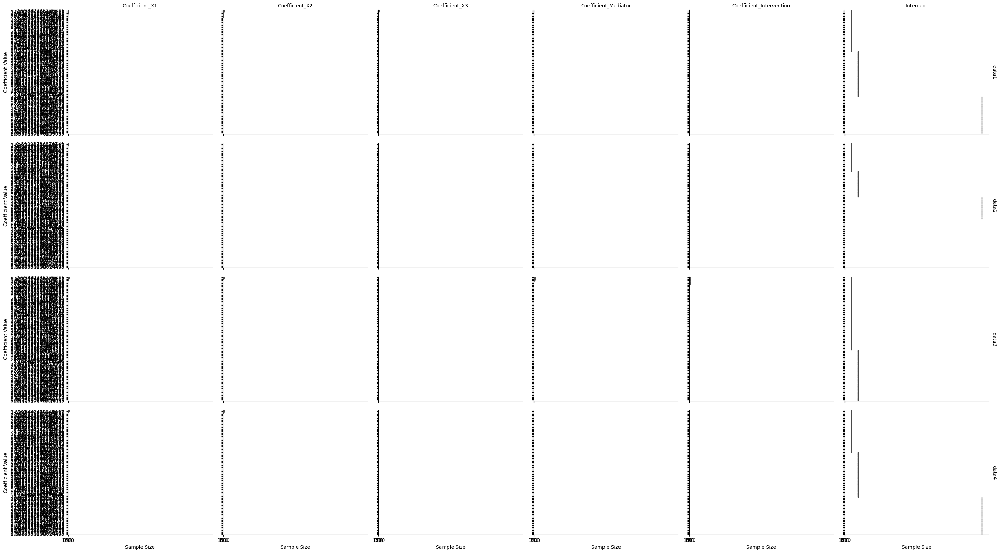

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame to have a 'Coefficient' column
melted_df = results_df_noise.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create the FacetGrid using 'Data_Type' for rows and 'Coefficient' for columns
g = sns.FacetGrid(melted_df, row="Data_Type", col="Coefficient", margin_titles=True, height=4, aspect=1.2)
g.map_dataframe(sns.boxplot, y="Value", x="Sample_Size", palette="deep")
g.set_axis_labels("Sample Size", "Coefficient Value")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
#g.add_legend(title="Sample Size")
g.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


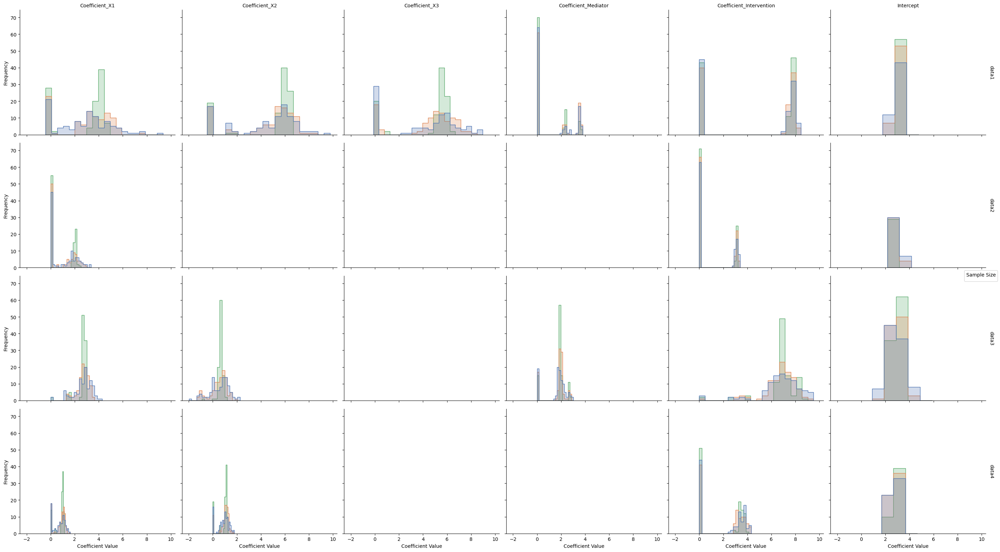

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt

# List of coefficient columns for the melt function
coefficients_columns = [
    'Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 
    'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept'
]

# Melt the DataFrame to have a 'Coefficient' column
melted_df = results_df_noise.melt(id_vars=['Data_Type', 'Sample_Size', 'Iteration', 'MAPE'], 
                                value_vars=coefficients_columns, 
                                var_name='Coefficient', value_name='Value')

# Create the FacetGrid using 'Data_Type' for rows and 'Coefficient' for columns
g = sns.FacetGrid(melted_df, row="Data_Type", col="Coefficient", margin_titles=True, height=4, aspect=1.2)
g.map_dataframe(sns.histplot, x="Value", hue="Sample_Size", element="step", common_norm=False, palette="deep", bins=20)
g.set_axis_labels("Coefficient Value", "Frequency")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Add the legend manually
handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, loc='center right', title="Sample Size")

g.tight_layout()
plt.show()

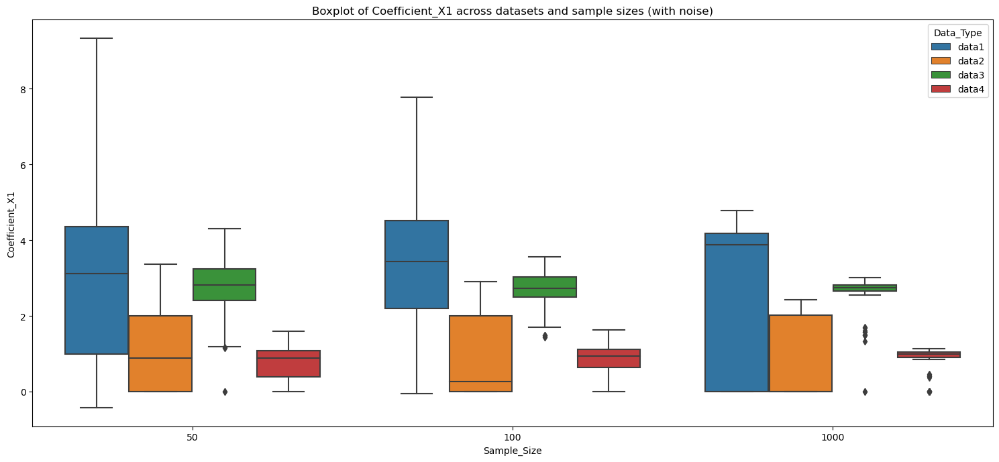

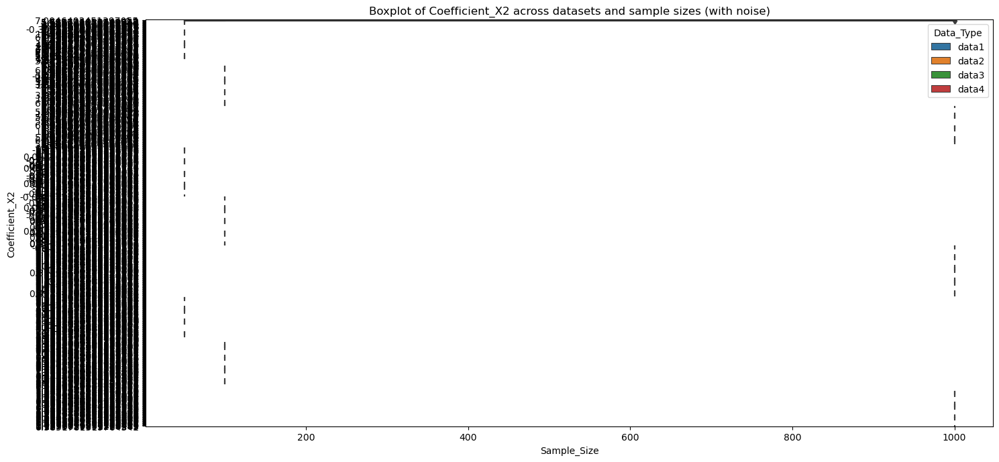

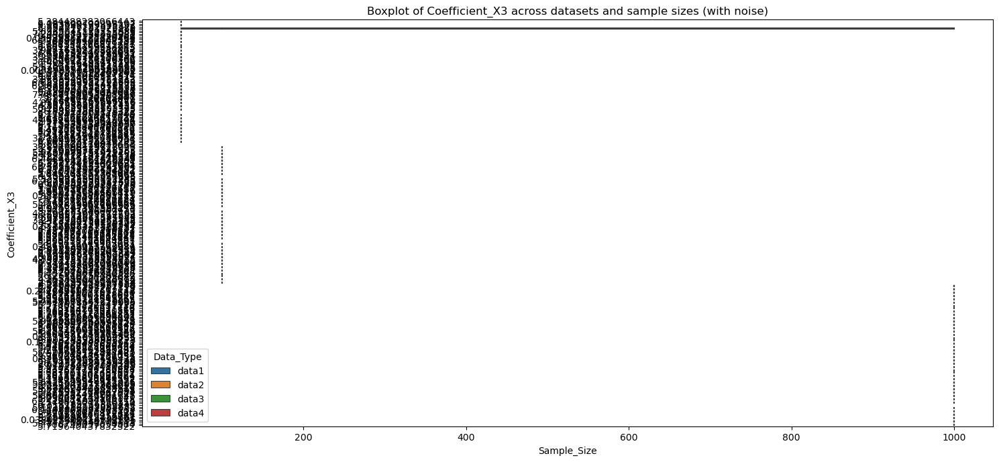

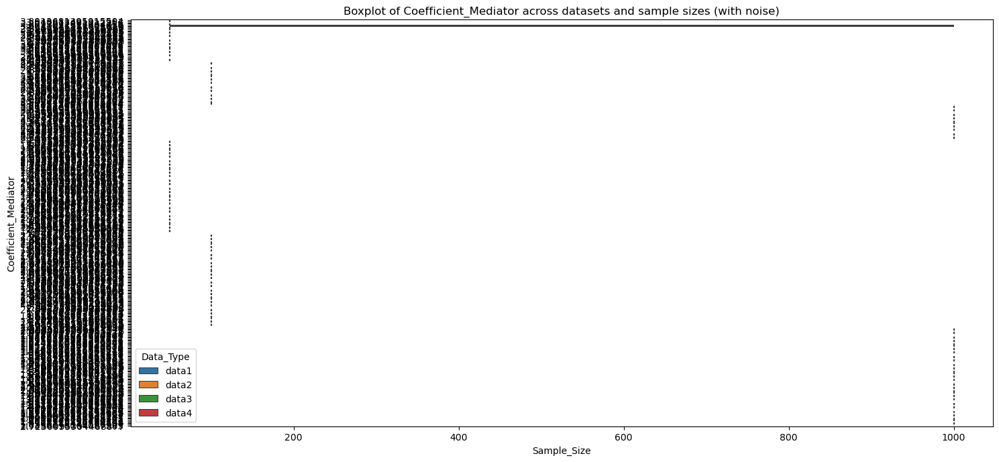

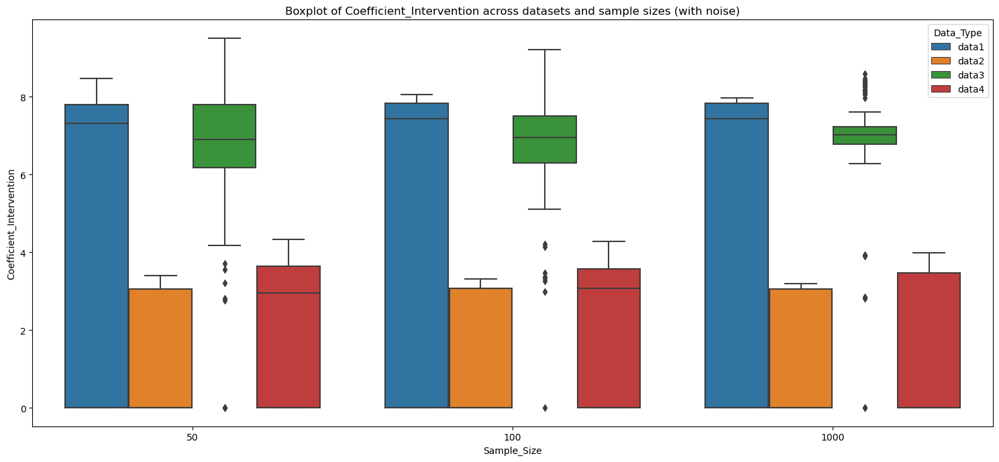

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

coefficients_with_noise = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention']

for coef in coefficients_with_noise:
    plt.figure(figsize=(15, 7))
    sns.boxplot(data=results_df_noise, x="Sample_Size", y=coef, hue="Data_Type")
    plt.title(f"Boxplot of {coef} across datasets and sample sizes (with noise)")
    plt.tight_layout()
    plt.show()


### CausalNex

In [50]:
import pandas as pd
import numpy as np
from causalnex.structure import StructureModel
from causalnex.structure.notears import from_pandas
from causalnex.network import BayesianNetwork
from causalnex.discretiser import Discretiser
from causalnex.evaluation import classification_report, roc_auc
from causalnex.inference import InferenceEngine
import networkx as nx

# The different configurations
data_types = ["data1", "data2", "data3", "data4"]
sample_sizes = [50, 100, 1000]

results_df_BNCN = pd.DataFrame(columns=[
    'Data_Type', 'Sample_Size', 'Iteration', 'Coefficient_X1', 'Coefficient_X2', 
    'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 
    'Intercept', 'MAPE', 'RMSE'
])

num_iterations = 100

def make_acyclic(sm):
    """Modify the StructureModel to remove cycles."""
    while not nx.is_directed_acyclic_graph(sm):
        try:
            cycle = nx.find_cycle(sm, orientation='original')
            sm.remove_edge(cycle[0][0], cycle[0][1])
        except:
            break
    return sm

from sklearn.metrics import mean_squared_error

def mape(y_true, y_pred):
    """Compute Mean Absolute Percentage Error"""
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def rmse(y_true, y_pred):
    """Compute Root Mean Squared Error"""
    return np.sqrt(mean_squared_error(y_true, y_pred))


# Loop over configurations
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
        
            # Generate data
            full_data = generate_data(data_type, sample_size + 1000)
            train_data = full_data.iloc[:sample_size]  # Training data
            test_data = full_data.iloc[sample_size:]  # Test data

            # Learn structure using NOTEARS algorithm
            sm = from_pandas(train_data)
            
            sm = make_acyclic(sm)

            if sm.has_edge('Mediator', 'Intervention'):
                sm.remove_edge('Mediator', 'Intervention')

            if nx.is_directed_acyclic_graph(sm):
                bn = BayesianNetwork(sm)
            else:
                raise ValueError("The modified structure still has cycles.")

            # Discretise the continuous features for training data
            for col in ["Intervention", "Mediator", "X1", "X2", "X3", "Outcome"]:
                if col in train_data.columns:  # Check if column exists in train_data
                    train_data[col] = Discretiser(method="fixed", numeric_split_points=[0]).transform(train_data[col].values)


            # Train the Bayesian Network
            bn = bn.fit_node_states(train_data)
            bn = bn.fit_cpds(train_data, method="BayesianEstimator", bayes_prior="K2")

            # Discretise the continuous features for test data
            for col in ["Intervention", "Mediator", "X1", "X2", "X3", "Outcome"]:
                if col in test_data.columns:  # Check if column exists in test_data
                    test_data[col] = Discretiser(method="fixed", numeric_split_points=[0]).transform(test_data[col].values)


            predicted = []

            for idx, row in test_data.iterrows():
                ie = InferenceEngine(bn)  # Create a new instance of InferenceEngine for each row
                evidence = row.drop("Outcome").to_dict()
                predicted_prob = ie.query(observations=evidence)["Outcome"]

                predicted_class = max(predicted_prob, key=predicted_prob.get)  
                predicted.append(predicted_class)

            # Calculate the metrics outside the prediction loop
            mape_value = mape(test_data['Outcome'].values, predicted)
            rmse_value = rmse(test_data['Outcome'].values, predicted)

            results_df_BNCN = results_df_BNCN.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i + 1,
                # 'Intercept': intercept,  # Comment/remove if not relevant
                'MAPE': mape_value,
                'RMSE': rmse_value
            }, ignore_index=True)


results_df_BNCN


/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/3886172443.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data[col] = Discretiser(method="fixed", numeric_split_points=[0]).transform(train_data[col].values)
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn/T/ipykernel_3496/3886172443.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data[col] = Discretiser(method="fixed", numeric_split_points=[0]).transform(test_data[col].values)
/var/folders/0x/n51_7s_n09dfndljqk4rv2zr0000gn

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.324037
1,data1,50,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.286356
2,data1,50,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.284605
3,data1,50,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.303315
4,data1,50,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.324037
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.151658
1196,data4,1000,97,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.118322
1197,data4,1000,98,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.089443
1198,data4,1000,99,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.083666


In [61]:
def mape(y_true, y_pred):
    """Compute Mean Absolute Percentage Error"""
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def get_coefficients(bn, node):
    """
    Extract CPD for the node. This is not equivalent to regression coefficients,
    but it gives you the conditional probability distribution of the node given its parents.
    """
    try:
        return bn.get_cpds(node)
    except:
        return None


# Remaining part of the loop
for data_type in data_types:
    for sample_size in sample_sizes:
        for i in range(num_iterations):
            # Generate data
            full_data = generate_data(data_type, sample_size + 1000)
            train_data = full_data.iloc[:sample_size]  # Training data
            test_data = full_data.iloc[sample_size:]  # Test data

            # Fit the Bayesian Network
            bn = BayesianNetwork(sm)
            bn = bn.fit_node_states(train_data)
            bn = bn.fit_cpds(train_data, method="BayesianEstimator", bayes_prior="K2")
            
            # Extract coefficients (CPDs)
            coeffs = {}
            for col in ["Intervention", "Mediator", "X1", "X2", "X3", "Outcome"]:
                if col in train_data.columns:
                    coeffs[col] = get_coefficients(bn, col)

            
            # Predict on test data
            predictions = bn.predict(test_data.drop(columns=["Outcome"]), "Outcome")
            
            if isinstance(predictions, pd.DataFrame) and predictions.shape[1] == 1:
                predictions = predictions.iloc[:, 0].values

            # Calculate MAPE and RMSE
            true_values = test_data["Outcome"].values
            MAPE_val = mape(true_values, predictions)
            RMSE_val = rmse(true_values, predictions)

            # Store results
            results_df_BNCN = results_df_BNCN.append({
                'Data_Type': data_type,
                'Sample_Size': sample_size,
                'Iteration': i,
                # For coefficients, you might want to convert the CPD data structure into something meaningful
                'Coefficient_X1': coeffs.get("X1"),
                'Coefficient_X2': coeffs.get("X2"),
                'Coefficient_X3': coeffs.get("X3"),
                'Coefficient_Mediator': coeffs.get("Mediator"),
                'Coefficient_Intervention': coeffs.get("Intervention"),
                'Intercept': None,  # Bayesian networks don't have an intercept like linear models
                'MAPE': MAPE_val,
                'RMSE': RMSE_val
            }, ignore_index=True)


/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/causalnex/network/network.py:379: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(self._node_states[col])
/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/causalnex/network/network.py:379: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(self._node_states[col])
/Users/jeongdahye/opt/anaconda3/lib/python3.8/site-packages/causalnex/network/network.py:379: SettingWithCopyWarning: 
A value is trying to 

KeyboardInterrupt: 

In [51]:
results_df_BNCN

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.324037
1,data1,50,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.286356
2,data1,50,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.284605
3,data1,50,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.303315
4,data1,50,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.324037
...,...,...,...,...,...,...,...,...,...,...,...
1195,data4,1000,96,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.151658
1196,data4,1000,97,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.118322
1197,data4,1000,98,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.089443
1198,data4,1000,99,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.083666


In [60]:
print(true_values.shape)
print(predictions.shape)


(1000,)
(1000, 1)


In [52]:
# Convert None values to NaN for correct aggregation
results_df_BNCN = results_df_BNCN.where(pd.notna(results_df_BNCN), np.nan)

# Custom aggregation function
def custom_mean(series):
    return np.nan if series.isna().any() else series.mean()

# Group by 'Data_Type' and 'Sample_Size' and calculate custom mean for other columns
averaged_df_BNCN = results_df_BNCN.groupby(['Data_Type', 'Sample_Size']).agg(custom_mean).reset_index()

averaged_df_BNCN


,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE
0,data1,50,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.334205
1,data1,100,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.290930
2,data1,1000,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.268106
3,data2,50,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.468476
4,data2,100,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.456666
5,data2,1000,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.435947
6,data3,50,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.302486
7,data3,100,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.296269
8,data3,1000,50.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.294226
9,data4,50,50.5,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.089767


## Comparison

In [23]:
results_df_iv['method'] = 'IV OLS'
results_df_ols['method'] = 'OLS'

results_df_DoWhy_TEG['method'] = 'DoWhy Graph'
results_df_DoWhy_TEG_CC['method'] = 'DoWhy Graph & CC'

results_df_DoWhy_DE['method'] = 'DoWhy No Assumption'
results_df_DoWhy_DE_CC['method'] = 'DoWhy CC'

results_df_DoWhy_DEG['method'] = 'DoWhy Graph & CC'
results_df_DoWhy_TEGN['method'] = 'DoWhy Graph & Noise'


In [24]:
averaged_df_iv['method'] = 'IV OLS'
averaged_df_ols['method'] = 'OLS'

averaged_df_DoWhy_TEG['method'] = 'DoWhy Graph'
averaged_df_DoWhy_TEG_CC['method'] = 'DoWhy Graph & CC'

averaged_df_DoWhy_DE['method'] = 'DoWhy No Assumption'
averaged_df_DoWhy_DE_CC['method'] = 'DoWhy CC'

averaged_df_DoWhy_DEG['method'] = 'DoWhy Graph & CC'
averaged_df_DoWhy_TEGN['method'] = 'DoWhy Graph + Noise'


In [25]:
combined_df = pd.concat([results_df_ols, results_df_iv, results_df_DoWhy_DE, results_df_DoWhy_DE_CC, results_df_DoWhy_DEG, results_df_DoWhy_TEG, results_df_DoWhy_TEG_CC, results_df_DoWhy_TEGN], ignore_index=True)
combined_avg_df = pd.concat([averaged_df_ols, averaged_df_iv, averaged_df_DoWhy_DE, averaged_df_DoWhy_DE_CC, averaged_df_DoWhy_DEG, averaged_df_DoWhy_TEG, averaged_df_DoWhy_TEG_CC, averaged_df_DoWhy_TEGN], ignore_index=True)

In [55]:
combined_df

,Data_Type,Sample_Size,Iteration,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE,method,Hue
0,data1,50,1,0.277348,0.260634,0.724748,2.446021,2.151992,2.876137,34.110249,1.059350,OLS,OLS data1 50
1,data1,50,2,0.683625,0.72642,0.558751,1.915268,3.148206,3.126441,33.161998,1.036963,OLS,OLS data1 50
2,data1,50,3,0.611419,0.741334,0.727054,1.923454,3.294797,3.041809,74.589090,1.056034,OLS,OLS data1 50
3,data1,50,4,0.490677,0.822083,0.553448,1.804855,3.295971,2.924083,127.691684,1.040278,OLS,OLS data1 50
4,data1,50,5,0.686412,0.499063,0.739466,2.134615,2.618433,2.938644,128.501595,1.053224,OLS,OLS data1 50
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10795,data4,1000,96,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.151658,BNCN,NaN
10796,data4,1000,97,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.118322,BNCN,NaN
10797,data4,1000,98,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.089443,BNCN,NaN
10798,data4,1000,99,NaN,NaN,NaN,NaN,NaN,NaN,inf,0.083666,BNCN,NaN


In [27]:
combined_avg_df.head()

,Data_Type,Sample_Size,Coefficient_X1,Coefficient_X2,Coefficient_X3,Coefficient_Mediator,Coefficient_Intervention,Intercept,MAPE,RMSE,method,Iteration
0,data1,50,0.489933,0.561795,0.656800,2.024080,2.963961,3.016283,63.843360,1.064601,OLS,NaN
1,data1,100,0.504540,0.587710,0.714706,2.033103,2.925672,3.002154,67.946766,1.023208,OLS,NaN
2,data1,1000,0.494545,0.592793,0.701524,2.010227,2.980015,2.996306,165.901555,1.004609,OLS,NaN
3,data2,50,0.500417,0.006957,-0.003897,NaN,2.993932,3.016716,148.994753,1.060352,OLS,NaN
4,data2,100,0.486642,0.008448,-0.010443,NaN,3.005870,2.983732,133.509852,1.022362,OLS,NaN


In [53]:
results_df_BNCN['method'] = 'BNCN'
averaged_df_BNCN['method'] = 'BNCN'

combined_df = pd.concat([combined_df, results_df_BNCN], ignore_index=True)
combined_avg_df = pd.concat([combined_avg_df, averaged_df_BNCN], ignore_index=True)

In [56]:
combined_df.to_csv('combined_df.csv', index=False)
combined_avg_df.to_csv('combined_avg_df.csv', index=False)

In [30]:
# Creating a combined hue column
combined_df['Hue'] = combined_df['method'] + ' ' + combined_df['Data_Type'] + ' ' + combined_df['Sample_Size'].astype(str)

# Plotting the line plot
plt.figure(figsize=(14, 7))
sns.lineplot(data=combined_df, x='Iteration', y='MAPE', hue='Hue', marker="o")
plt.title('MAPE across Iterations with Different Methods, Data Types, and Sample Sizes')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

NameError: name 'sns' is not defined

<Figure size 1400x700 with 0 Axes>

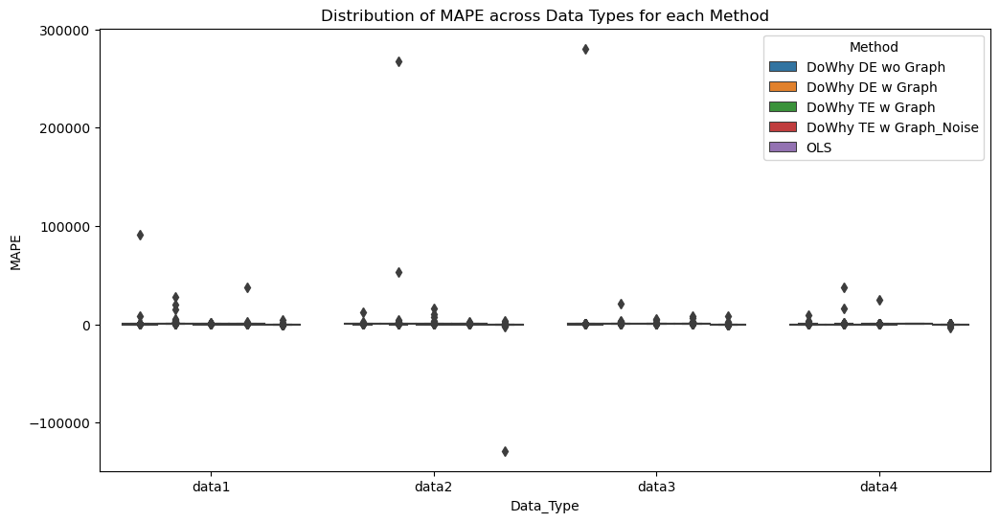

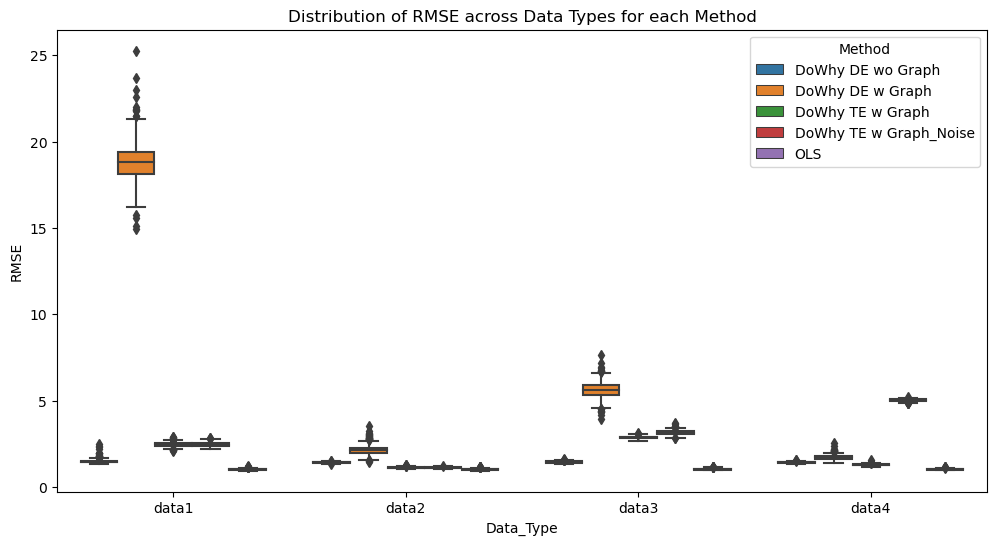

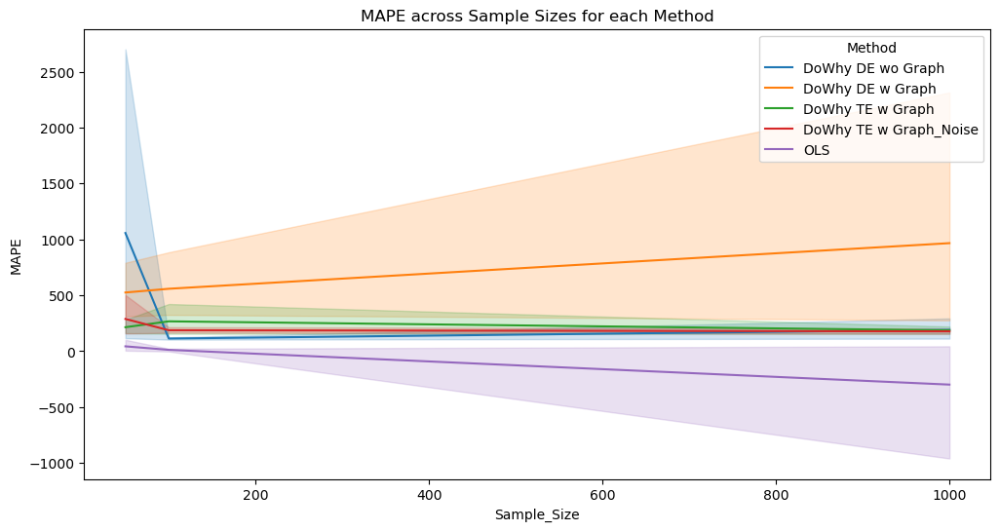

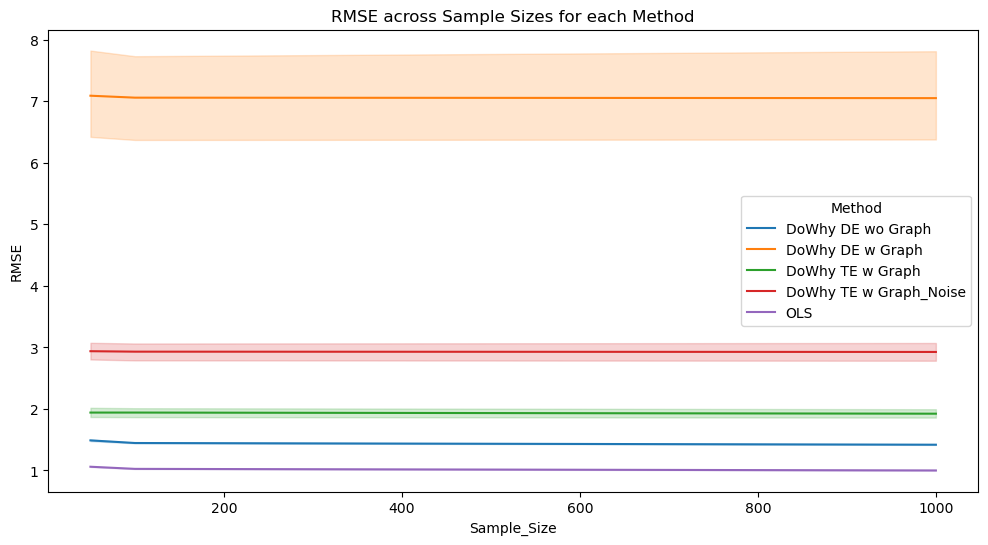

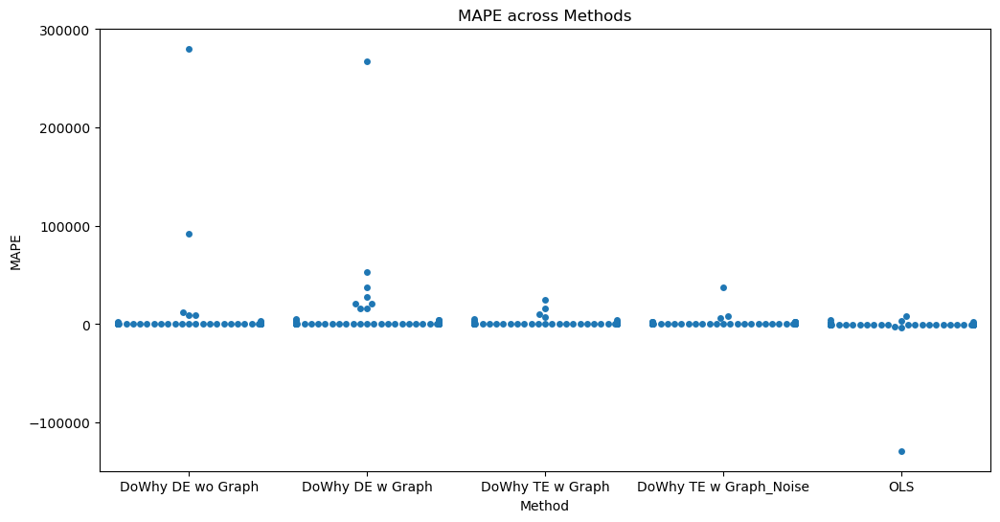

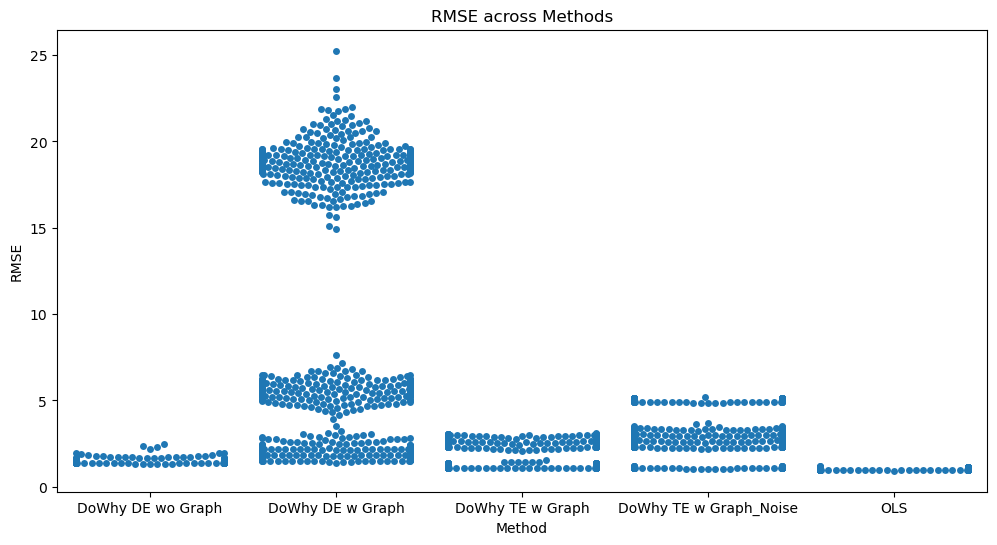

In [71]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Boxplot of MAPE across Data Types for each Method
plt.figure(figsize=(12, 6))
sns.boxplot(data=combined_df, x='Data_Type', y='MAPE', hue='Method')
plt.title('Distribution of MAPE across Data Types for each Method')
plt.show()

# 2. Boxplot of RMSE across Data Types for each Method
plt.figure(figsize=(12, 6))
sns.boxplot(data=combined_df, x='Data_Type', y='RMSE', hue='Method')
plt.title('Distribution of RMSE across Data Types for each Method')
plt.show()

# 3. Line Plot of MAPE across Sample Sizes for each Method
plt.figure(figsize=(12, 6))
sns.lineplot(data=combined_df, x='Sample_Size', y='MAPE', hue='Method')
plt.title('MAPE across Sample Sizes for each Method')
plt.show()

# 4. Line Plot of RMSE across Sample Sizes for each Method
plt.figure(figsize=(12, 6))
sns.lineplot(data=combined_df, x='Sample_Size', y='RMSE', hue='Method')
plt.title('RMSE across Sample Sizes for each Method')
plt.show()

# 5. Swarmplot of MAPE across Methods
plt.figure(figsize=(12, 6))
sns.swarmplot(data=combined_df, x='Method', y='MAPE')
plt.title('MAPE across Methods')
plt.show()

# 6. Swarmplot of RMSE across Methods
plt.figure(figsize=(12, 6))
sns.swarmplot(data=combined_df, x='Method', y='RMSE')
plt.title('RMSE across Methods')
plt.show()


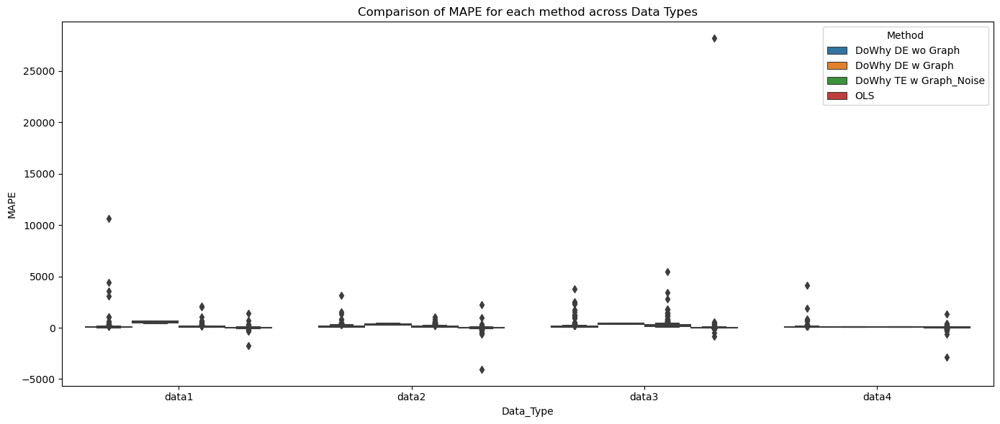

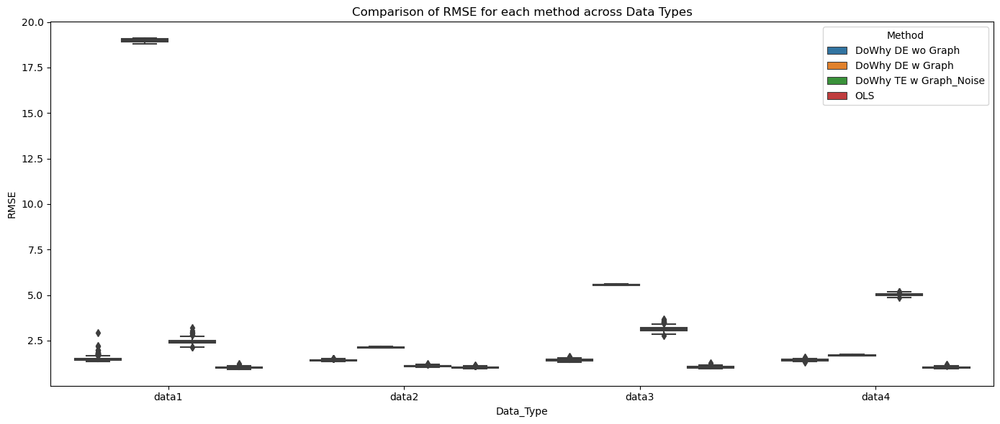

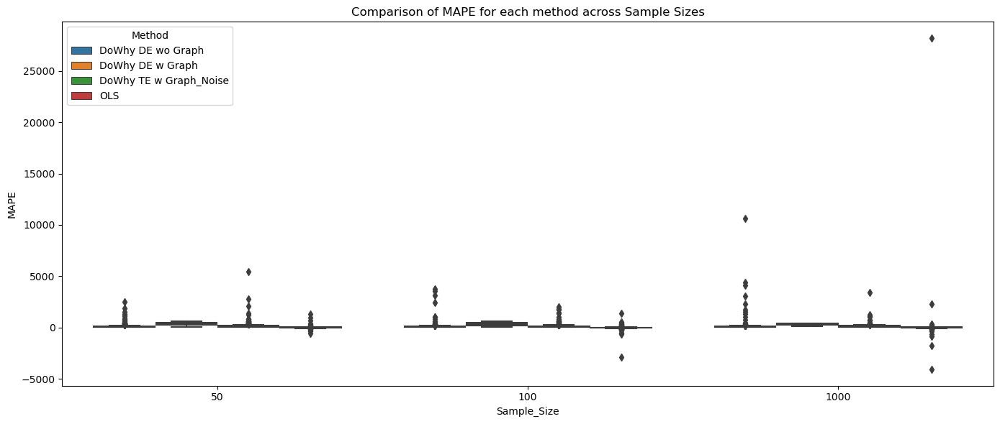

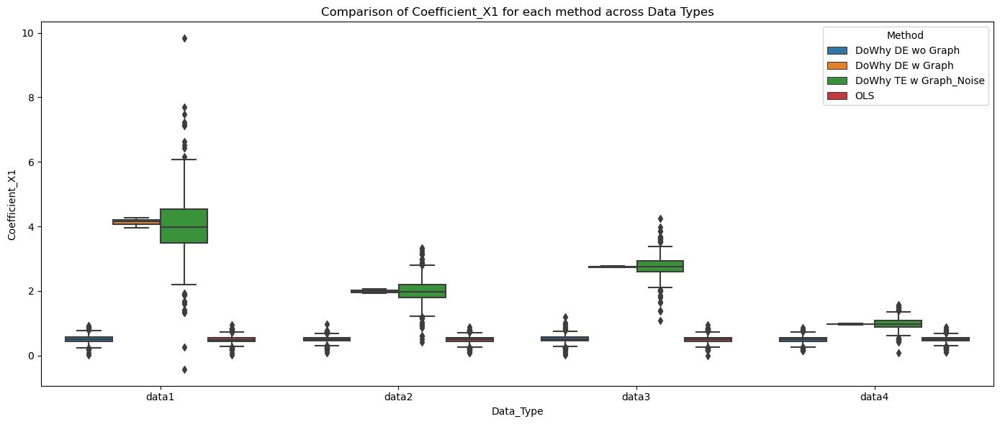

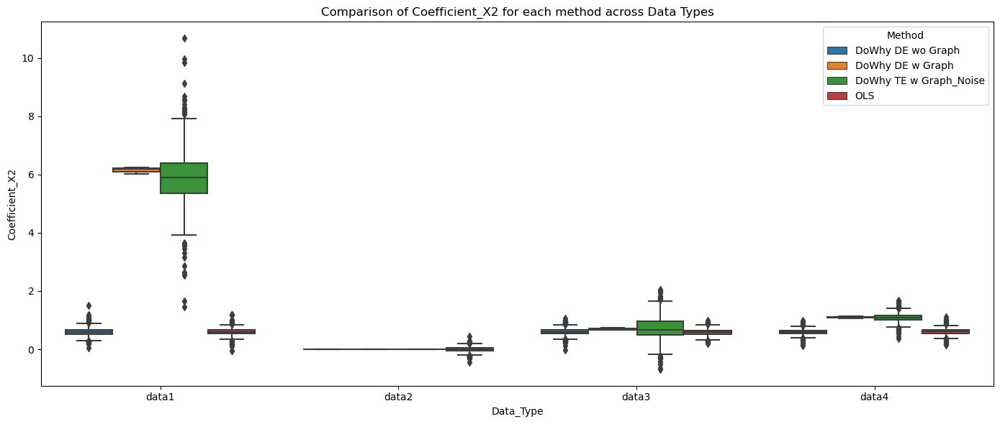

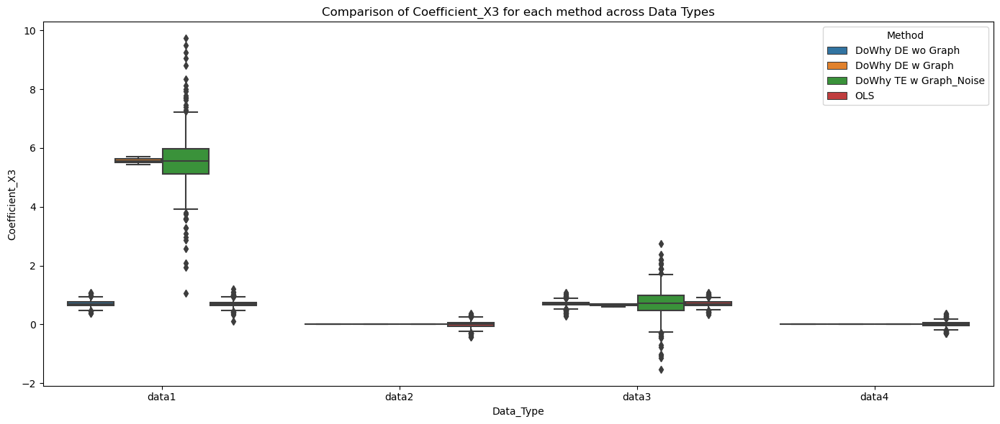

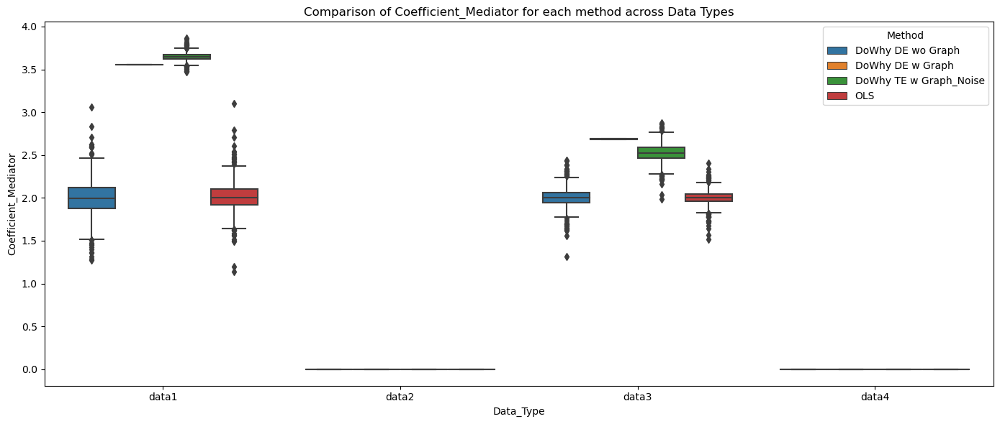

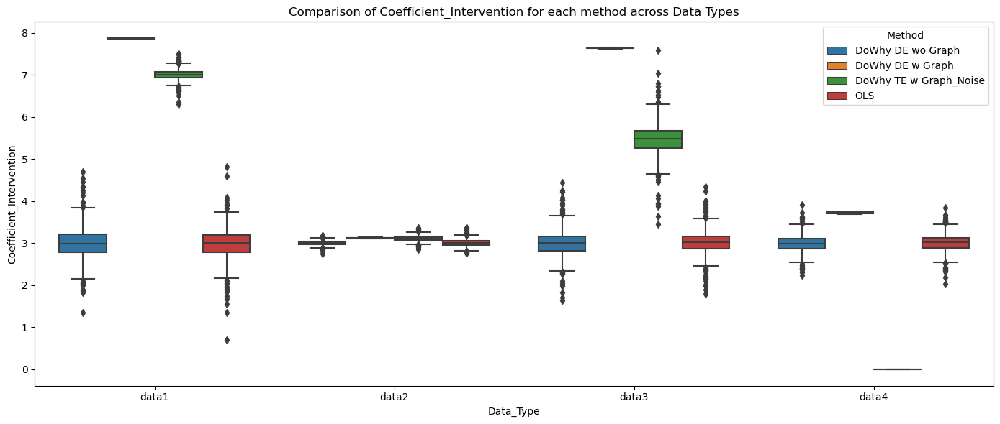

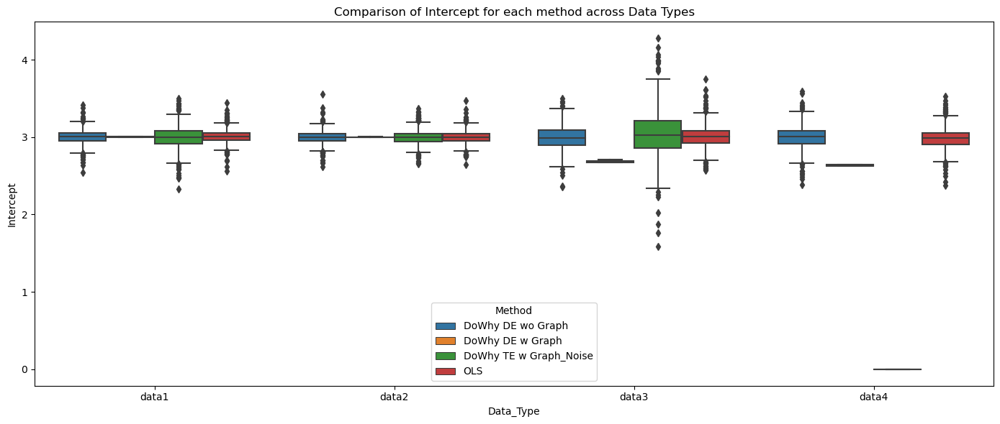

In [109]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Comparison of MAPE for each method across data types
plt.figure(figsize=(14, 6))
sns.boxplot(data=combined_df, x='Data_Type', y='MAPE', hue='Method')
plt.title('Comparison of MAPE for each method across Data Types')
plt.tight_layout()
plt.show()

# 1. Comparison of RMSE for each method across data types
plt.figure(figsize=(14, 6))
sns.boxplot(data=combined_df, x='Data_Type', y='RMSE', hue='Method')
plt.title('Comparison of RMSE for each method across Data Types')
plt.tight_layout()
plt.show()

# 2. Comparison of MAPE for each method across sample sizes
plt.figure(figsize=(14, 6))
sns.boxplot(data=combined_df, x='Sample_Size', y='MAPE', hue='Method')
plt.title('Comparison of MAPE for each method across Sample Sizes')
plt.tight_layout()
plt.show()

# 3. Coefficient plots for each variable across methods
coefficients = ['Coefficient_X1', 'Coefficient_X2', 'Coefficient_X3', 'Coefficient_Mediator', 'Coefficient_Intervention', 'Intercept']
combined_df[coefficients] = combined_df[coefficients].fillna(value=0)

for coef in coefficients:
    plt.figure(figsize=(14, 6))
    sns.boxplot(data=combined_df, x='Data_Type', y=coef, hue='Method')
    plt.title(f'Comparison of {coef} for each method across Data Types')
    plt.tight_layout()
    plt.show()


## Neural Network

In [10]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split

def neural_network_estimate(data):
    # Split data into training and test sets
    X = data.drop(columns='Outcome')
    y = data['Outcome']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create a simple neural network model
    model = keras.Sequential([
        keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        keras.layers.Dense(64, activation='relu'),
        keras.layers.Dense(1)
    ])
    
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

    # Predict on the test set
    y_pred = model.predict(X_test).flatten()

    # Calculate MAPE
    mape = 100 * np.mean(np.abs((y_test - y_pred) / y_test))

    return mape


2023-08-11 11:36:13.928502: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [11]:
# Number of iterations to obtain 100 sets of coefficients
num_iterations = 100

mape_list = []

# Datasets
data_types = ["data1", "data2", "data3", "data4"]

# Run the estimation multiple times for each data type
for data_type in data_types:
    for i in range(num_iterations):
        # Generate synthetic data
        data = generate_data(data_type, 100000)

        # Estimate using Neural Network and get MAPE
        mape = neural_network_estimate(data)
        
        # Append the MAPE to the list
        mape_list.append(mape)

    # Print the MAPE for all iterations of the current data type
    print(f"Results for {data_type}:")
    for i, mape in enumerate(mape_list):
        print(f"Iteration {i + 1}: MAPE: {mape:.2f}%")
    print("\n")


Epoch 1/10
2500/2500 [==============================] - 4s 1ms/step - loss: 2.1279 - val_loss: 1.0226
Epoch 2/10
2500/2500 [==============================] - 3s 1ms/step - loss: 1.0506 - val_loss: 1.0224
Epoch 3/10
2500/2500 [==============================] - 3s 1ms/step - loss: 1.0414 - val_loss: 1.0715
Epoch 4/10
2500/2500 [==============================] - 3s 1ms/step - loss: 1.0403 - val_loss: 1.0587
Epoch 5/10
2500/2500 [==============================] - 4s 1ms/step - loss: 1.0335 - val_loss: 1.0370
Epoch 6/10
2500/2500 [==============================] - 3s 1ms/step - loss: 1.0366 - val_loss: 1.0242
Epoch 7/10
2500/2500 [==============================] - 3s 1ms/step - loss: 1.0314 - val_loss: 1.0204
Epoch 8/10
2500/2500 [==============================] - 4s 1ms/step - loss: 1.0329 - val_loss: 1.0132
Epoch 9/10
2500/2500 [==============================] - 4s 1ms/step - loss: 1.0318 - val_loss: 1.0245
Epoch 10/10
625/625 [==============================] - 1s 819us/step
Epoch 1/10
25

KeyboardInterrupt: 

### Counterfactual Neural Network (CFNN) using TensorFlow. CFNNs are one of the neural methods for causal inference

These networks are trained to predict potential outcomes under both treatment and control conditions. They use the observed outcomes and treatment assignments to make these predictions and can be used to estimate individual treatment effects.

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.models import Model

# Generate some synthetic data
np.random.seed(42)
n_samples = 1000
X = np.random.normal(size=(n_samples, 5))
treatment_effect = 2.0
treatment_bias = -1.0
Y0 = X[:, 0] + np.random.normal(size=n_samples)
Y1 = Y0 + treatment_effect + treatment_bias

T = (np.random.uniform(size=n_samples) > 0.5).astype(int)
Y = Y0 * (1 - T) + Y1 * T

# Define a Counterfactual Neural Network
input_layer = Input(shape=(X.shape[1],))
hidden_layer = Dense(64, activation='relu')(input_layer)
hidden_layer = Dense(64, activation='relu')(hidden_layer)
output_layer_0 = Dense(1)(hidden_layer)  # Potential outcome for T=0
output_layer_1 = Dense(1)(hidden_layer)  # Potential outcome for T=1

model = Model(inputs=input_layer, outputs=[output_layer_0, output_layer_1])
model.compile(optimizer='adam', loss='mse')

# Train the CFNN
model.fit(X, [Y0, Y1], epochs=10, batch_size=32, verbose=1)

# Predict potential outcomes
Y0_pred, Y1_pred = model.predict(X)

# Calculate treatment effect
estimated_treatment_effect = np.mean(Y1_pred - Y0_pred)
print(f"Estimated Treatment Effect: {estimated_treatment_effect}")


## Real Data

## Graph

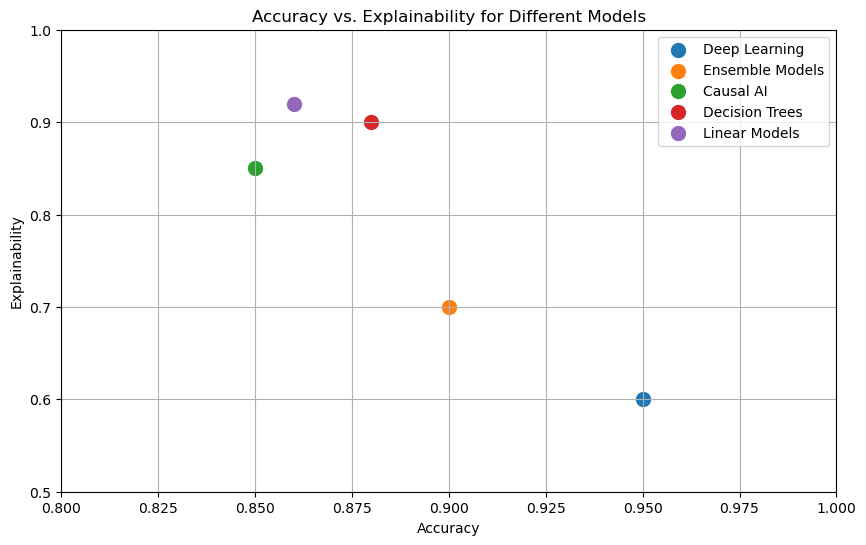

In [12]:
import matplotlib.pyplot as plt
import numpy as np
models = ["Deep Learning", "Ensemble Models", "Causal AI", "Decision Trees", "Linear Models"]

# Hypothetical accuracy scores (between 0 and 1)
accuracy_scores = [0.95, 0.90, 0.85, 0.88, 0.86]

# Hypothetical explainability scores (between 0 and 1, with 1 being the most explainable)
explainability_scores = [0.6, 0.7, 0.85, 0.9, 0.92]
plt.figure(figsize=(10, 6))
for i, model in enumerate(models):
    plt.scatter(accuracy_scores[i], explainability_scores[i], label=model, s=100)
    
plt.xlabel("Accuracy")
plt.ylabel("Explainability")
plt.title("Accuracy vs. Explainability for Different Models")
plt.legend()
plt.grid(True)
plt.xlim(0.8, 1)
plt.ylim(0.5, 1)
plt.show()


Creating graphs for accuracy and explainability requires data on each of the metrics for all the mentioned model types. However, I can help you design a hypothetical visualization based on general observations. Please note that the accuracy and explainability values we'll use here are fictional, and for a real-world scenario, you'd need to collect or generate those values based on specific applications and datasets.

1. **Set Up**:
Let's begin by setting up our environment:

```python
import matplotlib.pyplot as plt
import numpy as np
```

2. **Generate Hypothetical Data**:
For the sake of visualization, we're assuming some fictional accuracy and explainability scores for each model:

```python
models = ["Deep Learning", "Ensemble Models", "Causal AI", "Decision Trees", "Linear Models"]

# Hypothetical accuracy scores (between 0 and 1)
accuracy_scores = [0.95, 0.90, 0.85, 0.88, 0.86]

# Hypothetical explainability scores (between 0 and 1, with 1 being the most explainable)
explainability_scores = [0.6, 0.7, 0.85, 0.9, 0.92]
```

3. **Visualize**:
We can create a scatter plot where the x-axis represents accuracy and the y-axis represents explainability.

```python
plt.figure(figsize=(10, 6))
for i, model in enumerate(models):
    plt.scatter(accuracy_scores[i], explainability_scores[i], label=model, s=100)
    
plt.xlabel("Accuracy")
plt.ylabel("Explainability")
plt.title("Accuracy vs. Explainability for Different Models")
plt.legend()
plt.grid(True)
plt.xlim(0.8, 1)
plt.ylim(0.5, 1)
plt.show()
```

4. **Interpretation**:

From our hypothetical graph:

- Deep learning models have high accuracy but comparatively lower explainability.
- Linear models and decision trees are more explainable but might compromise a bit on accuracy.
- Ensemble models, which often include decision trees (like Random Forests or Gradient Boosted Trees), have a balance between accuracy and explainability.
- Causal AI, which is designed to uncover cause-and-effect relationships, might have slightly less accuracy but offers higher explainability.

Remember, the actual results can vary significantly based on the specific problem, dataset, and implementation. The data provided here is fictional and meant for illustrative purposes only. In real-world applications, it's essential to test each model on the specific problem and dataset to get accurate and explainable results.